# Refining Data

Within this section I'll evaluate the outliers described in the last sheet. The purpose of this sheet is improve the data that is passed into our model on the next sheet by improving or eliminating the data points that produced the highest residuals in the last sheet.

### Imports

In [393]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import requests
import pickle
import time
import seaborn as sns


import pycaret
from pycaret.regression import *
from pycaret.regression import RegressionExperiment

from pandas import json_normalize
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from scipy.stats import zscore

### Dataframe Imports

In [2]:
with open('pickles/df.pkl', 'rb') as f:
    df = pickle.load(f)
with open('pickles/outliers_list.pkl', 'rb') as f:
    outliers_list = pickle.load(f)
with open('pickles/high_residuals.pkl', 'rb') as f:
    high_residuals = pickle.load(f)

### Data Verification

As stated in the section introduction, it's important that I don't immediately remove outliers. I need to determine why the outliers are outliers and try to resolve the problem in the data. If there is no reasonable way to resolve an outlier,I may decide to remove the datapoint entirely, however my first attempt will be to correct the data based on external sources.

This iteration of the outliers list is specifically related to the 'cost_km_2021' feature.

In [3]:
drop_index =[]

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [ ]:
df[df.index.isin(outliers_list)]

### Hong Kong 

In [ ]:
len(df.loc[(df['country']=='HK') & df.index.isin(outliers_list)])

In [7]:
df.loc[(df['country']=='HK') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
0,HK,Hong Kong,2000,2005,0.0,1.3,0.00,0.00,1.30,0.0,1.0,80.0,1432,0,18700,HKD,2005,0.183704,3435.273387,2642.517990,0.0,0.0,0.0,1.39,4775.030008,3673.100006,5,6488.761905,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,15,6.871840e+06,23696.001107,91.142996,1653.430868,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2005,10,68,0,1,3,14,21.69928571,0.769231
4,HK,Hong Kong,2005,2009,0.0,1.8,1.00,1.80,0.00,0.0,1.0,80.0,1432,0,3345.68,HKD,2009,0.192726,644.799960,358.222200,0.0,0.0,0.0,1.26,812.447950,451.359972,4,6640.761905,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,11,7.021479e+06,24211.995529,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2009,19,124,0,1,3,25,21.69928571,0.555556
5,HK,Hong Kong,2011,2016,0.0,2.6,1.00,2.60,0.00,0.0,2.0,80.0,1435,0,7200,HKD,2013,0.180259,1297.863446,499.178249,0.0,0.0,0.0,1.16,1505.521598,579.046768,5,676.000000,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,7,7.174376e+06,24739.226033,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2013,23,150,0,1,2,34,21.69928571,0.769231
6,HK,Hong Kong,2023,2030,0.0,2.4,0.00,0.00,2.40,0.0,2.0,80.0,1435,1,11400,HKD,2015,0.171496,1955.049971,814.604155,0.0,0.0,0.0,1.14,2228.756967,928.648736,7,6944.095238,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,5,7.252068e+06,25007.131070,22.368809,8016.431435,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2015,30,193,0,1,2,37,21.69928571,0.833333
7,HK,Hong Kong,2005,2009,1.0,3.8,1.00,3.80,0.00,0.0,4.0,80.0,1432,0,8632,HKD,2009,0.192726,1663.611958,437.792620,0.0,0.0,0.0,1.26,2096.151066,551.618702,4,6640.761905,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,11,7.021479e+06,24211.995529,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2009,19,124,0,1,3,25,21.69928571,1.052632
9,HK,Hong Kong,1999,2002,0.0,4.0,1.00,4.00,0.00,0.0,5.0,80.0,1432,0,16000,HKD,2000,0.140630,2250.085785,562.521446,0.0,0.0,0.0,1.57,3532.634682,883.158670,3,6347.619048,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,20,6.689269e+06,23066.444511,91.142996,1653.430868,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2000,1,13,1,1,4,5,21.69928571,1.250000
10,HK,Hong Kong,2011,2016,0.0,7.0,0.71,4.97,2.00,0.0,5.0,80.0,1435,0,16900,HKD,2013,0.180259,3046.373923,435.196275,0.0,0.0,0.0,1.16,3533.793750,504.827679,5,6837.047619

In [8]:
df.loc[(df['country']=='HK') & (df['end_year']==2005)& (df['length']==1.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
0,HK,Hong Kong,2000,2005,0.0,1.3,0.0,0.0,1.3,0.0,1.0,80.0,1432,0,18700,HKD,2005,0.183704,3435.273387,2642.51799,0.0,0.0,0.0,1.39,4775.030008,3673.100006,5,6488.761905,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,15,6.871840e+06,23696.001107,91.142996,1653.430868,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2005,10,68,0,1,3,14,21.69928571,0.769231


As noted within the project notes (cost column), this project is an outlier mostly due to the nature of construction. The rail project was also used to create a U-turn point for the terminating rail lines. This causes some additional construction expenses that wouldn't normally be included in a simple line extension.

###### Project Changes:
Is outlier; remove.

In [9]:
drop_index.extend(df.loc[(df['country']=='HK') & (df['end_year']==2005)& (df['length']==1.3)].index.tolist())

In [10]:
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==1.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
4,HK,Hong Kong,2005,2009,0.0,1.8,1.0,1.8,0.0,0.0,1.0,80.0,1432,0,3345.68,HKD,2009,0.192726,644.79996,358.2222,0.0,0.0,0.0,1.26,812.44795,451.359972,4,6640.761905,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,11,7.021479e+06,24211.995529,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2009,19,124,0,1,3,25,21.69928571,0.555556


This line corresponds to the Tung Chung Line extension in Hong Kong. The [official site](https://mtrtungchunglineextension.hk/?lang=en) confirms the overall cost of the project being HK19.5B, which is different than the provided data. However, it may not be incorrect since the two are in different currencies, I'll update it anyways.

###### Project Changes:
Update cost.

In [11]:
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==1.8),'length'] = 1.8
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==1.8),'cost'] = 19500
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==1.8),'cost_real'] = (19500)*0.192726
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==1.8),'cost_km'] = (19500)*0.192726/1.8
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==1.8),'cost_real_2021'] = 19500*0.192726*1.626471
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==1.8),'cost_km_2021'] = (19500*0.192726*1.626471)/1.8

In [12]:
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==2.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
5,HK,Hong Kong,2011,2016,0.0,2.6,1.0,2.6,0.0,0.0,2.0,80.0,1435,0,7200,HKD,2013,0.180259,1297.863446,499.178249,0.0,0.0,0.0,1.16,1505.521598,579.046768,5,676.0,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,7,7.174376e+06,24739.226033,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2013,23,150,0,1,2,34,21.69928571,0.769231


This line is also for the Kwung Tung extension, but it appears to be a different segment. All data provided is correct. The 7.2B HKD is corroborated [here](https://www.legco.gov.hk/yr16-17/chinese/panels/tp/tp_rdp/papers/tp_rdpcb4-152-1-c.pdf) in a government source.

###### Project Changes:
The overall price doesn't appear to be an egregious outlier. Keep and re-evaluate against all data.

In [13]:
df.loc[(df['country']=='HK') & (df['end_year']==2030)& (df['length']==2.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
6,HK,Hong Kong,2023,2030,0.0,2.4,0.0,0.0,2.4,0.0,2.0,80.0,1435,1,11400,HKD,2015,0.171496,1955.049971,814.604155,0.0,0.0,0.0,1.14,2228.756967,928.648736,7,6944.095238,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,5,7.252068e+06,25007.13107,22.368809,8016.431435,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2015,30,193,0,1,2,37,21.69928571,0.833333


This line corresponds to the Tuen Mun South Extension. This is a project that is to be completed in the future. Cost estimates project the construction cost will be approximately 11.4bn CNY, which is equivalent to 12.2bn HKD.

This project is also a bit complex due to the funding arrangment, which includes the purchase of land for approximately 2,000 housing units.

###### Project Changes:
is outlier; remove.

In [14]:
drop_index.extend(df.loc[(df['country']=='HK') & (df['end_year']==2030)& (df['length']==2.4)].index.tolist())

In [15]:
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==3.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
7,HK,Hong Kong,2005,2009,1.0,3.8,1.0,3.8,0.0,0.0,4.0,80.0,1432,0,8632,HKD,2009,0.192726,1663.611958,437.79262,0.0,0.0,0.0,1.26,2096.151066,551.618702,4,6640.761905,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,11,7.021479e+06,24211.995529,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2009,19,124,0,1,3,25,21.69928571,1.052632


This corresponds to the Kowloon Southern Link in HK. [Chinese sources](https://zh.wikipedia.org/zh-hans/%E4%B9%9D%E9%BE%8D%E5%8D%97%E7%B6%AB) list the total project cost as being 8.3bn HKD. 

###### Project Changes:
Adjust cost.

In [16]:
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==3.8),'length'] = 3.8
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==3.8),'cost'] = 8300
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==3.8),'cost_real'] = (8300)*0.192726
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==3.8),'cost_km'] = (8300)*0.192726/3.8
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==3.8),'cost_real_2021'] = 8300*0.192726*1.26
df.loc[(df['country']=='HK') & (df['end_year']==2009)& (df['length']==3.8),'cost_km_2021'] = (8300*0.192726*1.26)/3.8

In [17]:
df.loc[(df['country']=='HK') & (df['end_year']==2002)& (df['length']==4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
9,HK,Hong Kong,1999,2002,0.0,4.0,1.0,4.0,0.0,0.0,5.0,80.0,1432,0,16000,HKD,2000,0.14063,2250.085785,562.521446,0.0,0.0,0.0,1.57,3532.634682,883.15867,3,6347.619048,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,20,6.689269e+06,23066.444511,91.142996,1653.430868,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2000,1,13,1,1,4,5,21.69928571,1.25


This index refers to the Tseung Kwan O Extension in Hong Kong. This [official source](https://www.legco.gov.hk/yr99-00/chinese/panels/fa/papers/1503c.pdf) states the overall cost to be 30.5Bn HKD. There is much confusion regarding the overall cost of the project, mostly because the project was cancelled and then started again at a later date with a different configuration.

I believe the 30.5Bn HKD figure refers to the cost of the entire 12.5km stretch, however this line item refers specifically to the extension. The extension itself cost 18Bn HKD and was 7km in length.

###### Project Changes:
Adjust cost and length.

In [18]:
df.loc[(df['country']=='HK') & (df['end_year']==2002)& (df['length']==4),'length'] = 7
df.loc[(df['country']=='HK') & (df['end_year']==2002)& (df['length']==7),'cost'] = 18000
df.loc[(df['country']=='HK') & (df['end_year']==2002)& (df['length']==7),'cost_real'] = (18000)*0.14063
df.loc[(df['country']=='HK') & (df['end_year']==2002)& (df['length']==7),'cost_km'] = (18000)*0.14063/7
df.loc[(df['country']=='HK') & (df['end_year']==2002)& (df['length']==7),'cost_real_2021'] = 18000*0.14063*1.57
df.loc[(df['country']=='HK') & (df['end_year']==2002)& (df['length']==7),'cost_km_2021'] = (18000*0.14063*1.57)/7

In [19]:
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
10,HK,Hong Kong,2011,2016,0.0,7.0,0.71,4.97,2.0,0.0,5.0,80.0,1435,0,16900,HKD,2013,0.180259,3046.373923,435.196275,0.0,0.0,0.0,1.16,3533.79375,504.827679,5,6837.047619,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,7,7.174376e+06,24739.226033,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2013,23,150,0,1,2,34,21.69928571,0.714286


This is the South Island Line (East)in HK. The overall length is supposed to be 7.4km instead of 7km, however ever other data is correct. The price data is corroborated [here](https://www.legco.gov.hk/yr16-17/chinese/panels/tp/tp_rdp/papers/tp_rdpcb4-152-1-c.pdf) under item #7.

###### Project Changes:
I'll adjust the length.

In [20]:
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==7),'length'] = 7.4
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==7.4),'cost'] = 16900
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==7.4),'cost_real'] = (16900)*0.180259
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==7.4),'cost_km'] = 16900/7.4
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==7.4),'cost_real_2021'] = ((16900)*0.180259)*1.163176
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==7.4),'cost_km_2021'] = (((16900)*0.180259)*1.163176)/7.4

In [21]:
df.loc[(df['country']=='HK') & (df['end_year']==2029)& (df['length']==1.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
11,HK,Hong Kong,2023,2029,0.0,1.8,1.0,1.8,0.0,0.0,1.0,80.0,1435,0,18700,HKD,2016,0.168569,3152.240223,1751.244568,0.0,0.0,0.0,1.13,3562.031452,1978.906362,6,6987.238095,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,4,7.291229e+06,25142.169578,22.368809,8016.431435,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2016,37,239,0,1,2,51,21.69928571,0.555556


This index is the Tung Chung Line extension; it's reduendant and I will remove.

###### Project Changes:
redundant; remove

In [22]:
drop_index.extend(df[(df['country']=='HK') & (df['end_year']==2029)& (df['length']==1.8)].index.tolist())

In [23]:
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
12,HK,Hong Kong,2009,2016,0.0,3.0,1.0,3.0,0.0,0.0,3.0,80.0,1435,0,18500,HKD,2012,0.183344,3391.864073,1130.621358,0.0,0.0,0.0,1.18,4002.399606,1334.133202,7,6809.619048,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,8,7.135842e+06,24606.351734,46.826807,4711.635127,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2012,23,150,0,1,2,37,21.69928571,1.0


This index is for the West Island Line in HK. The overall cost by several sources in 2017 [was reported](https://www.railway-technology.com/projects/west-island-line/#:~:text=The%20railway%20project%20was%20officially,bn%20according%20to%202008%20pricing.) to be 15.4Bn HKD.

###### Project Changes:
Adjust cost.

In [24]:
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==3),'length'] = 3
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==3),'cost'] = 15400
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==3),'cost_real'] = (15400)*0.183344
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==3),'cost_km'] = 15400/3
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==3),'cost_real_2021'] = ((15400)*0.183344)*1.18
df.loc[(df['country']=='HK') & (df['end_year']==2016)& (df['length']==3),'cost_km_2021'] = (((15400)*0.183344)*1.18)/3

In [25]:
df.loc[(df['country']=='HK') & (df['end_year']==1986)& (df['length']==12.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
13,HK,Hong Kong,1981,1986,0.0,12.5,0.84,10.5,2.0,0.0,14.0,80.0,1432,0,8748,HKD,1983,0.238892,2089.82322,167.185858,0.0,0.0,0.0,2.72,5684.319159,454.745533,5,5399.090909,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,37,6.104044e+06,21048.428761,99.922875,447.118997,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,1983,1,13,1,1,6,4,21.69928571,1.12


This index is for the Island Line in Hong Kong. The final construction cost was $4.1 B HK, which differs from the provided data.

###### Project Changes:
Update Cost

In [26]:
df.loc[(df['country']=='HK') & (df['end_year']==1986)& (df['length']==12.5),'cost'] = 4100
df.loc[(df['country']=='HK') & (df['end_year']==1986)& (df['length']==12.5),'cost_real'] = (4100)*0.251256
df.loc[(df['country']=='HK') & (df['end_year']==1986)& (df['length']==12.5),'cost_km'] = 4100/12.5
df.loc[(df['country']=='HK') & (df['end_year']==1986)& (df['length']==12.5),'cost_real_2021'] = ((4100)*0.251256)*3.288471
df.loc[(df['country']=='HK') & (df['end_year']==1986)& (df['length']==12.5),'cost_km_2021'] = (((4100)*0.251256)*3.288471)/12.5

In [27]:
df.loc[(df['country']=='HK') & (df['end_year']==2022)& (df['length']==17)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
16,HK,Hong Kong,2012,2022,1.0,17.0,0.88,14.96,2.04,0.0,9.0,80.0,1435,0,87300,HKD,2017,0.16635,14522.3277,854.254571,0.0,0.0,0.0,1.11,16119.78375,948.222574,10,7041.142857,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,3,7.330602e+06,25277.937294,22.368809,8016.431435,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2017,36,224,0,1,2,44,21.69928571,0.529412


This index corresponds to the Sha Tin-Central Link project in Hong Kong. The length data and length component data all appear to be correct. Several different news sources report a different figure for the total cost of the project.

It appears that the initial budget was HK37.4 billion for construction. In 2012 that figure was reported to be HK79.8 billion. The China Morning Post reported in 2022 that the total cost was HK90.7 billion.

According to these sources the project endured many delays and cost overruns stemming from controversy surrounding the quality of the construction work, which needed to be re-done and caused delays.

The PPP rate and inflation index are correct.

###### Project Changes: 

I'll adjust the values according to my summary above.

In [28]:
df.loc[(df['country']=='HK') & (df['end_year']==2022)& (df['length']==17),'cost'] = 90700
df.loc[(df['country']=='HK') & (df['end_year']==2022)& (df['length']==17),'cost_real'] = (90700)*.01664
df.loc[(df['country']=='HK') & (df['end_year']==2022)& (df['length']==17),'cost_km'] = 90700/17
df.loc[(df['country']=='HK') & (df['end_year']==2022)& (df['length']==17),'cost_real_2021'] = ((90700)*.01664)*1.105459
df.loc[(df['country']=='HK') & (df['end_year']==2022)& (df['length']==17),'cost_km_2021'] = (((90700)*.01664)*1.105459)/17

### Germany

In [29]:
len(df.loc[(df['country']=='DE') & df.index.isin(outliers_list)])

2

In [30]:
df.loc[(df['country']=='DE') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
192,DE,Munich,2016,2028,1.0,7.2,1.0,7.2,0.0,0.0,3.0,80.0,1435,1,3849,EUR,2020,1.379307,5308.950872,737.354288,0.0,0.0,0.0,1.05,5574.398415,774.222002,12,308.200000,Europe,Western Europe,518.0,48.1375,11.575,2606021.0,0,2.606021e+06,5030.928571,0.240783,41086.72967,Cambisols,6.0,0.0,4.0,1.0,3.0,2.0,1.0,20.0,5.0,0.0,0.0,0.0,14.0,6.0,0.0,1.0,3.0,9.0,1.0,12.0,0.0,4.0,0.0,0.0,1.0,3.0,1.0,1.0,0.0,0.0,4.0,526.0,9.191667,5.250,13.133333,81.191667,2020,9,56,1,1,3,31,17.506,0.416667
775,DE,Karlsruhe,2010,2021,1.0,4.8,1.0,4.8,0.0,0.0,6.0,80.0,1435,1,1457.3,EUR,2016,1.328713,1936.333390,403.402790,0.0,0.0,0.0,1.13,2188.056731,455.845152,11,235.712929,Europe,Western Europe,173.5,49.0092,8.404,308436.0,4,3.011433e+05,1735.695991,0.240783,41086.72967,Cambisols,6.0,2.0,2.0,4.0,0.0,4.0,1.0,22.0,2.0,0.0,0.0,0.0,10.0,12.0,1.0,0.0,1.0,9.0,0.0,15.0,0.0,1.0,1.0,0.0,3.0,2.0,1.0,0.0,0.0,0.0,5.0,122.0,10.533333,6.075,14.983333,64.200000,2016,7,45,2,0,4,24,17.506,1.250000


In [31]:
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
190,DE,Munich,1965,1971,1.0,11.4,0.36,4.104,7.296,0.0,5.0,80.0,1435,1,459,DM,1968,0.76443,350.87317,30.778348,0.0,0.0,0.0,7.79,2733.301992,239.763333,6,221.391212,Europe,Western Europe,518.0,48.1375,11.575,2606021.0,52,1.851048e+06,3573.452356,16.0,2761.0,Cambisols,6.0,0.0,4.0,1.0,3.0,2.0,1.0,20.0,5.0,0.0,0.0,0.0,14.0,6.0,0.0,1.0,3.0,9.0,1.0,12.0,0.0,4.0,0.0,0.0,1.0,3.0,1.0,1.0,0.0,0.0,4.0,526.0,9.191667,5.25,13.133333,81.191667,1968,0,4,7,1,10,5,17.506,0.438596


This line is unique as the project was built when Germany was still using the Deutsch Mark. The DM is now an obsolete currency, and so I've converted the data to use the Euro instead. This was a confounding time period and so many issues may be present, at least for extrapolating this data to today.

Firstly, the PPP rate needs to be investigated. I have a PPP rate of ~.7, which corresponds with the last known data from the world bank for Germany. This however aligns with the switch the the Euro and so I'll need a different figure to use. The [IMF lists a PPP rate](https://www.imf.org/external/datamapper/PPPEX@WEO/DEU?zoom=DEU&highlight=DEU) of .93 in 1980, which I believe is the closest I'll be able to get to the actual value.

#### Project Changes:

Update PPP rate and costs

In [32]:
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4),'length'] = 11.4
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4),'cost'] = 459
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4),'ppp_rate'] = 1/.93
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4),'cost_real'] = 459*(1/.93)
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4),'cost_km'] = 459*(1/.93)/11.4
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4),'cost_real_2021'] = 459*(1/.93)*7.79
df.loc[(df['country']=='DE') & (df['end_year']==1971)& (df['length']==11.4),'cost_km_2021'] = 459*(1/.93)*7.79/11.4

In [33]:
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==7.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
192,DE,Munich,2016,2028,1.0,7.2,1.0,7.2,0.0,0.0,3.0,80.0,1435,1,3849,EUR,2020,1.379307,5308.950872,737.354288,0.0,0.0,0.0,1.05,5574.398415,774.222002,12,308.2,Europe,Western Europe,518.0,48.1375,11.575,2606021.0,0,2606021.0,5030.928571,0.240783,41086.72967,Cambisols,6.0,0.0,4.0,1.0,3.0,2.0,1.0,20.0,5.0,0.0,0.0,0.0,14.0,6.0,0.0,1.0,3.0,9.0,1.0,12.0,0.0,4.0,0.0,0.0,1.0,3.0,1.0,1.0,0.0,0.0,4.0,526.0,9.191667,5.25,13.133333,81.191667,2020,9,56,1,1,3,31,17.506,0.416667


This project corresponds to the 'second trunk line' in Munich Germany. This project also goes by the name of 'Trunk Line 2'. It's planned to open in 2026, according to [official sources](https://www.2.stammstrecke-muenchen.de/home.html). The [cost data appears to be correct](https://www.2.stammstrecke-muenchen.de/home.html). It is not on a railroad line and it will have a max speed of 80 km/hr.

It appears the total length is erroneous, as the length of the tunnel is supposed to be 11.9km, which is about 7.2 miles. This explains the error.

###### Project Changes:
I'll change the end date, duration, railroad binary, and the length.

In [34]:
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==7.2),'length'] = 11.9
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==11.9),'rr?'] = 0
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==11.9),'end_year'] = 2026
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==11.9),'duration'] = 10
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==11.9),'cost_km'] = 5196.15/11.9
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==11.9),'cost_real_2021'] = 12300*.147*1.059897
df.loc[(df['country']=='DE') & (df['end_year']==2028)& (df['length']==11.9),'cost_km_2021'] = 5440.3/11.9

In [35]:
df.loc[(df['country']=='DE') & (df['end_year']==2016)& (df['length']==3.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
654,DE,Dusseldorf,2007,2016,0.0,3.4,1.0,3.4,0.0,0.0,6.0,80.0,1435,0,929,EUR,2012,1.270251,1180.063157,347.077399,0.0,0.0,0.0,1.18,1392.474525,409.551331,9,230.750625,Europe,Western Europe,217.41,51.2333,6.7833,645923.0,8,630628.051403,2900.639581,0.205739,36684.6907,Cambisols,6.0,0.0,1.0,2.0,0.0,7.0,2.0,26.0,4.0,0.0,0.0,1.0,16.0,10.0,0.0,1.0,0.0,0.0,1.0,10.0,0.0,3.0,2.0,0.0,5.0,3.0,0.0,0.0,0.0,1.0,2.0,46.0,10.375,6.458333,14.3,64.4,2012,5,38,2,1,4,23,17.506,1.764706


This project corresponds to the Wehrhahn Line in Dusseldorf. Most of the project information appears correct. The length information is correct, however the cost data varies based on the time it was reported.

The initial budget was about 350 million euros, rose to 650M euro in 2014 , and finished at approximately 843.6M Euros as confirmed by (official sources)[http://www.wehrhahnlinie-duesseldorf.de/detail/en/5/FactsandFigures]

###### Project Changes:
I'll change the cost information to reflect the information stated above.

In [36]:
df.loc[(df['country']=='DE') & (df['end_year']==2016)& (df['length']==3.4),'length'] = 3.4
df.loc[(df['country']=='DE') & (df['end_year']==2016)& (df['length']==3.4),'cost'] = 844
df.loc[(df['country']=='DE') & (df['end_year']==2016)& (df['length']==3.4),'cost_real'] = 844*1.270251
df.loc[(df['country']=='DE') & (df['end_year']==2016)& (df['length']==3.4),'cost_km'] = 844*1.270251/3.4
df.loc[(df['country']=='DE') & (df['end_year']==2016)& (df['length']==3.4),'cost_real_2021'] = 844*1.270251*1.180214
df.loc[(df['country']=='DE') & (df['end_year']==2016)& (df['length']==3.4),'cost_km_2021'] = (844*1.270251*1.180214)/3.4

In [37]:
df.loc[(df['country']=='DE') & (df['end_year']==2021)& (df['length']==4.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
775,DE,Karlsruhe,2010,2021,1.0,4.8,1.0,4.8,0.0,0.0,6.0,80.0,1435,1,1457.3,EUR,2016,1.328713,1936.33339,403.40279,0.0,0.0,0.0,1.13,2188.056731,455.845152,11,235.712929,Europe,Western Europe,173.5,49.0092,8.404,308436.0,4,301143.254374,1735.695991,0.240783,41086.72967,Cambisols,6.0,2.0,2.0,4.0,0.0,4.0,1.0,22.0,2.0,0.0,0.0,0.0,10.0,12.0,1.0,0.0,1.0,9.0,0.0,15.0,0.0,1.0,1.0,0.0,3.0,2.0,1.0,0.0,0.0,0.0,5.0,122.0,10.533333,6.075,14.983333,64.2,2016,7,45,2,0,4,24,17.506,1.25


This project corresponds to the Karlsruhe Kombilösung. There's varying information because the [overall cost](https://bnn.de/karlsruhe/karlsruhe-stadt/kosten-fuer-karlsruher-kombiloesung-werden-hin-und-her-geschoben) of the project increased from 500M EUR to just under 1.5Bn Euro over the course of planning.

###### Project Changes:
This isn't an erroneous outlier; keep until final pass.

### Italy

In [38]:
len(df.loc[(df['country']=='IT') & df.index.isin(outliers_list)])

2

In [39]:
df.loc[(df['country']=='IT') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
425,IT,Naples,1999,2021,0.0,4.3,1.0,4.3,0.0,0.0,5.0,80.0,1435,0,1748,EUR,2017,1.449496,2533.718899,589.236953,4.3,4.3,0.0,1.11,2812.427978,654.053018,22,204.710937,Europe,Southern Europe,583.0,40.8333,14.2500,966144.0,3,9.673043e+05,1659.184050,3.86843,30230.2263,Cambisols,6.0,2.0,0.0,1.0,0.0,0.0,7.0,23.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,1.0,3.0,11.0,1.0,16.0,1.0,4.0,2.0,0.0,0.0,9.0,2.0,0.0,0.0,1.0,6.0,29.0,16.95,12.2,21.7,84.00,2017,12,82,1,0,3,28,38.05254545,1.162791
428,IT,Rome,2013,2023,0.0,2.7,1.0,2.7,0.0,0.0,2.0,80.0,1435,1,861,EUR,2018,1.467957,1263.910725,468.115083,2.7,2.7,0.0,1.08,1365.023583,505.564290,10,204.322226,Europe,Southern Europe,842.0,41.8931,12.4828,2872800.0,2,2.849387e+06,3384.070223,3.86843,30230.2263,Luvisols,18.0,1.0,0.0,1.0,1.0,0.0,8.0,17.0,1.0,0.0,0.0,0.0,14.0,1.0,1.0,0.0,2.0,8.0,0.0,18.0,0.0,2.0,3.0,0.0,0.0,4.0,2.0,0.0,0.0,0.0,12.0,42.0,16.00,11.1,21.0,66.25,2018,9,63,1,1,3,28,38.05254545,0.740741


In [40]:
df.loc[(df['country']=='IT') & (df['end_year']==2021)& (df['length']==4.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
425,IT,Naples,1999,2021,0.0,4.3,1.0,4.3,0.0,0.0,5.0,80.0,1435,0,1748,EUR,2017,1.449496,2533.718899,589.236953,4.3,4.3,0.0,1.11,2812.427978,654.053018,22,204.710937,Europe,Southern Europe,583.0,40.8333,14.25,966144.0,3,967304.300917,1659.18405,3.86843,30230.2263,Cambisols,6.0,2.0,0.0,1.0,0.0,0.0,7.0,23.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,1.0,3.0,11.0,1.0,16.0,1.0,4.0,2.0,0.0,0.0,9.0,2.0,0.0,0.0,1.0,6.0,29.0,16.95,12.2,21.7,84.0,2017,12,82,1,0,3,28,38.05254545,1.162791


This line corresponds to the 'Line-1 City Center' Line in Naples. This line is complicated, in part due to the total duration of the project which is an outlier in of itself. It also appears to be an open project, rather than a project that has been completed in multiple phases. An [official source](http://www.societaitalianagallerie.it/notizia/1510/metro-napoli-linea-1/#:~:text=Sono%20in%20costruzione%204%20km,a%2045%20milioni%20l'anno.) lists the total cost of 3.8Bn Euros for 18.2km. This equates to a per km price of 0.209bn/km. For 4.3km, total cost for this section would be 897million.

###### Project Changes:
Adjust cost.

In [41]:
df.loc[(df['country']=='IT') & (df['end_year']==2021)& (df['length']==4.3),'length'] = 4.3
df.loc[(df['country']=='IT') & (df['end_year']==2021)& (df['length']==4.3),'cost'] = 897
df.loc[(df['country']=='IT') & (df['end_year']==2021)& (df['length']==4.3),'cost_real'] = 897*1.449496
df.loc[(df['country']=='IT') & (df['end_year']==2021)& (df['length']==4.3),'cost_km'] = 897*1.449496/4.3
df.loc[(df['country']=='IT') & (df['end_year']==2021)& (df['length']==4.3),'cost_real_2021'] = 897*1.449496*1.11
df.loc[(df['country']=='IT') & (df['end_year']==2021)& (df['length']==4.3),'cost_km_2021'] = (897*1.449496*1.11)/4.3

In [42]:
df.loc[(df['country']=='IT') & (df['end_year']==2023)& (df['length']==2.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
428,IT,Rome,2013,2023,0.0,2.7,1.0,2.7,0.0,0.0,2.0,80.0,1435,1,861,EUR,2018,1.467957,1263.910725,468.115083,2.7,2.7,0.0,1.08,1365.023583,505.56429,10,204.322226,Europe,Southern Europe,842.0,41.8931,12.4828,2872800.0,2,2.849387e+06,3384.070223,3.86843,30230.2263,Luvisols,18.0,1.0,0.0,1.0,1.0,0.0,8.0,17.0,1.0,0.0,0.0,0.0,14.0,1.0,1.0,0.0,2.0,8.0,0.0,18.0,0.0,2.0,3.0,0.0,0.0,4.0,2.0,0.0,0.0,0.0,12.0,42.0,16.0,11.1,21.0,66.25,2018,9,63,1,1,3,28,38.05254545,0.740741


This line is for Line C - section T3. According to the [contractor's website](https://www.salcef.com/projects/rome-metro-line-c-section-t3/) this section extends for 3.6km. Every other feature appears correct.

###### Project Changes:
Will change length component.

In [43]:
df.loc[(df['country']=='IT') & (df['end_year']==2023)& (df['length']==2.7),'length'] = 3.6
df.loc[(df['country']=='IT') & (df['end_year']==2023)& (df['length']==3.6),'cost'] = 861
df.loc[(df['country']=='IT') & (df['end_year']==2023)& (df['length']==3.6),'cost_real'] = 861*1.467957
df.loc[(df['country']=='IT') & (df['end_year']==2023)& (df['length']==3.6),'cost_km'] = 861*1.467957/3.6
df.loc[(df['country']=='IT') & (df['end_year']==2023)& (df['length']==3.6),'cost_real_2021'] = 861*1.467957*1.079102
df.loc[(df['country']=='IT') & (df['end_year']==2023)& (df['length']==3.6),'cost_km_2021'] = (861*1.467957*1.079102)/3.6

### Japan

In [44]:
len(df.loc[(df['country']=='JP') & df.index.isin(outliers_list)])

3

In [45]:
df.loc[(df['country']=='JP') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
313,JP,Tokyo,2010,2019,1.0,2.7,0.78,2.106,0.594,0.0,1.0,120.0,1067,1,111400,JPY,2014,0.009704,1081.006849,400.372907,0.0,0.0,0.0,1.14,1232.347808,456.425114,9,349.179698,Asia,Eastern Asia,6993.0,35.6897,139.6922,37732000.0,6,3.553385e+07,5081.345676,2.220306,33557.645400,Cambisols,6.0,15.0,0.0,2.0,6.0,0.0,0.0,17.0,2.0,0.0,0.0,0.0,7.0,16.0,0.0,0.0,2.0,4.0,1.0,11.0,0.0,1.0,4.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,3.0,40.0,15.791667,12.016667,19.541667,117.5,2014,8,50,2,1,4,24,21.33722222,0.370370
316,JP,Tokyo,1993,2004,1.0,4.1,1.00,4.100,0.000,0.0,6.0,120.0,1067,1,257000,JPY,1998,0.006010,1544.618830,376.736300,0.0,0.0,0.0,1.66,2564.067258,625.382258,11,346.776406,Asia,Eastern Asia,6993.0,35.6897,139.6922,37732000.0,22,3.027811e+07,4329.774262,2.220306,25769.000000,Cambisols,6.0,15.0,0.0,2.0,6.0,0.0,0.0,17.0,2.0,0.0,0.0,0.0,7.0,16.0,0.0,0.0,2.0,4.0,1.0,11.0,0.0,1.0,4.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,3.0,40.0,15.791667,12.016667,19.541667,117.5,1998,13,78,1,1,3,29,21.33722222,1.463415
319,JP,Tokyo,2022,2029,1.0,5.6,1.00,5.600,0.000,0.0,2.0,130.0,1067,1,300000,JPY,2025,0.010249,3074.632145,549.041454,0.0,0.0,0.0,1.00,3074.632145,549.041454,7,346.395062,Asia,Eastern Asia,6993.0,35.6897,139.6922,37732000.0,-5,3.966731e+07,5672.431523,0.482980,34239.886247,Cambisols,6.0,15.0,0.0,2.0,6.0,0.0,0.0,17.0,2.0,0.0,0.0,0.0,7.0,16.0,0.0,0.0,2.0,4.0,1.0,11.0,0.0,1.0,4.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,3.0,40.0,15.791667,12.016667,19.541667,117.5,2020,13,75,1,1,2,47,21.33722222,0.357143


In [46]:
df.loc[(df['country']=='JP') & (df['end_year']==2019)& (df['length']==2.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
313,JP,Tokyo,2010,2019,1.0,2.7,0.78,2.106,0.594,0.0,1.0,120.0,1067,1,111400,JPY,2014,0.009704,1081.006849,400.372907,0.0,0.0,0.0,1.14,1232.347808,456.425114,9,349.179698,Asia,Eastern Asia,6993.0,35.6897,139.6922,37732000.0,6,3.553385e+07,5081.345676,2.220306,33557.6454,Cambisols,6.0,15.0,0.0,2.0,6.0,0.0,0.0,17.0,2.0,0.0,0.0,0.0,7.0,16.0,0.0,0.0,2.0,4.0,1.0,11.0,0.0,1.0,4.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,3.0,40.0,15.791667,12.016667,19.541667,117.5,2014,8,50,2,1,4,24,21.33722222,0.37037


This index corresponds to the Sotetsu Shin-Yokohama JR Line in Tokyo. This is a connector to an existing line and there is significant [documention available from the government](https://www.jrtt.go.jp/english/project/kanagawa-east.html#:~:text=The%20Sotetsu%2DJR%20link%20line%20project%20is%20to%20construct%20a,service%20between%20the%20two%20lines.). The cost and length values are correct according to news sources from 2019.

###### Project Changes:
This isn't an egregious outlier and I'll keep until the last pass.

In [47]:
df.loc[(df['country']=='JP') & (df['end_year']==2004)& (df['length']==4.1)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
316,JP,Tokyo,1993,2004,1.0,4.1,1.0,4.1,0.0,0.0,6.0,120.0,1067,1,257000,JPY,1998,0.00601,1544.61883,376.7363,0.0,0.0,0.0,1.66,2564.067258,625.382258,11,346.776406,Asia,Eastern Asia,6993.0,35.6897,139.6922,37732000.0,22,3.027811e+07,4329.774262,2.220306,25769.0,Cambisols,6.0,15.0,0.0,2.0,6.0,0.0,0.0,17.0,2.0,0.0,0.0,0.0,7.0,16.0,0.0,0.0,2.0,4.0,1.0,11.0,0.0,1.0,4.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,3.0,40.0,15.791667,12.016667,19.541667,117.5,1998,13,78,1,1,3,29,21.33722222,1.463415


This index is for the Minatomirai Line in Tokyo. An official source provides [differing information] from the dataset, listing the overall cost of the project to be 290bn JPY.

###### Project Changes:
Adjust cost.

In [48]:
df.loc[(df['country']=='JP') & (df['end_year']==2004)& (df['length']==4.1),'length'] = 4.1
df.loc[(df['country']=='JP') & (df['end_year']==2004)& (df['length']==4.1),'cost'] = 290000
df.loc[(df['country']=='JP') & (df['end_year']==2004)& (df['length']==4.1),'cost_real'] = 290000*0.00601
df.loc[(df['country']=='JP') & (df['end_year']==2004)& (df['length']==4.1),'cost_km'] = 290000*0.00601/4.1
df.loc[(df['country']=='JP') & (df['end_year']==2004)& (df['length']==4.1),'cost_real_2021'] = 290000*0.00601*1.66
df.loc[(df['country']=='JP') & (df['end_year']==2004)& (df['length']==4.1),'cost_km_2021'] = (290000*0.00601*1.66)/4.1

In [49]:
df.loc[(df['country']=='JP') & (df['end_year']==2029)& (df['length']==5.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
319,JP,Tokyo,2022,2029,1.0,5.6,1.0,5.6,0.0,0.0,2.0,130.0,1067,1,300000,JPY,2025,0.010249,3074.632145,549.041454,0.0,0.0,0.0,1.0,3074.632145,549.041454,7,346.395062,Asia,Eastern Asia,6993.0,35.6897,139.6922,37732000.0,-5,3.966731e+07,5672.431523,0.48298,34239.886247,Cambisols,6.0,15.0,0.0,2.0,6.0,0.0,0.0,17.0,2.0,0.0,0.0,0.0,7.0,16.0,0.0,0.0,2.0,4.0,1.0,11.0,0.0,1.0,4.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0,3.0,40.0,15.791667,12.016667,19.541667,117.5,2020,13,75,1,1,2,47,21.33722222,0.357143


This line corresponds to the Haneda express line in Tokyo. Kyodo News reports this project cost 280 billion yen in total. This cost is reported again at multiple outlets.

###### Project Changes:
I'll change the total cost.

In [50]:
df.loc[(df['country']=='JP') & (df['end_year']==2029)& (df['length']==5.6),'length'] = 5.6
df.loc[(df['country']=='JP') & (df['end_year']==2029)& (df['length']==5.6),'cost'] = 280000
df.loc[(df['country']=='JP') & (df['end_year']==2029)& (df['length']==5.6),'cost_real'] = 280000*0.010249
df.loc[(df['country']=='JP') & (df['end_year']==2029)& (df['length']==5.6),'cost_km'] = 280000*0.010249/5.6
df.loc[(df['country']=='JP') & (df['end_year']==2029)& (df['length']==5.6),'cost_real_2021'] = 280000*0.010249*1
df.loc[(df['country']=='JP') & (df['end_year']==2029)& (df['length']==5.6),'cost_km_2021'] = (280000*0.010249*1)/5.6

### Canada

In [51]:
len(df.loc[(df['country']=='CA') & df.index.isin(outliers_list)])

5

In [52]:
df.loc[(df['country']=='CA') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
456,CA,Montreal,2020,2026,0.0,5.8,1.00,5.800,0.000,0.000,5.0,80.0,1435,0,4500,CAD,2018,0.828827,3729.722741,643.055645,0.0,0.0,1.0,1.08,4028.100560,694.500097,6,4.134149,Americas,Northern America,1740.00,45.5089,-73.5617,3519595.0,2,3.468766e+06,1993.543772,0.993561,43596.13554,Cambisols,6.0,0.0,0.0,0.0,0.0,1.0,0.0,27.0,3.0,0.0,0.0,1.0,3.0,23.0,0.0,3.0,3.0,6.0,0.0,23.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,29.0,7.400000,2.300000,12.500,83.333333,2018,6,40,2,0,6,16,28.76272727,0.862069
534,CA,Toronto,2020,2030,0.0,7.8,1.00,7.800,0.000,0.000,3.0,80.0,1495,0,5500,CAD,2018,0.828827,4558.550016,584.429489,0.0,0.0,1.0,1.08,4923.234018,631.183848,10,676.000000,Americas,Northern America,1792.99,43.7417,-79.3733,5429524.0,2,5.329926e+06,2972.647022,0.993561,43596.13554,Luvisols,18.0,0.0,2.0,1.0,0.0,3.0,0.0,12.0,3.0,0.0,0.0,0.0,2.0,7.0,0.0,2.0,2.0,2.0,0.0,54.0,0.0,1.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,159.0,8.550000,4.000000,13.200,69.166667,2018,6,40,2,1,5,18,28.76272727,0.384615
535,CA,Toronto,2020,2030,0.0,7.4,1.00,7.400,0.000,0.000,6.0,80.0,1495,0,5600,CAD,2020,0.812307,4548.921621,614.719138,0.0,0.0,1.0,1.05,4776.367702,645.455095,10,4.239226,Americas,Northern America,1792.99,43.7417,-79.3733,5429524.0,0,5.429524e+06,3028.195361,0.993561,43596.13554,Luvisols,18.0,0.0,2.0,1.0,0.0,3.0,0.0,12.0,3.0,0.0,0.0,0.0,2.0,7.0,0.0,2.0,2.0,2.0,0.0,54.0,0.0,1.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,159.0,8.550000,4.000000,13.200,69.166667,2020,8,56,1,1,4,23,28.76272727,0.810811
536,CA,Toronto,2020,2030,0.0,15.5,0.57,8.835,5.605,1.060,15.0,80.0,1435,1,8573,CAD,2019,0.809902,6943.291459,447.954288,0.0,0.0,1.0,1.06,7359.888946,474.831545,10,4.193949,Americas,Northern America,1792.99,43.7417,-79.3733,5429524.0,1,5.379495e+06,3000.292639,0.993561,43596.13554,Luvisols,18.0,0.0,2.0,1.0,0.0,3.0,0.0,12.0,3.0,0.0,0.0,0.0,2.0,7.0,0.0,2.0,2.0,2.0,0.0,54.0,0.0,1.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,159.0,8.550000,4.000000,13.200,69.166667,2019,7,53,1,1,4,22,28.76272727,0.967742
623,CA,Vancouver,2020,2025,0.0,5.7,0.88,5.016,0.295,0.446,6.0,80.0,1435,0,2830,CAD,2018,0.828827,2345.581190,411.505472,0.0,0.0,1.0,1.08,2533.227685,444.425910,5,4.134149,Americas,Northern America,1120.00,49.2500,-123.1000,2264823.0,2,2.221517e+06,1983.496925,0.993561,43596.13554,Cambisols,6.0,2.0,0.0,2.0,3.0,1.0,0.0,35.0,0.0,0.0,0.0,0.0,4.0,5.0,0.0,2.0,4.0,8.0,0.0,19.0,0.0,1.0,0.0,0.0,7.0,3.0,0.0,0.0,0.0,0.0,1.0,71.0,10.558333,7.391667,13.725,126.033333,2018,6,40,2,0,6,16,28.76272727,1.052632


In [53]:
df.loc[(df['country']=='CA') & (df['end_year']==2026)& (df['length']==5.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
456,CA,Montreal,2020,2026,0.0,5.8,1.0,5.8,0.0,0.0,5.0,80.0,1435,0,4500,CAD,2018,0.828827,3729.722741,643.055645,0.0,0.0,1.0,1.08,4028.10056,694.500097,6,4.134149,Americas,Northern America,1740.0,45.5089,-73.5617,3519595.0,2,3.468766e+06,1993.543772,0.993561,43596.13554,Cambisols,6.0,0.0,0.0,0.0,0.0,1.0,0.0,27.0,3.0,0.0,0.0,1.0,3.0,23.0,0.0,3.0,3.0,6.0,0.0,23.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,29.0,7.4,2.3,12.5,83.333333,2018,6,40,2,0,6,16,28.76272727,0.862069


This line corresponds to the Scarborough line in Toronto. This project is the replacement of an existing line which has faced several safety issues in recent years. The construction cost therefore includes the removal of the existing line.

###### Project Changes:
No changes; remove line.

In [54]:
drop_index.extend(df[(df['country'] == 'CA') & (df['end_year'] == 2026) & (df['length'] == 5.8)].index.tolist())

In [55]:
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==7.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
534,CA,Toronto,2020,2030,0.0,7.8,1.0,7.8,0.0,0.0,3.0,80.0,1495,0,5500,CAD,2018,0.828827,4558.550016,584.429489,0.0,0.0,1.0,1.08,4923.234018,631.183848,10,676.0,Americas,Northern America,1792.99,43.7417,-79.3733,5429524.0,2,5.329926e+06,2972.647022,0.993561,43596.13554,Luvisols,18.0,0.0,2.0,1.0,0.0,3.0,0.0,12.0,3.0,0.0,0.0,0.0,2.0,7.0,0.0,2.0,2.0,2.0,0.0,54.0,0.0,1.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,159.0,8.55,4.0,13.2,69.166667,2018,6,40,2,1,5,18,28.76272727,0.384615


This line corresponds to the Scarborough Line. The data are correct.

###### Project Changes:
outlier; remove line.

In [56]:
drop_index.extend(df[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==7.8)].index.tolist())

In [57]:
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==7.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
535,CA,Toronto,2020,2030,0.0,7.4,1.0,7.4,0.0,0.0,6.0,80.0,1495,0,5600,CAD,2020,0.812307,4548.921621,614.719138,0.0,0.0,1.0,1.05,4776.367702,645.455095,10,4.239226,Americas,Northern America,1792.99,43.7417,-79.3733,5429524.0,0,5429524.0,3028.195361,0.993561,43596.13554,Luvisols,18.0,0.0,2.0,1.0,0.0,3.0,0.0,12.0,3.0,0.0,0.0,0.0,2.0,7.0,0.0,2.0,2.0,2.0,0.0,54.0,0.0,1.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,159.0,8.55,4.0,13.2,69.166667,2020,8,56,1,1,4,23,28.76272727,0.810811


This line is for the Yonge to Richmond Hill extension of line 1 in Toronto. The [MetroLinx website](https://www.metrolinx.com/en/projects-and-programs/yonge-north-subway-extension/faqs) confirms the overall cost, but the overall length is reported as 8km.

###### Project Changes:
I'll update the length component

In [58]:
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==7.4),'length'] = 8
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==8),'cost'] = 5600
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==8),'cost_real'] = 5600*0.812307
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==8),'cost_km'] = 5600*0.812307/8
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==8),'cost_real_2021'] = 5600*0.812307*1.04698
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==8),'cost_km_2021'] = (5600*0.812307*1.04698)/8

In [59]:
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==15.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
536,CA,Toronto,2020,2030,0.0,15.5,0.57,8.835,5.605,1.06,15.0,80.0,1435,1,8573,CAD,2019,0.809902,6943.291459,447.954288,0.0,0.0,1.0,1.06,7359.888946,474.831545,10,4.193949,Americas,Northern America,1792.99,43.7417,-79.3733,5429524.0,1,5.379495e+06,3000.292639,0.993561,43596.13554,Luvisols,18.0,0.0,2.0,1.0,0.0,3.0,0.0,12.0,3.0,0.0,0.0,0.0,2.0,7.0,0.0,2.0,2.0,2.0,0.0,54.0,0.0,1.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,159.0,8.55,4.0,13.2,69.166667,2019,7,53,1,1,4,22,28.76272727,0.967742


This represents a new line in Toronto called the Ontario Line. The official page is [here](https://www.metrolinx.com/en/projects-and-programs/ontario-line). This page supports the data supplied in the dataset, except the reported cost is estimated to be 17 billion CAD, up from the initial 10.9 billion CAD.

###### Project Changes:
Update cost information

In [60]:
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==15.5),'length'] = 15.6
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==15.6),'cost'] = 17000
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==15.6),'cost_real'] = 17000*0.8099
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==15.6),'cost_km'] = 17000*0.8099/15.6
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==15.6),'cost_real_2021'] = 17000*0.8099*1.05698
df.loc[(df['country']=='CA') & (df['end_year']==2030)& (df['length']==15.6),'cost_km_2021'] = (17000*0.8099*1.05698)/15.6

In [61]:
df.loc[(df['country']=='CA') & (df['end_year']==2025)& (df['length']==5.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
623,CA,Vancouver,2020,2025,0.0,5.7,0.88,5.016,0.295,0.446,6.0,80.0,1435,0,2830,CAD,2018,0.828827,2345.58119,411.505472,0.0,0.0,1.0,1.08,2533.227685,444.42591,5,4.134149,Americas,Northern America,1120.0,49.25,-123.1,2264823.0,2,2.221517e+06,1983.496925,0.993561,43596.13554,Cambisols,6.0,2.0,0.0,2.0,3.0,1.0,0.0,35.0,0.0,0.0,0.0,0.0,4.0,5.0,0.0,2.0,4.0,8.0,0.0,19.0,0.0,1.0,0.0,0.0,7.0,3.0,0.0,0.0,0.0,0.0,1.0,71.0,10.558333,7.391667,13.725,126.033333,2018,6,40,2,0,6,16,28.76272727,1.052632


This line corresponds to the Broadway Millenium Line in Vancouver. The official source is [here](https://www.broadwaysubway.ca/). The official source verifies the data shown in the dataset.

###### Project Changes:
Remove line.

In [62]:
drop_index.extend(df[(df['country']=='CA') & (df['end_year']==2025)& (df['length']==5.7)].index.tolist())

### Poland

In [63]:
len(df.loc[(df['country']=='PL') & df.index.isin(outliers_list)])

1

In [64]:
df.loc[(df['country']=='PL') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
460,PL,Warsaw,2010,2015,0.0,6.5,1.0,6.5,0.0,0.0,7.0,90.0,1435,0,5900,PLN,2012,0.556741,3284.77069,505.349337,0.0,0.0,0.0,1.18,3876.029414,596.312217,5,124.300059,Europe,Eastern Europe,466.0,52.23,21.0111,1860281.0,8,1.835174e+06,3938.140838,13.205971,9100.598829,Cambisols,6.0,0.0,1.0,1.0,0.0,7.0,3.0,15.0,15.0,0.0,0.0,0.0,4.0,5.0,2.0,1.0,7.0,8.0,0.0,8.0,0.0,9.0,0.0,0.0,2.0,4.0,0.0,1.0,1.0,0.0,4.0,113.0,7.9,3.75,12.041667,43.25,2012,12,107,0,1,3,26,20.5069127,1.076923


In [65]:
df.loc[(df['country']=='PL') & (df['end_year']==2015)& (df['length']==6.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
460,PL,Warsaw,2010,2015,0.0,6.5,1.0,6.5,0.0,0.0,7.0,90.0,1435,0,5900,PLN,2012,0.556741,3284.77069,505.349337,0.0,0.0,0.0,1.18,3876.029414,596.312217,5,124.300059,Europe,Eastern Europe,466.0,52.23,21.0111,1860281.0,8,1.835174e+06,3938.140838,13.205971,9100.598829,Cambisols,6.0,0.0,1.0,1.0,0.0,7.0,3.0,15.0,15.0,0.0,0.0,0.0,4.0,5.0,2.0,1.0,7.0,8.0,0.0,8.0,0.0,9.0,0.0,0.0,2.0,4.0,0.0,1.0,1.0,0.0,4.0,113.0,7.9,3.75,12.041667,43.25,2012,12,107,0,1,3,26,20.5069127,1.076923


This corresponds to a phase of the construction of Line 2 in Warsaw. Official(?) [sources](https://www.wtp.waw.pl/newsy/2020/04/03/uruchamiamy-wolskie-stacje-metra/) list the total constuction cost to be different than the provided data.

###### Project Changes:
Adjust cost.

In [66]:
df.loc[(df['country']=='PL') & (df['end_year']==2015)& (df['length']==6.5),'length'] = 6.5
df.loc[(df['country']=='PL') & (df['end_year']==2015)& (df['length']==6.5),'cost'] = 2194
df.loc[(df['country']=='PL') & (df['end_year']==2015)& (df['length']==6.5),'cost_real'] = 2194*0.556741
df.loc[(df['country']=='PL') & (df['end_year']==2015)& (df['length']==6.5),'cost_km'] = 17000*0.8099/6.5
df.loc[(df['country']=='PL') & (df['end_year']==2015)& (df['length']==6.5),'cost_real_2021'] = 2194*0.556741*1.180214
df.loc[(df['country']=='PL') & (df['end_year']==2015)& (df['length']==6.5),'cost_km_2021'] = (2194*0.556741*1.180214)/6.5

### Czech Republic

In [67]:
len(df.loc[(df['country']=='CZ') & df.index.isin(outliers_list)])

1

In [68]:
df.loc[(df['country']=='CZ') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
631,CZ,Prague,2021,2029,0.0,10.5,0.9,9.45,1.0,0.0,10.0,80.0,1435,0,73000,CZK,2025,0.077369,5647.934968,537.898568,0.0,0.0,0.0,1.0,5647.934968,537.898568,8,138.575929,Europe,Eastern Europe,496.2,50.0875,14.4214,1335084.0,-5,1.362000e+06,2744.861245,0.441796,17829.69832,Luvisols,18.0,0.0,1.0,1.0,0.0,5.0,4.0,12.0,13.0,0.0,0.0,0.0,7.0,0.0,2.0,0.0,8.0,13.0,0.0,14.0,0.0,1.0,0.0,0.0,1.0,5.0,1.0,1.0,0.0,0.0,7.0,199.0,8.85,4.3,13.4,43.75,2020,15,99,1,1,3,30,13.3,0.952381


In [69]:
df.loc[(df['country']=='CZ') & (df['end_year']==2029)& (df['length']==10.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
631,CZ,Prague,2021,2029,0.0,10.5,0.9,9.45,1.0,0.0,10.0,80.0,1435,0,73000,CZK,2025,0.077369,5647.934968,537.898568,0.0,0.0,0.0,1.0,5647.934968,537.898568,8,138.575929,Europe,Eastern Europe,496.2,50.0875,14.4214,1335084.0,-5,1.362000e+06,2744.861245,0.441796,17829.69832,Luvisols,18.0,0.0,1.0,1.0,0.0,5.0,4.0,12.0,13.0,0.0,0.0,0.0,7.0,0.0,2.0,0.0,8.0,13.0,0.0,14.0,0.0,1.0,0.0,0.0,1.0,5.0,1.0,1.0,0.0,0.0,7.0,199.0,8.85,4.3,13.4,43.75,2020,15,99,1,1,3,30,13.3,0.952381


This corresponds to Line D in Prague. The final cost according to multiple news outlets was 73 billion CZK, which matches the provided data. This project was subject to significant cost overruns by as much as 43% above initial estimates. [Other sources](https://cs.wikipedia.org/wiki/D_(linka_metra_v_Praze)#:~:text=Roku%202019%20se%20odhaduje%20cena,na%20necel%C3%BDch%2098%20miliard%20K%C4%8D.) have since reported that the cost has continued as high as 98bn CZK.

###### Project Changes:
is outlier; Remove line.

In [70]:
drop_index.extend(df[(df['country']=='CZ') & (df['end_year']==2029)& (df['length']==10.5)].index.tolist())

### Australia

In [71]:
len(df.loc[(df['country']=='AU') & df.index.isin(outliers_list)])

1

In [72]:
df.loc[(df['country']=='AU') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
941,AU,Melbourne,2018,2025,0.0,9.0,1.0,9.0,0.0,0.0,5.0,110.0,1600,1,12584.4,AUD,2021,0.690809,8693.417557,965.935284,0.0,0.0,1.0,1.0,8693.417557,965.935284,7,3.335312,Oceania,Australia and New Zealand,2080.0,-37.8142,144.9631,4529500.0,-1,4603783.8,2213.357596,0.989104,57527.17703,Luvisols,18.0,1.0,1.0,0.0,0.0,7.0,5.0,9.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,3.0,6.0,3.0,12.0,4.0,4.0,8.0,0.0,2.0,6.0,5.0,7.0,0.0,0.0,9.0,18.0,14.675,9.541667,19.825,56.65,2020,7,55,1,0,4,21,17.3,0.555556


In [73]:
df.loc[(df['country']=='AU') & (df['end_year']==2025)& (df['length']==9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
941,AU,Melbourne,2018,2025,0.0,9.0,1.0,9.0,0.0,0.0,5.0,110.0,1600,1,12584.4,AUD,2021,0.690809,8693.417557,965.935284,0.0,0.0,1.0,1.0,8693.417557,965.935284,7,3.335312,Oceania,Australia and New Zealand,2080.0,-37.8142,144.9631,4529500.0,-1,4603783.8,2213.357596,0.989104,57527.17703,Luvisols,18.0,1.0,1.0,0.0,0.0,7.0,5.0,9.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,3.0,6.0,3.0,12.0,4.0,4.0,8.0,0.0,2.0,6.0,5.0,7.0,0.0,0.0,9.0,18.0,14.675,9.541667,19.825,56.65,2020,7,55,1,0,4,21,17.3,0.555556


This index is for the Metro Tunnel project in Melbourne. The project is building a 9km route, but there are two seperate [routes being built](https://bigbuild.vic.gov.au/projects/metro-tunnel). Because of this, I think it's more accurate to represent it as 18km total track length.

###### Project Changes:
Update length

In [74]:
df.loc[(df['country']=='AU') & (df['end_year']==2025)& (df['length']==9),'length'] = 18
df.loc[(df['country']=='AU') & (df['end_year']==2025)& (df['length']==18),'cost'] = 11000
df.loc[(df['country']=='AU') & (df['end_year']==2025)& (df['length']==18),'cost_real'] = 11000*0.690809
df.loc[(df['country']=='AU') & (df['end_year']==2025)& (df['length']==18),'cost_km'] = 11000*0.690809/18
df.loc[(df['country']=='AU') & (df['end_year']==2025)& (df['length']==18),'cost_real_2021'] = 11000*0.690809*1.180214
df.loc[(df['country']=='AU') & (df['end_year']==2025)& (df['length']==18),'cost_km_2021'] = (11000*0.690809*1)/18

### Brazil 

In [75]:
len(df.loc[(df['country']=='BR') & df.index.isin(outliers_list)])

1

In [76]:
df.loc[(df['country']=='BR') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
936,BR,Rio de Janeiro,2010,2016,0.0,16.0,0.96,15.36,0.64,0.0,7.0,80.0,1600,0,10300,BRL,2013,0.587794,6054.279259,378.392454,0.0,0.0,0.0,1.16,7022.96394,438.935246,6,24.134768,Americas,Latin America and the Caribbean,2020.0,-22.9111,-43.2056,12592000.0,7,1.200025e+07,5940.718304,41.379542,7560.70204,Acrisols,0.0,15.0,0.0,2.0,0.0,6.0,3.0,7.0,0.0,0.0,0.0,11.0,3.0,6.0,0.0,1.0,0.0,4.0,8.0,5.0,2.0,2.0,8.0,0.0,2.0,4.0,0.0,2.0,0.0,0.0,5.0,5.0,24.75,21.7,27.9,89.166667,2013,13,157,0,1,4,20,16.78444444,0.4375


In [77]:
df.loc[(df['country']=='BR') & (df['end_year']==2021)& (df['length']==7.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
835,BR,Sao Paulo,2012,2021,0.0,7.7,0.0,0.0,7.7,0.0,8.0,80.0,690,0,4628,BRL,2016,0.468805,2169.63061,281.770209,0.0,0.0,0.0,1.129009,2449.531915,318.121028,9,24.749475,Americas,Latin America and the Caribbean,7947.0,-23.55,-46.6333,23086000.0,4,2.231748e+07,2808.289448,25.276877,8813.989806,Ferralsols,10.0,8.0,0.0,1.0,1.0,7.0,0.0,13.0,0.0,0.0,0.0,20.0,3.0,4.0,0.0,0.0,0.0,14.0,10.0,3.0,3.0,3.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,4.0,761.0,8.55,16.8,21.45,121.25,2016,17,239,0,1,4,23,16.78444444,1.038961


This is for line 17 in Sao Paulo, which is an in-progress project. The cost, [as of 2019](https://diariodotransporte.com.br/2020/05/16/custando-r-37-bilhoes-monotrilho-da-linha-17-ouro-vai-transportar-somente-171-mil-pessoas-a-partir-de-2022-mas-entraves-podem-prolongar-atraso/), was reported to be 3.7bn Reals.

###### Project Changes:
Adjust cost.

In [78]:
df.loc[(df['country']=='BR') & (df['end_year']==2021)& (df['length']==7.7),'length'] = 7.7
df.loc[(df['country']=='BR') & (df['end_year']==2021)& (df['length']==7.7),'cost'] = 3700
df.loc[(df['country']=='BR') & (df['end_year']==2021)& (df['length']==7.7),'cost_real'] = 3700*0.468805
df.loc[(df['country']=='BR') & (df['end_year']==2021)& (df['length']==7.7),'cost_km'] = 3700*0.468805/7.7
df.loc[(df['country']=='BR') & (df['end_year']==2021)& (df['length']==7.7),'cost_real_2021'] = 3700*0.468805*1.129009
df.loc[(df['country']=='BR') & (df['end_year']==2021)& (df['length']==7.7),'cost_km_2021'] = (3700*0.468805*1.129009)/7.7

In [79]:
df.loc[(df['country']=='BR') & (df['end_year']==2016)& (df['length']==16)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
936,BR,Rio de Janeiro,2010,2016,0.0,16.0,0.96,15.36,0.64,0.0,7.0,80.0,1600,0,10300,BRL,2013,0.587794,6054.279259,378.392454,0.0,0.0,0.0,1.16,7022.96394,438.935246,6,24.134768,Americas,Latin America and the Caribbean,2020.0,-22.9111,-43.2056,12592000.0,7,1.200025e+07,5940.718304,41.379542,7560.70204,Acrisols,0.0,15.0,0.0,2.0,0.0,6.0,3.0,7.0,0.0,0.0,0.0,11.0,3.0,6.0,0.0,1.0,0.0,4.0,8.0,5.0,2.0,2.0,8.0,0.0,2.0,4.0,0.0,2.0,0.0,0.0,5.0,5.0,24.75,21.7,27.9,89.166667,2013,13,157,0,1,4,20,16.78444444,0.4375


This index refers to the Line 4 in Rio. The [reported overall cost](https://anptrilhos.org.br/rio-vai-economizar-r-883-milhoes-ao-ano-com-a-linha-4-do-metro/) is only slightly different from the data at R9.7bn.

###### Project Changes:
Adjust cost.

In [80]:
df.loc[(df['country']=='BR') & (df['end_year']==2016)& (df['length']==16),'length'] = 16
df.loc[(df['country']=='BR') & (df['end_year']==2016)& (df['length']==16),'cost'] = 9700
df.loc[(df['country']=='BR') & (df['end_year']==2016)& (df['length']==16),'cost_real'] = 9700*0.587794
df.loc[(df['country']=='BR') & (df['end_year']==2016)& (df['length']==16),'cost_km'] = 9700*0.587794/16
df.loc[(df['country']=='BR') & (df['end_year']==2016)& (df['length']==16),'cost_real_2021'] = 9700*0.587794*1.16
df.loc[(df['country']=='BR') & (df['end_year']==2016)& (df['length']==16),'cost_km_2021'] = (9700*0.587794*1.16)/16

### Vietnam

In [81]:
len(df.loc[(df['country']=='VN') & df.index.isin(outliers_list)])

3

In [82]:
df.loc[(df['country']=='VN') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
816,VN,Hanoi,2010,2013,0.0,12.5,0.32,4.000,8.500,0.0,12.0,80.0,1435,0,36000000,VND,2016,0.000137,4920.982154,393.678572,0.0,0.0,0.0,1.13,5560.709834,444.856787,3,297.161430,Asia,South-eastern Asia,319.56,21.0283,105.8542,8246600.0,4,7.139413e+06,22341.386565,43.56720,3756.49,Fluvisols,11.0,15.0,0.0,3.0,3.0,8.0,1.0,10.0,0.0,0.0,0.0,5.0,20.0,6.0,0.0,0.0,0.0,0.0,6.0,3.0,3.0,2.0,1.0,3.0,0.0,0.0,2.0,1.0,0.0,0.0,5.0,17.0,24.55,21.1,28.1,134.166667,2016,34,374,0,1,3,27,20.40333333,0.960000
919,VN,Ho Chi Minh City,2025,2029,0.0,8.9,0.84,7.476,1.424,0.0,7.0,80.0,1435,1,41600000,VND,2027,0.000139,5777.607482,649.169380,0.0,0.0,0.0,1.00,5777.607482,649.169380,4,0.000000,Asia,South-eastern Asia,2165.00,10.7756,106.7019,15136000.0,-7,1.821429e+07,8413.064885,22.23877,3756.49,Fluvisols,11.0,9.0,0.0,1.0,1.0,8.0,0.0,19.0,0.0,0.0,0.0,6.0,34.0,4.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,0.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,14.0,27.50,24.6,30.4,165.166667,2020,21,228,0,1,4,23,20.40333333,0.786517
921,VN,Ho Chi Minh City,2020,2026,0.0,11.3,0.82,9.266,2.034,0.0,11.0,80.0,1435,1,48000000,VND,2023,0.000139,6666.470171,589.953112,0.0,0.0,0.0,1.00,6666.470171,589.953112,6,308.359102,Asia,South-eastern Asia,2165.00,10.7756,106.7019,15136000.0,-3,1.638584e+07,7568.517133,43.56720,3756.49,Fluvisols,11.0,9.0,0.0,1.0,1.0,8.0,0.0,19.0,0.0,0.0,0.0,6.0,34.0,4.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,0.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,14.0,27.50,24.6,30.4,165.166667,2020,21,228,0,1,4,23,20.40333333,0.973451


In [83]:
df.loc[(df['country']=='VN') & (df['end_year']==2013)& (df['length']==12.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
816,VN,Hanoi,2010,2013,0.0,12.5,0.32,4.0,8.5,0.0,12.0,80.0,1435,0,36000000,VND,2016,0.000137,4920.982154,393.678572,0.0,0.0,0.0,1.13,5560.709834,444.856787,3,297.16143,Asia,South-eastern Asia,319.56,21.0283,105.8542,8246600.0,4,7.139413e+06,22341.386565,43.5672,3756.49,Fluvisols,11.0,15.0,0.0,3.0,3.0,8.0,1.0,10.0,0.0,0.0,0.0,5.0,20.0,6.0,0.0,0.0,0.0,0.0,6.0,3.0,3.0,2.0,1.0,3.0,0.0,0.0,2.0,1.0,0.0,0.0,5.0,17.0,24.55,21.1,28.1,134.166667,2016,34,374,0,1,3,27,20.40333333,0.96


This is for line 3 in Hanoi. This project has become a political hotbed due to significant cost overruns and political infighting. An [official source](https://dangcongsan.vn/kinh-te/dau-tu-343-ty-dong-cho-du-an-chuan-bi-ho-tro-tuyen-duong-sat-do-thi-ha-noi-so-3-606977.html) cites the total cost at 343bn VND.

###### Project Changes:
Adjust cost.

In [84]:
df.loc[(df['country']=='VN') & (df['end_year']==2013)& (df['length']==12.5),'length'] = 12.5
df.loc[(df['country']=='VN') & (df['end_year']==2013)& (df['length']==12.5),'cost'] = 3430000
df.loc[(df['country']=='VN') & (df['end_year']==2013)& (df['length']==12.5),'cost_real'] = 3430000*0.000137
df.loc[(df['country']=='VN') & (df['end_year']==2013)& (df['length']==12.5),'cost_km'] = (3430000*0.000137)/12.5
df.loc[(df['country']=='VN') & (df['end_year']==2013)& (df['length']==12.5),'cost_real_2021'] = 3430000*0.000137*1.13
df.loc[(df['country']=='VN') & (df['end_year']==2013)& (df['length']==12.5),'cost_km_2021'] = (3430000*0.000137*1.13)/12.5

In [85]:
df.loc[816]['cost_km_2021']

42.47986399999999

In [86]:
df.loc[(df['country']=='VN') & (df['end_year']==2029)& (df['length']==8.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
919,VN,Ho Chi Minh City,2025,2029,0.0,8.9,0.84,7.476,1.424,0.0,7.0,80.0,1435,1,41600000,VND,2027,0.000139,5777.607482,649.16938,0.0,0.0,0.0,1.0,5777.607482,649.16938,4,0.0,Asia,South-eastern Asia,2165.0,10.7756,106.7019,15136000.0,-7,1.821429e+07,8413.064885,22.23877,3756.49,Fluvisols,11.0,9.0,0.0,1.0,1.0,8.0,0.0,19.0,0.0,0.0,0.0,6.0,34.0,4.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,0.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,14.0,27.5,24.6,30.4,165.166667,2020,21,228,0,1,4,23,20.40333333,0.786517


This is for the Line 5, phase 1 in Ho Chi Minh. The overall construction cost is reported as 41B VND, which would cover all 5 stages of construction. As of 2022, the cost for only phase 1 [was reported](https://laodong.vn/giao-thong/tphcm-dau-tu-them-6-tuyen-metro-hon-200000-ti-dong-1113887.ldo) to be 38,700B VND.

###### Project Changes:
Adjust cost.

In [87]:
df.loc[(df['country']=='VN') & (df['end_year']==2029)& (df['length']==8.9),'length'] = 8.9
df.loc[(df['country']=='VN') & (df['end_year']==2029)& (df['length']==8.9),'cost'] = 38737000
df.loc[(df['country']=='VN') & (df['end_year']==2029)& (df['length']==8.9),'cost_real'] = 38737000*0.000139
df.loc[(df['country']=='VN') & (df['end_year']==2029)& (df['length']==8.9),'cost_km'] = (38737000*0.000139)/8.9
df.loc[(df['country']=='VN') & (df['end_year']==2029)& (df['length']==8.9),'cost_real_2021'] = 38737000*0.000139*1
df.loc[(df['country']=='VN') & (df['end_year']==2029)& (df['length']==8.9),'cost_km_2021'] = (38737000*0.000139*1)/8.9

In [88]:
df.loc[(df['country']=='VN') & (df['end_year']==2026)& (df['length']==11.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
921,VN,Ho Chi Minh City,2020,2026,0.0,11.3,0.82,9.266,2.034,0.0,11.0,80.0,1435,1,48000000,VND,2023,0.000139,6666.470171,589.953112,0.0,0.0,0.0,1.0,6666.470171,589.953112,6,308.359102,Asia,South-eastern Asia,2165.0,10.7756,106.7019,15136000.0,-3,1.638584e+07,7568.517133,43.5672,3756.49,Fluvisols,11.0,9.0,0.0,1.0,1.0,8.0,0.0,19.0,0.0,0.0,0.0,6.0,34.0,4.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,0.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,14.0,27.5,24.6,30.4,165.166667,2020,21,228,0,1,4,23,20.40333333,0.973451


This is for the Line 2, phase 1 in Ho Chi Minh. [This source](https://vneconomy.vn/khoi-cong-goi-thau-dau-tien-du-an-metro-so-2-ben-thanh-tham-luong-sau-11-nam-cho-doi.htm) identifies the overall cost of Phase A to be 13M EUR, or 334,834.73M VND. [This source](https://tapchigiaothong.vn/tphcm-khoi-cong-xay-dung-ha-tang-tuyen-metro-so-2-18323062211533787.htm) list the overall cost of the project to be 2B USD for 11.3km (2023). This would equate to 177M USD/km or 42,437,320M VND for only phase A (1). 

###### Project Changes:
Adjust cost.

In [89]:
df.loc[(df['country']=='VN') & (df['end_year']==2026)& (df['length']==11.3),'length'] = 11.3
df.loc[(df['country']=='VN') & (df['end_year']==2026)& (df['length']==11.3),'cost'] = 42437000
df.loc[(df['country']=='VN') & (df['end_year']==2026)& (df['length']==11.3),'cost_real'] = 42437000*0.000139
df.loc[(df['country']=='VN') & (df['end_year']==2026)& (df['length']==11.3),'cost_km'] = (42437000*0.000139)/11.3
df.loc[(df['country']=='VN') & (df['end_year']==2026)& (df['length']==11.3),'cost_real_2021'] = 42437000*0.000139*1
df.loc[(df['country']=='VN') & (df['end_year']==2026)& (df['length']==11.3),'cost_km_2021'] = (42437000*0.000139*1)/11.3

### New Zealand

In [90]:
len(df.loc[(df['country']=='NZ') & df.index.isin(outliers_list)])

1

In [91]:
df.loc[(df['country']=='NZ') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
838,NZ,Auckland,2013,2024,1.0,3.5,1.0,3.5,0.0,0.0,4.0,70.0,1067,1,4419,NZD,2018,0.680244,3005.999755,858.857073,0.0,0.0,1.0,1.08,3246.479736,927.565639,11,18.611523,Oceania,Australia and New Zealand,531.0,-36.8406,174.74,1346091.0,2,1.312800e+06,2472.316421,2.0,48747.0,Cambisols,6.0,8.0,0.0,1.0,12.0,5.0,1.0,15.0,1.0,0.0,0.0,4.0,1.0,2.0,0.0,0.0,1.0,6.0,2.0,8.0,5.0,7.0,4.0,0.0,5.0,3.0,1.0,4.0,0.0,1.0,0.0,16.0,15.65,12.5,18.9,100.833333,2018,8,64,1,0,4,20,19.28818182,1.142857


In [92]:
df.loc[(df['country']=='NZ') & (df['end_year']==2024)& (df['length']==3.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
838,NZ,Auckland,2013,2024,1.0,3.5,1.0,3.5,0.0,0.0,4.0,70.0,1067,1,4419,NZD,2018,0.680244,3005.999755,858.857073,0.0,0.0,1.0,1.08,3246.479736,927.565639,11,18.611523,Oceania,Australia and New Zealand,531.0,-36.8406,174.74,1346091.0,2,1.312800e+06,2472.316421,2.0,48747.0,Cambisols,6.0,8.0,0.0,1.0,12.0,5.0,1.0,15.0,1.0,0.0,0.0,4.0,1.0,2.0,0.0,0.0,1.0,6.0,2.0,8.0,5.0,7.0,4.0,0.0,5.0,3.0,1.0,4.0,0.0,1.0,0.0,16.0,15.65,12.5,18.9,100.833333,2018,8,64,1,0,4,20,19.28818182,1.142857


This is for the City Link Rail project in Auckland. A recent project update indicated that the cost estimate has increase by approximately a billion AUD. I'll remove this line due to this uncertainty.

###### Project Changes:
Remove Line

In [93]:
drop_index.extend(df[(df['country']=='NZ') & (df['end_year']==2024)& (df['length']==3.5)].index.tolist())

### Hungary

In [94]:
len(df.loc[(df['country']=='HU') & df.index.isin(outliers_list)])

1

In [95]:
df.loc[(df['country']=='HU') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
879,HU,Budapest,2006,2014,0.0,7.4,1.0,7.4,0.0,0.0,10.0,80.0,1435,0,452000,HUF,2010,0.00791,3575.465915,483.17107,0.0,0.0,0.0,1.24,4433.577735,599.132126,8,110.460875,Europe,Eastern Europe,702.0,47.4925,19.0514,2997958.0,10,2.950410e+06,4202.863386,5.696621,11746.63121,Chernozems,7.0,0.0,0.0,2.0,0.0,2.0,11.0,15.0,22.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,6.0,11.0,1.0,9.0,0.0,2.0,0.0,0.0,0.0,9.0,2.0,1.0,0.0,0.0,4.0,115.0,10.05,5.9,14.2,44.583333,2010,16,165,0,1,3,28,9.781666667,1.351351


In [96]:
df.loc[(df['country']=='HU') & (df['end_year']==2014)& (df['length']==7.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
879,HU,Budapest,2006,2014,0.0,7.4,1.0,7.4,0.0,0.0,10.0,80.0,1435,0,452000,HUF,2010,0.00791,3575.465915,483.17107,0.0,0.0,0.0,1.24,4433.577735,599.132126,8,110.460875,Europe,Eastern Europe,702.0,47.4925,19.0514,2997958.0,10,2.950410e+06,4202.863386,5.696621,11746.63121,Chernozems,7.0,0.0,0.0,2.0,0.0,2.0,11.0,15.0,22.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,6.0,11.0,1.0,9.0,0.0,2.0,0.0,0.0,0.0,9.0,2.0,1.0,0.0,0.0,4.0,115.0,10.05,5.9,14.2,44.583333,2010,16,165,0,1,3,28,9.781666667,1.351351


This is for Line 4 metro in Budapest. All of the data stated above is correct and verifiable [here](https://budapestbeacon.com/the-budapest-m4-metro-a-study-in-inefficiency-and-waste/). [This source](https://iho.hu/hirek/igy-epult-a-budapesti-4-es-metro-140327) outlines why the cost is so high. Much of the project cost was spent in litigation or in resolving tunneling issues.

###### Project Changes:
Remove Line

In [97]:
drop_index.extend(df[(df['country']=='HU') & (df['end_year']==2014)& (df['length']==7.4)].index.tolist())

### Netherlands

In [98]:
len(df.loc[(df['country']=='NL') & df.index.isin(outliers_list)])

1

In [99]:
df.loc[(df['country']=='NL') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
889,NL,Amsterdam,2003,2018,0.0,9.7,0.73,7.081,2.619,0.0,8.0,60.0,1435,0,3100,EUR,2009,1.17878,3654.216789,376.72338,0.0,0.0,0.0,1.26,4604.313155,474.671459,15,490.079692,Europe,Western Europe,219.3,52.3728,4.8936,1459402.0,11,1.351608e+06,6163.283278,0.232243,43574.77519,Fluvisols,11.0,0.0,0.0,0.0,0.0,6.0,2.0,18.0,3.0,0.0,0.0,0.0,22.0,8.0,0.0,5.0,2.0,4.0,0.0,3.0,0.0,3.0,1.0,0.0,13.0,3.0,0.0,0.0,0.0,0.0,4.0,19.0,11.5,7.0,16.1,55.416667,2009,5,47,2,1,5,16,21.88530303,0.824742


In [100]:
df.loc[(df['country']=='NL') & (df['end_year']==2018)& (df['length']==9.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
889,NL,Amsterdam,2003,2018,0.0,9.7,0.73,7.081,2.619,0.0,8.0,60.0,1435,0,3100,EUR,2009,1.17878,3654.216789,376.72338,0.0,0.0,0.0,1.26,4604.313155,474.671459,15,490.079692,Europe,Western Europe,219.3,52.3728,4.8936,1459402.0,11,1.351608e+06,6163.283278,0.232243,43574.77519,Fluvisols,11.0,0.0,0.0,0.0,0.0,6.0,2.0,18.0,3.0,0.0,0.0,0.0,22.0,8.0,0.0,5.0,2.0,4.0,0.0,3.0,0.0,3.0,1.0,0.0,13.0,3.0,0.0,0.0,0.0,0.0,4.0,19.0,11.5,7.0,16.1,55.416667,2009,5,47,2,1,5,16,21.88530303,0.824742


This represents the Amsterdam North South Line. The overall construction cost is correct, as are the lengths. This project is a notable political topic due to delays and overruns. [Here's a Dutch source](https://wijnemenjemee.nl/divers/nieuws/50-feitjes/#:~:text=26.,27.) that supports this data.

###### Project Changes:
Remove Line

In [101]:
drop_index.extend(df[(df['country']=='NL') & (df['end_year']==2018)& (df['length']==9.7)].index.tolist())

### UAE

In [102]:
len(df.loc[(df['country']=='AE') & df.index.isin(outliers_list)])

2

In [103]:
df.loc[(df['country']=='AE') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
931,AE,Dubai,2006,2010,0.0,22.5,0.35,7.875,14.625,0.0,20.0,95.0,1435,0,13212,AED,2006,0.622342,8222.385843,365.439371,0.0,0.0,0.0,1.34,11017.99703,489.688757,4,68.979921,Asia,Western Asia,712.0,25.2631,55.2972,3331420.0,14,2.719577e+06,3819.630770,54.026316,35495.76527,Solonchaks,25.0,0.0,0.0,0.0,0.0,5.0,5.0,2.0,0.0,0.0,0.0,1.0,11.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27.0,43.0,0.0,0.0,0.0,0.0,10.0,28.75,23.7,33.9,7.916667,2006,7,83,0,1,6,15,0,0.888889
932,AE,Dubai,2005,2010,0.0,35.0,0.13,4.550,30.450,0.0,29.0,95.0,1435,0,15414,AED,2005,0.675931,10418.805670,297.680162,0.0,0.0,0.0,1.39,14482.13989,413.775425,5,60.278696,Asia,Western Asia,712.0,25.2631,55.2972,3331420.0,15,2.680443e+06,3764.666638,64.565649,36495.76527,Solonchaks,25.0,0.0,0.0,0.0,0.0,5.0,5.0,2.0,0.0,0.0,0.0,1.0,11.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27.0,43.0,0.0,0.0,0.0,0.0,10.0,28.75,23.7,33.9,7.916667,2005,7,86,0,1,5,15,0,0.828571


In [104]:
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==22.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
931,AE,Dubai,2006,2010,0.0,22.5,0.35,7.875,14.625,0.0,20.0,95.0,1435,0,13212,AED,2006,0.622342,8222.385843,365.439371,0.0,0.0,0.0,1.34,11017.99703,489.688757,4,68.979921,Asia,Western Asia,712.0,25.2631,55.2972,3331420.0,14,2.719577e+06,3819.63077,54.026316,35495.76527,Solonchaks,25.0,0.0,0.0,0.0,0.0,5.0,5.0,2.0,0.0,0.0,0.0,1.0,11.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27.0,43.0,0.0,0.0,0.0,0.0,10.0,28.75,23.7,33.9,7.916667,2006,7,83,0,1,6,15,0,0.888889


This line is for Phase 2 of the Green Line in Dubai. Official and unofficial sources both list the cost in terms of total cost for the entire metro (green and red lines). Since the total cost was 28bn AED for 74.6km of track, I'll estimate the cost for this phase using this cost/km value. This number equates to 375.34 AED/km or 8445m AED for this section.

###### Project Changes:
Adjust cost.

In [105]:
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==22.5),'cost'] = 8445
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==22.5),'cost_real'] = 8445*0.622342
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==22.5),'cost_km'] = (8445*0.622342)/22.5
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==22.5),'cost_real_2021'] = 8445*0.622342*1.34
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==22.5),'cost_km_2021'] = (8445*0.622342*1.34)/22.5

In [106]:
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==35)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
932,AE,Dubai,2005,2010,0.0,35.0,0.13,4.55,30.45,0.0,29.0,95.0,1435,0,15414,AED,2005,0.675931,10418.80567,297.680162,0.0,0.0,0.0,1.39,14482.13989,413.775425,5,60.278696,Asia,Western Asia,712.0,25.2631,55.2972,3331420.0,15,2.680443e+06,3764.666638,64.565649,36495.76527,Solonchaks,25.0,0.0,0.0,0.0,0.0,5.0,5.0,2.0,0.0,0.0,0.0,1.0,11.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27.0,43.0,0.0,0.0,0.0,0.0,10.0,28.75,23.7,33.9,7.916667,2005,7,86,0,1,5,15,0,0.828571


This line corresponds to Phase 1 of the Red Line in Dubai. Similar to above, I'll use the 375.34 AED/km to estimate this section.

###### Project Changes:
Adjust cost.

In [107]:
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==35),'cost'] = 13133.4
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==35),'cost_real'] = 13133.4*0.622342
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==35),'cost_km'] = (13133.4*0.622342)/35
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==35),'cost_real_2021'] = 13133.4*0.622342*1.34
df.loc[(df['country']=='AE') & (df['end_year']==2010)& (df['length']==35),'cost_km_2021'] = (13133.4*0.622342*1.34)/35

### Singapore

In [108]:
len(df.loc[(df['country']=='SG') & df.index.isin(outliers_list)])

3

In [109]:
df.loc[(df['country']=='SG') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
924,SG,Singapore,2017,2025,0.0,4.0,1.0,4.0,0.0,0.0,3.0,80.0,1435,0,4850,SGD,2021,1.191083,5776.752917,1444.188229,0.0,0.0,1.0,1.00,5776.752917,1444.188229,8,7918.951253,Asia,South-eastern Asia,523.0,1.3,103.8,5983000.0,-1,6.023684e+06,11517.560994,1.709393,0.0,Cambisols,6.0,14.0,0.0,1.0,2.0,3.0,0.0,17.0,0.0,0.0,0.0,17.0,8.0,2.0,0.0,16.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,28.25,25.0,31.6,176.25,2020,22,142,0,1,2,43,16.00724242,0.750000
926,SG,Singapore,2008,2017,0.0,41.9,1.0,41.9,0.0,0.0,34.0,80.0,1435,0,21000,SGD,2012,1.182212,24826.451280,592.516737,0.0,0.0,1.0,1.18,29295.212510,699.169750,9,7524.698300,Asia,South-eastern Asia,523.0,1.3,103.8,5983000.0,8,5.667263e+06,10836.066434,1.528690,56967.0,Cambisols,6.0,14.0,0.0,1.0,2.0,3.0,0.0,17.0,0.0,0.0,0.0,17.0,8.0,2.0,0.0,16.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,28.25,25.0,31.6,176.25,2012,16,106,0,1,3,28,16.00724242,0.811456
927,SG,Singapore,2014,2024,0.0,43.0,1.0,43.0,0.0,0.0,32.0,80.0,1435,0,25000,SGD,2019,1.140573,28514.334730,663.124063,0.0,0.0,1.0,1.06,30225.194810,702.911507,10,7965.878492,Asia,South-eastern Asia,523.0,1.3,103.8,5983000.0,1,5.942590e+06,11362.505517,1.709393,82807.6,Cambisols,6.0,14.0,0.0,1.0,2.0,3.0,0.0,17.0,0.0,0.0,0.0,17.0,8.0,2.0,0.0,16.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,28.25,25.0,31.6,176.25,2019,21,133,0,1,2,42,16.00724242,0.744186


In [110]:
df.loc[(df['country']=='SG') & (df['end_year']==2025)& (df['length']==4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
924,SG,Singapore,2017,2025,0.0,4.0,1.0,4.0,0.0,0.0,3.0,80.0,1435,0,4850,SGD,2021,1.191083,5776.752917,1444.188229,0.0,0.0,1.0,1.0,5776.752917,1444.188229,8,7918.951253,Asia,South-eastern Asia,523.0,1.3,103.8,5983000.0,-1,6023684.4,11517.560994,1.709393,0.0,Cambisols,6.0,14.0,0.0,1.0,2.0,3.0,0.0,17.0,0.0,0.0,0.0,17.0,8.0,2.0,0.0,16.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,28.25,25.0,31.6,176.25,2020,22,142,0,1,2,43,16.00724242,0.75


This line corresponds to the Circle Line Stage 6 in Singapore. The number provided for cost is correct and is notably high.

###### Project Changes:
Remove; is outlier.

In [111]:
drop_index.extend(df[(df['country']=='SG') & (df['end_year']==2025)& (df['length']==4)].index.tolist())

In [112]:
df.loc[(df['country']=='SG') & (df['end_year']==2012)& (df['length']==35.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
925,SG,Singapore,2002,2012,0.0,35.5,1.0,35.5,0.0,0.0,30.0,80.0,1435,0,8000,SGD,2007,1.157571,9260.566886,260.861039,0.0,0.0,1.0,1.31,12131.34262,341.727961,10,6602.300719,Asia,South-eastern Asia,523.0,1.3,103.8,5983000.0,13,5.478445e+06,10475.038421,1.52869,55154.0,Cambisols,6.0,14.0,0.0,1.0,2.0,3.0,0.0,17.0,0.0,0.0,0.0,17.0,8.0,2.0,0.0,16.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,28.25,25.0,31.6,176.25,2007,19,124,0,1,3,23,16.00724242,0.84507


This index aligns with the Circle Line Stages 1-5 in Singapore. Since the project is broken into stages, I'll need to ascertain the total costs for the first 5 stages. [It appears that the last stage (6) is still under construction](https://www.railway-technology.com/projects/circle-line-ccl/#:~:text=Stage%20one%20of%20the%20project,Stadium%20Boulevard%20to%20Bartley%20Road.).

Stage 1 (5.4km, 1.839bn SGD), Stage 2 (5.6km,1.21bn SGD), Stage 3 (5.7km,1.2bn SGD) - sdf, and Stage 4/5 (17km, 2.5bn SGD)

This sums to 6.749bn SGD, which is lower than the cost stated in the data.


###### Project Changes:
Update cost

In [113]:
df.loc[(df['country']=='SG') & (df['end_year']==2012)& (df['length']==35.5),'cost'] = 6749
df.loc[(df['country']=='SG') & (df['end_year']==2012)& (df['length']==35.5),'cost_real'] = 6749*1.157571
df.loc[(df['country']=='SG') & (df['end_year']==2012)& (df['length']==35.5),'cost_km'] = (6749*1.157571)/35.5
df.loc[(df['country']=='SG') & (df['end_year']==2012)& (df['length']==35.5),'cost_real_2021'] = 6749*1.157571*1.306875
df.loc[(df['country']=='SG') & (df['end_year']==2012)& (df['length']==35.5),'cost_km_2021'] = (6749*1.157571*1.306875)/35.5

In [114]:
df.loc[(df['country']=='SG') & (df['end_year']==2017)& (df['length']==41.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
926,SG,Singapore,2008,2017,0.0,41.9,1.0,41.9,0.0,0.0,34.0,80.0,1435,0,21000,SGD,2012,1.182212,24826.45128,592.516737,0.0,0.0,1.0,1.18,29295.21251,699.16975,9,7524.6983,Asia,South-eastern Asia,523.0,1.3,103.8,5983000.0,8,5.667263e+06,10836.066434,1.52869,56967.0,Cambisols,6.0,14.0,0.0,1.0,2.0,3.0,0.0,17.0,0.0,0.0,0.0,17.0,8.0,2.0,0.0,16.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,28.25,25.0,31.6,176.25,2012,16,106,0,1,3,28,16.00724242,0.811456


This index corresponds to the Downtown MRT line. The overall length component is correct, as well as the tunnel portion. There are 34 operational stations, however there are still 3 more stations under construction. The total cost of the project is correct at 21 billion.

###### Project Changes:
The data is mostly, correct however the number of stations needs to be adjusted to 37.

In [115]:
df.loc[(df['country']=='SG') & (df['end_year']==2017)& (df['length']==41.9),'stations'] = 37

In [116]:
df.loc[(df['country']=='SG') & (df['end_year']==2024)& (df['length']==43)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
927,SG,Singapore,2014,2024,0.0,43.0,1.0,43.0,0.0,0.0,32.0,80.0,1435,0,25000,SGD,2019,1.140573,28514.33473,663.124063,0.0,0.0,1.0,1.06,30225.19481,702.911507,10,7965.878492,Asia,South-eastern Asia,523.0,1.3,103.8,5983000.0,1,5.942590e+06,11362.505517,1.709393,82807.6,Cambisols,6.0,14.0,0.0,1.0,2.0,3.0,0.0,17.0,0.0,0.0,0.0,17.0,8.0,2.0,0.0,16.0,0.0,0.0,3.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,28.25,25.0,31.6,176.25,2019,21,133,0,1,2,42,16.00724242,0.744186


The 35.5km portion is not currently operational, according to the Land Transport Authority of Singapore.

According to the Straits Times (local newspaper), the first estimates initially budgeted 8 billion, but rose to 12.5 billion.

The PPP rate of 1.14 is the equivalent of a 1/.867, which is the accurate PPP rate for 2014, as stated by OECD. The calculated USD price (real_cost) is correct above.

The project is located fully underground, according the the LTA so the stated tennel length is correct. The project does not appear to be part of a rr line and is electrified by a third rail (overhead = 0). As part of this project, 32 stations were constructed which is in line with the data provided as part of this dataset.

###### Project Changes:
The Thomson line data is mostly, correct however the cost is overstated. I'll change this line.

In [117]:
df.loc[(df['country']=='SG') & (df['end_year']==2024)& (df['length']==43),'cost'] = 12300
df.loc[(df['country']=='SG') & (df['end_year']==2024)& (df['length']==43),'cost_real'] = 12300*.147
df.loc[(df['country']=='SG') & (df['end_year']==2024)& (df['length']==43),'cost_km'] = (12300*.147)/43
df.loc[(df['country']=='SG') & (df['end_year']==2024)& (df['length']==43),'cost_real_2021'] = 12300*.147*1.059897
df.loc[(df['country']=='SG') & (df['end_year']==2024)& (df['length']==43),'cost_km_2021'] = (12300*.147*1.059897)/43

### Saudi Arabia

In [118]:
len(df.loc[(df['country']=='SA') & df.index.isin(outliers_list)])

6

In [119]:
df.loc[(df['country']=='SA') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
896,SA,Riyadh,2015,2016,0.0,12.9,0.93,11.997,0.903,0.000,11.0,90.0,1435,0,8325,SAR,2013,0.600072,4995.60147,387.255928,0.0,0.0,0.0,1.16,5794.897706,449.216876,1,14.645134,Asia,Western Asia,1673.0,24.6333,46.7167,7237000.0,7,6.339295e+06,3789.178117,50.161435,23543.0,Regosols,24.0,0.0,0.0,0.0,0.0,2.0,9.0,3.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,29.0,1.0,0.0,0.0,1.0,586.0,25.85,18.3,33.6,9.166667,2013,3,22,4,1,6,16,0,0.852713
900,SA,Riyadh,2014,2017,0.0,40.7,0.14,5.698,35.002,0.000,20.0,90.0,1435,0,18757.5,SAR,2013,0.600072,11255.85520,276.556639,0.0,0.0,0.0,1.16,13056.792040,320.805701,3,14.645134,Asia,Western Asia,1673.0,24.6333,46.7167,7237000.0,7,6.339295e+06,3789.178117,50.161435,756.0,Regosols,24.0,0.0,0.0,0.0,0.0,2.0,9.0,3.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,29.0,1.0,0.0,0.0,1.0,586.0,25.85,18.3,33.6,9.166667,2013,3,22,4,1,6,16,0,0.491400
901,SA,Riyadh,2015,2016,0.0,38.0,0.43,16.340,21.660,0.000,22.0,90.0,1435,0,24603.75,SAR,2013,0.600072,14764.02759,388.527042,0.0,0.0,0.0,1.16,17126.272000,450.691369,1,14.645134,Asia,Western Asia,1673.0,24.6333,46.7167,7237000.0,7,6.339295e+06,3789.178117,50.161435,23543.0,Regosols,24.0,0.0,0.0,0.0,0.0,2.0,9.0,3.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,29.0,1.0,0.0,0.0,1.0,586.0,25.85,18.3,33.6,9.166667,2013,3,22,4,1,6,16,0,0.578947
952,SA,Jeddah,2014,2025,0.0,161.1,0.12,19.332,45.000,96.768,81.0,80.0,1435,0,45000,SAR,2015,0.628418,28278.81910,175.535811,0.0,0.0,0.0,1.14,32237.853780,200.110824,11,627.000000,Asia,Western Asia,777.0,21.5433,39.1728,3976000.0,5,3.601186e+06,4634.730630,43.486984,756.0,Regosols,24.0,0.0,0.0,0.0,0.0,12.0,0.0,6.0,0.0,0.0,0.0,0.0,12.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,17.0,0.0,0.0,0.0,3.0,11.0,29.10,23.5,34.8,9.166667,2015,3,23,4,1,7,13,0,0.502793
953,SA,Ad Dammam,2014,2021,0.0,50.0,0.00,0.000,0.000,50.000,18.0,80.0,1435,0,60000,SAR,2010,0.713446,42806.78373,856.135675,0.0,0.0,0.0,1.24,53080.411830,1061.608237,7,13.681940,Asia,Western Asia,800.0,26.4333,50.1000,903312.0,10,7.410305e+05,926.288079,50.161435,756.0,Solonchaks,25.0,0.0,0.0,0.0,0.0,4.0,8.0,1.0,0.0,0.0,0.0,0.0,8.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,39.0,3.0,0.0,0.0,2.0,9.0,29.10,23.5,34.8,9.166667,2010,3,24,4,0,8,14,0,0.360000
955,SA,Mecca,2009,2024,1.0,188.0,0.10,18.800,18.800,150.400,90.0,80.0,1435,0,62000,SAR,2010,0.713446,44233.67652,235.285513,0.0,0.0,0.0,1.24,54849.758890,291.754037,15,13.681940,Asia,Western Asia,1200.0,21.4225,39.8233,1675368.0,10,1.419652e+06,1183.043556,50.161435,429.0,Regosols,24.0,0.0,0.0,0.0,0.0,11.0,8.0,5.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,25.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,27.0,11.0,0.0,0.0,0.0,0.0,297.0,29.10,23.5,34.8,9.166667,2010,3,24,4,0,8,14,0,0.478723


In [120]:
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==12.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
896,SA,Riyadh,2015,2016,0.0,12.9,0.93,11.997,0.903,0.0,11.0,90.0,1435,0,8325,SAR,2013,0.600072,4995.60147,387.255928,0.0,0.0,0.0,1.16,5794.897706,449.216876,1,14.645134,Asia,Western Asia,1673.0,24.6333,46.7167,7237000.0,7,6.339295e+06,3789.178117,50.161435,23543.0,Regosols,24.0,0.0,0.0,0.0,0.0,2.0,9.0,3.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,29.0,1.0,0.0,0.0,1.0,586.0,25.85,18.3,33.6,9.166667,2013,3,22,4,1,6,16,0,0.852713


This index corresponds to the Green Line in Riyadh. According to [Construction Week](https://www.constructionweekonline.com/projects-tenders/article-40263-case-study-riyadh-metros-green-line#:~:text=In%20June%20this%20year%2C%20the,of%20the%20$23bn%20(SAR86.) the final consturction cost was 23bn USD. As for 2015, the conversion rate to riyals was ~3.75 SAR/USD. This conversion would put the final cost at about the same value provided in the data.

###### Project Changes:

Adjust cost.

In [121]:
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==12.9),'length'] = 12.9
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==12.9),'cost'] = 86261.80
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==12.9),'cost_real'] = 86261.80*0.600072
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==12.9),'cost_km'] = (86261.80*0.600072)/12.9
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==12.9),'cost_real_2021'] = 86261.80*0.600072*1.163176
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==12.9),'cost_km_2021'] = (86261.80*0.600072*1.163176)/12.9

In [122]:
df.loc[(df['country']=='SA') & (df['end_year']==2017)& (df['length']==40.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
900,SA,Riyadh,2014,2017,0.0,40.7,0.14,5.698,35.002,0.0,20.0,90.0,1435,0,18757.5,SAR,2013,0.600072,11255.8552,276.556639,0.0,0.0,0.0,1.16,13056.79204,320.805701,3,14.645134,Asia,Western Asia,1673.0,24.6333,46.7167,7237000.0,7,6.339295e+06,3789.178117,50.161435,756.0,Regosols,24.0,0.0,0.0,0.0,0.0,2.0,9.0,3.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,29.0,1.0,0.0,0.0,1.0,586.0,25.85,18.3,33.6,9.166667,2013,3,22,4,1,6,16,0,0.4914


This index corresponds to the Orange line in Riyadh. The total cost [reported](https://bestriyadh.com/%D8%AA%D9%83%D9%84%D9%81%D8%A9-%D9%85%D8%AA%D8%B1%D9%88-%D8%A7%D9%84%D8%B1%D9%8A%D8%A7%D8%B6/) for Orange line was 5.21bn USD, which equates to 19503.08 SAR.

###### Project Changes:

Adjust costs.

In [123]:
df.loc[(df['country']=='SA') & (df['end_year']==2017)& (df['length']==40.7),'length'] = 40.7
df.loc[(df['country']=='SA') & (df['end_year']==2017)& (df['length']==40.7),'cost'] = 19503.08
df.loc[(df['country']=='SA') & (df['end_year']==2017)& (df['length']==40.7),'cost_real'] = 19503.08*0.600072
df.loc[(df['country']=='SA') & (df['end_year']==2017)& (df['length']==40.7),'cost_km'] = (19503.08*0.600072)/40.7
df.loc[(df['country']=='SA') & (df['end_year']==2017)& (df['length']==40.7),'cost_real_2021'] = 19503.08*0.600072*1.163176
df.loc[(df['country']=='SA') & (df['end_year']==2017)& (df['length']==40.7),'cost_km_2021'] = (19503.08*0.600072*1.163176)/40.7

In [124]:
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
901,SA,Riyadh,2015,2016,0.0,38.0,0.43,16.34,21.66,0.0,22.0,90.0,1435,0,24603.75,SAR,2013,0.600072,14764.02759,388.527042,0.0,0.0,0.0,1.16,17126.272,450.691369,1,14.645134,Asia,Western Asia,1673.0,24.6333,46.7167,7237000.0,7,6.339295e+06,3789.178117,50.161435,23543.0,Regosols,24.0,0.0,0.0,0.0,0.0,2.0,9.0,3.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,29.0,1.0,0.0,0.0,1.0,586.0,25.85,18.3,33.6,9.166667,2013,3,22,4,1,6,16,0,0.578947


This index corresponds to the Blue Line in Riyadh. The [contractor's website](https://www.certifer.fr/en/catalog-28/metro/saudi-arabia--riyadh-metro-project-line-1--blue-line---line-2--green-line-) confirms several pieces of information. However the line's [official page](https://www.ratpdev.com/en/references/saudi-arabia-riyadh-metro) lists the length at 39km instead of 38km. Also, this source lists the 4 transfer stations to be part of this construction project.

###### Project Changes:
The data is mostly, correct however the number of stations and length need to be adjusted.

In [125]:
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38),'length'] = 39
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38),'stations'] = 26
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38),'cost'] = 6561
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38),'cost_real'] = 6561*0.600072
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38),'cost_km'] = (6561*0.600072)/39
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38),'cost_real_2021'] = 6561*0.600072*1.163176
df.loc[(df['country']=='SA') & (df['end_year']==2016)& (df['length']==38),'cost_km_2021'] = (6561*0.600072*1.163176)/39

In [126]:
df.loc[(df['country']=='SA') & (df['end_year']==2025)& (df['length']==161.1)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
952,SA,Jeddah,2014,2025,0.0,161.1,0.12,19.332,45.0,96.768,81.0,80.0,1435,0,45000,SAR,2015,0.628418,28278.8191,175.535811,0.0,0.0,0.0,1.14,32237.85378,200.110824,11,627.0,Asia,Western Asia,777.0,21.5433,39.1728,3976000.0,5,3.601186e+06,4634.73063,43.486984,756.0,Regosols,24.0,0.0,0.0,0.0,0.0,12.0,0.0,6.0,0.0,0.0,0.0,0.0,12.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,17.0,0.0,0.0,0.0,3.0,11.0,29.1,23.5,34.8,9.166667,2015,3,23,4,1,7,13,0,0.502793


This index corresponds to the Jeddah Metro project. The nature of this project is concerning at the outset and there are several sources providing conflicting information.

###### Project Changes:
is outlier, remove line.

In [127]:
drop_index.extend(df[(df['country']=='SA') & (df['end_year']==2025)& (df['length']==161.1)].index.tolist())

In [128]:
df.loc[(df['country']=='SA') & (df['end_year']==2021)& (df['length']==50)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
953,SA,Ad Dammam,2014,2021,0.0,50.0,0.0,0.0,0.0,50.0,18.0,80.0,1435,0,60000,SAR,2010,0.713446,42806.78373,856.135675,0.0,0.0,0.0,1.24,53080.41183,1061.608237,7,13.68194,Asia,Western Asia,800.0,26.4333,50.1,903312.0,10,741030.463457,926.288079,50.161435,756.0,Solonchaks,25.0,0.0,0.0,0.0,0.0,4.0,8.0,1.0,0.0,0.0,0.0,0.0,8.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,39.0,3.0,0.0,0.0,2.0,9.0,29.1,23.5,34.8,9.166667,2010,3,24,4,0,8,14,0,0.36


This project corresponds to the Ad Dammam Metro (a-Sharqiya) which is supposed to be operational, however there is not much information from anglo media outlets. There are several sites in arabic [that list](https://www.france24.com/ar/20130729-%D8%A7%D9%84%D8%B3%D8%B9%D9%88%D8%AF%D9%8A%D8%A9-%D8%A7%D9%84%D8%B1%D9%8A%D8%A7%D8%B6-%D9%85%D8%B4%D8%B1%D9%88%D8%B9-%D9%85%D8%AA%D8%B1%D9%88-%D8%AA%D9%83%D9%84%D9%81%D8%A9-%D9%83%D9%88%D9%86%D8%B3%D9%88%D8%B1%D8%B3%D9%8A%D9%88%D9%85-%D8%A7%D9%82%D8%AA%D8%B5%D8%A7%D8%AF) the overall construction cost of the entire metro system at 22.5Bn USD for 176km. This would equate to a USD/km of 127.84. This tracks with [another source](https://www.youm7.com/story/2022/9/26/%D8%AA%D8%B9%D8%B1%D9%81-%D8%B9%D9%84%D9%89-%D8%AE%D8%B7%D8%B7-%D8%A7%D9%84%D8%AA%D9%88%D8%B3%D8%B9-%D9%84%D9%85%D8%AA%D8%B1%D9%88-%D8%A7%D9%84%D8%A3%D9%86%D9%81%D8%A7%D9%82-%D9%88%D9%85%D8%B3%D8%A7%D8%B1%D9%87-%D9%88%D8%AA%D9%83%D9%84%D9%81%D8%AA%D9%87/5919807) that states the construction cost in terms of USD/km.

###### Project Changes:
Adjust cost.

In [129]:
df.loc[(df['country']=='SA') & (df['end_year']==2021)& (df['length']==50),'length'] = 50
df.loc[(df['country']=='SA') & (df['end_year']==2021)& (df['length']==50),'cost'] = 23973.5
df.loc[(df['country']=='SA') & (df['end_year']==2021)& (df['length']==50),'cost_real'] = 23973.5*0.713446
df.loc[(df['country']=='SA') & (df['end_year']==2021)& (df['length']==50),'cost_km'] = (23973.5*0.713446)/50
df.loc[(df['country']=='SA') & (df['end_year']==2021)& (df['length']==50),'cost_real_2021'] = 23973.5*0.713446*1.24
df.loc[(df['country']=='SA') & (df['end_year']==2021)& (df['length']==50),'cost_km_2021'] = (23973.5*0.713446*1.24)/50

In [130]:
df.loc[(df['country']=='SA') & (df['end_year']==2024)& (df['length']==188)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
955,SA,Mecca,2009,2024,1.0,188.0,0.1,18.8,18.8,150.4,90.0,80.0,1435,0,62000,SAR,2010,0.713446,44233.67652,235.285513,0.0,0.0,0.0,1.24,54849.75889,291.754037,15,13.68194,Asia,Western Asia,1200.0,21.4225,39.8233,1675368.0,10,1.419652e+06,1183.043556,50.161435,429.0,Regosols,24.0,0.0,0.0,0.0,0.0,11.0,8.0,5.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,25.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,27.0,11.0,0.0,0.0,0.0,0.0,297.0,29.1,23.5,34.8,9.166667,2010,3,24,4,0,8,14,0,0.478723


This index corresponds to the Mecca Metro. Similarly to Jeddah metro, it's difficult to ascertain details regarding this project.

###### Project Changes:
Is outlier.

In [131]:
drop_index.extend(df[(df['country']=='SA') & (df['end_year']==2024)& (df['length']==188)].index.tolist())

### Qatar

In [132]:
len(df.loc[(df['country']=='QA') & df.index.isin(outliers_list)])

1

In [133]:
df.loc[(df['country']=='QA') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
956,QA,Doha,2013,2026,0.0,124.0,0.9,111.6,0.0,12.4,54.0,60.0,1435,0,131040,QAR,2013,0.446501,58509.48433,471.85068,0.0,0.0,0.0,1.16,67871.00183,547.346789,13,175.323084,Asia,Western Asia,132.0,25.2867,51.5333,1186023.0,7,997759.917909,7558.787257,50.161435,66838.36,Solonchaks,25.0,0.0,0.0,0.0,0.0,5.0,7.0,2.0,0.0,0.0,0.0,0.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,35.0,0.0,0.0,0.0,2.0,7.0,29.1,23.5,34.8,9.166667,2013,5,43,2,1,6,14,0,0.435484


In [134]:
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==124)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
956,QA,Doha,2013,2026,0.0,124.0,0.9,111.6,0.0,12.4,54.0,60.0,1435,0,131040,QAR,2013,0.446501,58509.48433,471.85068,0.0,0.0,0.0,1.16,67871.00183,547.346789,13,175.323084,Asia,Western Asia,132.0,25.2867,51.5333,1186023.0,7,997759.917909,7558.787257,50.161435,66838.36,Solonchaks,25.0,0.0,0.0,0.0,0.0,5.0,7.0,2.0,0.0,0.0,0.0,0.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,35.0,0.0,0.0,0.0,2.0,7.0,29.1,23.5,34.8,9.166667,2013,5,43,2,1,6,14,0,0.435484


The Doha Metro construction project is unique in that the project was expedited to be ready for the 2022 Fifa World Cup. As a result, the construction process may not have been standard.

The overall cost of 36,000 billion USD appears to be correct, however I don't see a final budget value after construction was completed. This 36 billion USD is reported multiple times, however it appears to be the preconstruction budget.

Notably, the project cost is generally reported in Royals (130 billion Riyals).

While the total dollar figure is not readily reported, there does appear to be a wealth of information regarding each individual phase which I will summarize below:

- 313.16m USD (Project Management - green)
- 170m USD(Project Management - gold/red)
- 15.1m USD(Safety Assessment)
- 1.82bn USD(Red Line)
- 2.5bn USD(Green Line)
- 700m USD(Red Line - elevated)
- 3.3bn USD(Gold Line)

Total:  8.82 billion USD

This value is specifically for phase 1 of the construction. The official sources differ significantly from the dataset in that the 36 billion USD figure is supposed to be for the construction of both phases.

The second phase is specifically for the construction of the Blue Line and is expected to be completed by 2026. The contracts page doesn't include any information about awarded contracts for the Blue line and official sources don't note any estimates for the cost of this additional line.

###### Project Changes:
The Doha Metro (phase 1) has ample information that I can verify from multiple sources, however the second phase does not have verifiable information.

I want to adjust this project to reflect specifically the first phase.

In [135]:
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==124),'length'] = 76
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'tunnel_per'] = 89.92
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'tunnel'] = (89.92/100)*76
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'at_grade'] = 76-68.3392
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'max_speed'] = 100
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'cost'] = 30567
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'currency'] = 'QAR'
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'cost_real'] = 12230
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'cost_km'] = 12230/76
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'cost_real_2021'] = 12230*1.163176
df.loc[(df['country']=='QA') & (df['end_year']==2026)& (df['length']==76),'cost_km_2021'] = 14225.64/76

### Philippines

In [136]:
len(df.loc[(df['country']=='PH') & df.index.isin(outliers_list)])

2

In [137]:
df.loc[(df['country']=='PH') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
859,PH,Manila,2019,2025,0.0,11.0,1.0,11.0,0.0,0.0,10.0,60.0,1435,1,125000,PHP,2022,0.053167,6645.901598,604.172873,0.0,0.0,0.0,1.0,6645.901598,604.172873,6,376.265141,Asia,South-eastern Asia,1911.0,14.5958,120.9772,24922000.0,-2,2.583234e+07,13517.70858,68.060575,3001.043182,Cambisols,6.0,7.0,0.0,2.0,8.0,3.0,0.0,19.0,0.0,0.0,0.0,7.0,9.0,14.0,0.0,0.0,0.0,1.0,2.0,6.0,3.0,1.0,0.0,6.0,1.0,0.0,0.0,0.0,0.0,0.0,7.0,1.0,28.05,24.4,31.8,187.083333,2020,24,237,0,1,3,29,8.862363636,0.909091
860,PH,Manila,2019,2025,0.0,28.3,1.0,28.3,0.0,0.0,13.0,60.0,1435,0,356960,PHP,2022,0.053167,18978.568280,670.620787,0.0,0.0,0.0,1.0,18978.568280,670.620787,6,376.265141,Asia,South-eastern Asia,1911.0,14.5958,120.9772,24922000.0,-2,2.583234e+07,13517.70858,68.060575,3001.043182,Cambisols,6.0,7.0,0.0,2.0,8.0,3.0,0.0,19.0,0.0,0.0,0.0,7.0,9.0,14.0,0.0,0.0,0.0,1.0,2.0,6.0,3.0,1.0,0.0,6.0,1.0,0.0,0.0,0.0,0.0,0.0,7.0,1.0,28.05,24.4,31.8,187.083333,2020,24,237,0,1,3,29,8.862363636,0.459364


In [138]:
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==11)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
859,PH,Manila,2019,2025,0.0,11.0,1.0,11.0,0.0,0.0,10.0,60.0,1435,1,125000,PHP,2022,0.053167,6645.901598,604.172873,0.0,0.0,0.0,1.0,6645.901598,604.172873,6,376.265141,Asia,South-eastern Asia,1911.0,14.5958,120.9772,24922000.0,-2,2.583234e+07,13517.70858,68.060575,3001.043182,Cambisols,6.0,7.0,0.0,2.0,8.0,3.0,0.0,19.0,0.0,0.0,0.0,7.0,9.0,14.0,0.0,0.0,0.0,1.0,2.0,6.0,3.0,1.0,0.0,6.0,1.0,0.0,0.0,0.0,0.0,0.0,7.0,1.0,28.05,24.4,31.8,187.083333,2020,24,237,0,1,3,29,8.862363636,0.909091


This corresponds to Manila Line 9. This appears to be phase 1 of a larger project. In the [2017 Environmental Impact Statement (EIS)](https://www.jica.go.jp/Resource/english/our_work/social_environmental/id/asia/southeast/philippines/c8h0vm00009pabyg-att/c8h0vm0000boxc4z.pdf) for the project, they cite a total cost for the system to be 218,307M PH. The entire system is 28.3km, so the cost per km would be 7714.03 PH/km or 136 USD/km. Later in 2017, another [official source](https://neda.gov.ph/neda-board-approves-metro-manila-subway-and-four-new-projects/) provides a board approved overall cost of 355,588M PH or 221.76 USD/km.

###### Project Changes:
Adjust cost.

In [139]:
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==11),'length'] = 11
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==11),'cost'] = 164347.4
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==11),'cost_real'] = 164347.4*0.053167
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==11),'cost_km'] = (164347.4*0.053167)/11
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==11),'cost_real_2021'] = 164347.4*0.053167*1
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==11),'cost_km_2021'] = (164347.4*0.053167*1)/11

In [140]:
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==28.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
860,PH,Manila,2019,2025,0.0,28.3,1.0,28.3,0.0,0.0,13.0,60.0,1435,0,356960,PHP,2022,0.053167,18978.56828,670.620787,0.0,0.0,0.0,1.0,18978.56828,670.620787,6,376.265141,Asia,South-eastern Asia,1911.0,14.5958,120.9772,24922000.0,-2,2.583234e+07,13517.70858,68.060575,3001.043182,Cambisols,6.0,7.0,0.0,2.0,8.0,3.0,0.0,19.0,0.0,0.0,0.0,7.0,9.0,14.0,0.0,0.0,0.0,1.0,2.0,6.0,3.0,1.0,0.0,6.0,1.0,0.0,0.0,0.0,0.0,0.0,7.0,1.0,28.05,24.4,31.8,187.083333,2020,24,237,0,1,3,29,8.862363636,0.459364


This project corresponds to the construction of Line 9 in the Manila Metro system, which is a duplicate of the above line. However, it's important to note that this line is representative of the entire project rather than just the first phase.

###### Project Changes:
Adjust cost like above.

In [141]:
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==28.3),'length'] = 36
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==36),'tunnel_per'] = 100
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==36),'tunnel'] = 36
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==36),'ppp_rate'] = .065
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==36),'cost_real'] = (218307)*.065
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==36),'cost_km'] = 218307/36
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==36),'cost_real_2021'] = (218307)*.065*1.0
df.loc[(df['country']=='PH') & (df['end_year']==2025)& (df['length']==36),'cost_km_2021'] = ((218307)*.065)/36

The initial issue with this datapoint was that it was a moderate outlier in terms of total cost. The total cost didn't change considerably, however the total length and the number of stations increased. When I re-model the data, I'll re-evaluate if this datapoint is still an outlier.

### South Korea

In [142]:
len(df.loc[(df['country']=='KR') & df.index.isin(outliers_list)])

2

In [143]:
df.loc[(df['country']=='KR') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
282,KR,Seoul,2018,2025,1.0,42.6,1.0,42.60,0.00,0.0,2.0,180.0,1435,1,13000000,KRW,2021,0.001171,15220.76981,357.295066,83.1,83.10,0.0,1.00,15220.76981,357.295066,7,531.109006,Asia,Eastern Asia,2769.0,37.56,126.99,23016000.0,-1,2.304362e+07,8322.000433,1.228063,29461.78401,Luvisols,18.0,1.0,0.0,5.0,1.0,1.0,0.0,19.0,4.0,0.0,0.0,0.0,9.0,2.0,1.0,0.0,4.0,6.0,2.0,29.0,0.0,4.0,3.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,1.0,44.0,12.183333,7.825,16.55,114.25,2020,17,121,0,1,1,67,9.769590909,0.046948
286,KR,Seoul,1978,1982,0.0,50.2,0.8,40.16,10.04,0.0,51.0,80.0,1435,1,8771000,KRW,1980,0.002305,20221.34635,402.815664,50.2,40.16,0.0,3.29,66528.22948,1325.263536,4,395.228851,Asia,Eastern Asia,2769.0,37.56,126.99,23016000.0,40,2.193796e+07,7922.700810,5.000000,2989.78000,Luvisols,18.0,1.0,0.0,5.0,1.0,1.0,0.0,19.0,4.0,0.0,0.0,0.0,9.0,2.0,1.0,0.0,4.0,6.0,2.0,29.0,0.0,4.0,3.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,1.0,44.0,12.183333,7.825,16.55,114.25,1980,4,79,1,1,3,2,9.769590909,1.015936


In [144]:
df.loc[(df['country']=='KR') & (df['end_year']==2025)& (df['length']==42.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
282,KR,Seoul,2018,2025,1.0,42.6,1.0,42.6,0.0,0.0,2.0,180.0,1435,1,13000000,KRW,2021,0.001171,15220.76981,357.295066,83.1,83.1,0.0,1.0,15220.76981,357.295066,7,531.109006,Asia,Eastern Asia,2769.0,37.56,126.99,23016000.0,-1,23043619.2,8322.000433,1.228063,29461.78401,Luvisols,18.0,1.0,0.0,5.0,1.0,1.0,0.0,19.0,4.0,0.0,0.0,0.0,9.0,2.0,1.0,0.0,4.0,6.0,2.0,29.0,0.0,4.0,3.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,1.0,44.0,12.183333,7.825,16.55,114.25,2020,17,121,0,1,1,67,9.769590909,0.046948


I had previously adjusted this line within the dataset and provided notes there.

###### Project Changes:
No changes.

In [145]:
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==50.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
286,KR,Seoul,1978,1982,0.0,50.2,0.8,40.16,10.04,0.0,51.0,80.0,1435,1,8771000,KRW,1980,0.002305,20221.34635,402.815664,50.2,40.16,0.0,3.29,66528.22948,1325.263536,4,395.228851,Asia,Eastern Asia,2769.0,37.56,126.99,23016000.0,40,2.193796e+07,7922.70081,5.0,2989.78,Luvisols,18.0,1.0,0.0,5.0,1.0,1.0,0.0,19.0,4.0,0.0,0.0,0.0,9.0,2.0,1.0,0.0,4.0,6.0,2.0,29.0,0.0,4.0,3.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,1.0,44.0,12.183333,7.825,16.55,114.25,1980,4,79,1,1,3,2,9.769590909,1.015936


Index 678 corresponds to Seoul metro Line 2. It's important to note that since the project was completed in 1982, the data may be difficult to verify and/or the data available may be changed by the span of time.

Based on a news source in 2016, the total cost of Line 2 in 1982 was 877.1 billion won and the total length was 54.2km. The stated cost in the dataset appears to be off by an order of magnitude and should be 877,100 KRW.

The PPP rate in 1982 was approximately 0.002, which is reasonably close to the dataset PPP rate.

###### Project Changes:
The data provided is mostly accurate, however I can adjust the data based on the notes I provided above.

In [146]:
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==50.2),'length'] = 54.2
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==54.2),'tunnel'] = 44.16
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==54.2),'ppp_rate'] = .0017
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==54.2),'cost'] = 877100
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==54.2),'cost_real'] = (877100)*.0017
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==54.2),'cost_km'] = 877100/54.2
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==54.2),'cost_real_2021'] = (1491.07)*3.288471
df.loc[(df['country']=='KR') & (df['end_year']==1982)& (df['length']==54.2),'cost_km_2021'] = ((1491.07)*3.288471)/54.2

The result of these changes is not more in line with the rest of the dataset.

### India

In [147]:
len(df.loc[(df['country']=='IN') & df.index.isin(outliers_list)])

4

In [148]:
df.loc[(df['country']=='IN') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
336,IN,Mumbai,2016,2022,0.0,33.5,1.00,33.500,0.000,0.00,27.0,80.0,1435,1,320000,INR,2019,0.047454,15185.14464,453.287900,0.0,0.0,0.0,1.06,16096.25332,480.485174,6,465.194639,Asia,Southern Asia,976.0,19.0761,72.8775,24973000.0,1,2.457972e+07,25184.143862,88.900103,1580.05946,Vertisols,29.0,3.0,0.0,1.0,1.0,5.0,1.0,7.0,0.0,0.0,0.0,0.0,9.0,7.0,0.0,0.0,0.0,12.0,6.0,4.0,1.0,5.0,0.0,1.0,0.0,2.0,8.0,0.0,0.0,0.0,22.0,6.0,27.50,22.7,32.4,182.083333,2019,11,125,0,1,2,34,12.13350877,0.805970
773,IN,Chennai,2020,2026,0.0,118.9,0.36,42.804,76.096,0.00,128.0,80.0,1435,1,691800,INR,2023,0.041564,28753.73148,241.831215,0.0,0.0,0.0,1.00,28753.73148,241.831215,6,469.659567,Asia,Southern Asia,1085.0,13.0825,80.2750,12395000.0,-3,1.329734e+07,12255.609166,88.900103,1580.05946,Fluvisols,11.0,3.0,0.0,0.0,0.0,2.0,1.0,14.0,0.0,0.0,0.0,2.0,20.0,6.0,0.0,0.0,0.0,3.0,3.0,6.0,1.0,4.0,0.0,2.0,0.0,2.0,10.0,5.0,0.0,0.0,14.0,8.0,29.05,24.3,33.9,102.916667,2020,11,126,0,1,3,33,12.13350877,1.076535
788,IN,Delhi,2012,2020,0.0,160.6,0.33,52.998,73.440,34.16,109.0,80.0,1435,1,410790,INR,2016,0.050254,20644.03416,128.543177,0.0,0.0,0.0,1.13,23327.75860,145.253790,8,450.235720,Asia,Southern Asia,700.0,28.6100,77.2300,32226000.0,4,2.893458e+07,41335.120716,88.900103,1580.05946,Luvisols,18.0,3.0,0.0,0.0,0.0,3.0,2.0,15.0,0.0,0.0,2.0,2.0,14.0,3.0,0.0,0.0,0.0,6.0,1.0,21.0,1.0,5.0,0.0,1.0,0.0,5.0,1.0,3.0,0.0,0.0,9.0,214.0,25.35,19.0,31.7,69.166667,2016,10,127,0,1,3,33,12.13350877,0.678705
943,IN,Bangalore,2017,2024,0.0,73.9,0.19,14.041,59.859,0.00,62.0,80.0,1435,0,306950,INR,2020,0.045478,13959.56470,188.898034,0.0,0.0,0.0,1.05,14657.54293,198.342936,7,469.659567,Asia,Southern Asia,1401.0,12.9789,77.5917,15386000.0,0,1.538600e+07,10982.155603,88.900103,1580.05946,Luvisols,18.0,10.0,0.0,0.0,1.0,3.0,1.0,14.0,0.0,0.0,0.0,2.0,6.0,3.0,0.0,0.0,0.0,8.0,6.0,27.0,3.0,2.0,0.0,1.0,0.0,5.0,0.0,0.0,0.0,0.0,7.0,920.0,26.95,20.9,33.2,71.250000,2020,11,126,0,1,3,33,12.13350877,0.838972


In [149]:
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
336,IN,Mumbai,2016,2022,0.0,33.5,1.0,33.5,0.0,0.0,27.0,80.0,1435,1,320000,INR,2019,0.047454,15185.14464,453.2879,0.0,0.0,0.0,1.06,16096.25332,480.485174,6,465.194639,Asia,Southern Asia,976.0,19.0761,72.8775,24973000.0,1,2.457972e+07,25184.143862,88.900103,1580.05946,Vertisols,29.0,3.0,0.0,1.0,1.0,5.0,1.0,7.0,0.0,0.0,0.0,0.0,9.0,7.0,0.0,0.0,0.0,12.0,6.0,4.0,1.0,5.0,0.0,1.0,0.0,2.0,8.0,0.0,0.0,0.0,22.0,6.0,27.5,22.7,32.4,182.083333,2019,11,125,0,1,2,34,12.13350877,0.80597


This line in the dataset corresponds to Line 7A + Line 12 in Mumbai's metro network.

As of 2023, several news sources have reported that the awarded contract to MMRL has been cancelled due to a change in the alignment. I'm unable to confirm any details about the change in alignment.

Additionally, the project is a combination of lines, which makes it difficult to model.

###### Project Changes:
This line will be removed as I can't verify the details regarding the new alignment.

In [150]:
drop_index.extend(df[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5)].index.tolist())

In [151]:
df.loc[(df['country']=='IN') & (df['end_year']==2019)& (df['length']==45.1)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
772,IN,Chennai,2009,2019,0.0,45.1,0.53,23.903,21.197,0.0,34.0,80.0,1435,1,200000,INR,2014,0.054388,10877.51704,241.186631,0.0,0.0,0.0,1.14,12400.36942,274.952759,10,439.678093,Asia,Southern Asia,1085.0,13.0825,80.275,12395000.0,6,1.076987e+07,9926.144044,92.875461,1145.143244,Fluvisols,11.0,3.0,0.0,0.0,0.0,2.0,1.0,14.0,0.0,0.0,0.0,2.0,20.0,6.0,0.0,0.0,0.0,3.0,3.0,6.0,1.0,4.0,0.0,2.0,0.0,2.0,10.0,5.0,0.0,0.0,14.0,8.0,29.05,24.3,33.9,102.916667,2014,10,126,0,1,3,29,12.13350877,0.75388


This line corresponds to Chennai Metro Phase 1. The [Official source](https://chennaimetrorail.org/project-status/) confirms several details, however there are some minor changes that need to be made. The total cost of phase 1 was 19,000 crore. In India, 1 crore represents ten million INR. So the total project would be [190,000 INR](https://www.business-standard.com/article/economy-policy/chennai-metro-rail-project-phase-i-to-be-completed-by-2017-end-116091000689_1.html) as of 2016.

###### Project Changes:
adjust cost

In [152]:
df.loc[(df['country']=='IN') & (df['end_year']==2019)& (df['length']==45.1),'length'] = 45.1
df.loc[(df['country']=='IN') & (df['end_year']==2019)& (df['length']==45.1),'cost'] = 190000
df.loc[(df['country']=='IN') & (df['end_year']==2019)& (df['length']==45.1),'cost_real'] = (190000)*0.054388
df.loc[(df['country']=='IN') & (df['end_year']==2019)& (df['length']==45.1),'cost_km'] = (190000)*0.054388/45.1
df.loc[(df['country']=='IN') & (df['end_year']==2019)& (df['length']==45.1),'cost_real_2021'] = (190000)*0.054388*1.144608
df.loc[(df['country']=='IN') & (df['end_year']==2019)& (df['length']==45.1),'cost_km_2021'] = ((190000)*0.054388*1.144608)/45.1

In [153]:
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
336,IN,Mumbai,2016,2022,0.0,33.5,1.0,33.5,0.0,0.0,27.0,80.0,1435,1,320000,INR,2019,0.047454,15185.14464,453.2879,0.0,0.0,0.0,1.06,16096.25332,480.485174,6,465.194639,Asia,Southern Asia,976.0,19.0761,72.8775,24973000.0,1,2.457972e+07,25184.143862,88.900103,1580.05946,Vertisols,29.0,3.0,0.0,1.0,1.0,5.0,1.0,7.0,0.0,0.0,0.0,0.0,9.0,7.0,0.0,0.0,0.0,12.0,6.0,4.0,1.0,5.0,0.0,1.0,0.0,2.0,8.0,0.0,0.0,0.0,22.0,6.0,27.5,22.7,32.4,182.083333,2019,11,125,0,1,2,34,12.13350877,0.80597


This line corresponds to Line 3 in Mumbai. The total cost provided in the data is lower than the [final cost](https://www.news18.com/news/explainers/mumbai-metro-3-cost-hiked-by-rs-10000-crore-news18-dives-into-project-delay-deadline-5731219.html) as of 2022. The final cost is listed as 33,405 crore.

###### Project Changes:
adjust cost

In [154]:
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5),'length'] = 33.5
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5),'cost'] = 334050
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5),'cost_real'] = (334050)*0.047454
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5),'cost_km'] = (334050)*0.047454/33.5
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5),'cost_real_2021'] = (334050)*0.047454*1.059897
df.loc[(df['country']=='IN') & (df['end_year']==2022)& (df['length']==33.5),'cost_km_2021'] = ((334050)*0.047454*1.059897)/33.5

In [155]:
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
773,IN,Chennai,2020,2026,0.0,118.9,0.36,42.804,76.096,0.0,128.0,80.0,1435,1,691800,INR,2023,0.041564,28753.73148,241.831215,0.0,0.0,0.0,1.0,28753.73148,241.831215,6,469.659567,Asia,Southern Asia,1085.0,13.0825,80.275,12395000.0,-3,1.329734e+07,12255.609166,88.900103,1580.05946,Fluvisols,11.0,3.0,0.0,0.0,0.0,2.0,1.0,14.0,0.0,0.0,0.0,2.0,20.0,6.0,0.0,0.0,0.0,3.0,3.0,6.0,1.0,4.0,0.0,2.0,0.0,2.0,10.0,5.0,0.0,0.0,14.0,8.0,29.05,24.3,33.9,102.916667,2020,11,126,0,1,3,33,12.13350877,1.076535


This line corresponds to Chennai Metro Phase 2. [As of 2023](https://chennaimetrorail.org/phase-ii/), the total cost is listed as 63246 crore, which differs from the data. According to [local news](https://swarajyamag.com/infrastructure/chennai-metro-phase-ii-82-per-cent-land-acquisition-complete-size-of-metro-stations-pruned-to-expedite-acquisition), this cost is the result of some pruning of the stations.

###### Project Changes:
adjust cost and number of stations.

In [156]:
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9),'length'] = 118.9
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9),'stations'] = 118
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9),'cost'] = 632460
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9),'cost_real'] = (632460)*0.041564
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9),'cost_km'] = (632460)*0.041564/118.9
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9),'cost_real_2021'] = (632460)*0.041564*1
df.loc[(df['country']=='IN') & (df['end_year']==2026)& (df['length']==118.9),'cost_km_2021'] = ((632460)*0.041564*1)/118.9

In [157]:
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==61.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
787,IN,Delhi,2019,2025,0.0,61.7,0.36,22.212,39.488,0.0,46.0,80.0,1435,1,249486.5,INR,2022,0.041564,10369.56899,168.064327,0.0,0.0,0.0,1.0,10369.56899,168.064327,6,469.659567,Asia,Southern Asia,700.0,28.61,77.23,32226000.0,-2,3.400956e+07,48585.081879,88.900103,1580.05946,Luvisols,18.0,3.0,0.0,0.0,0.0,3.0,2.0,15.0,0.0,0.0,2.0,2.0,14.0,3.0,0.0,0.0,0.0,6.0,1.0,21.0,1.0,5.0,0.0,1.0,0.0,5.0,1.0,3.0,0.0,0.0,9.0,214.0,25.35,19.0,31.7,69.166667,2020,11,126,0,1,3,33,12.13350877,0.745543


This index references a project in Delhi for the Metro Phase 4. The total cost for this phase [is reported](https://navbharattimes.indiatimes.com/metro/delhi/other-news/estimated-cost-of-4th-phase-metro-is-49603-cr-with-79-total-stations/articleshow/56376837.cms) to be 45 thousand crores or 450,000Million INR.

###### Project Changes:
Adjust cost.

In [158]:
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==61.7),'length'] = 61.7
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==61.7),'cost'] = 45000
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==61.7),'cost_real'] = (450000)*0.041564
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==61.7),'cost_km'] = (450000)*0.041564/61.7
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==61.7),'cost_real_2021'] = (450000)*0.041564*1
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==61.7),'cost_km_2021'] = ((450000)*0.041564*1)/61.7

In [159]:
df.loc[(df['country']=='IN') & (df['end_year']==2020)& (df['length']==160.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
788,IN,Delhi,2012,2020,0.0,160.6,0.33,52.998,73.44,34.16,109.0,80.0,1435,1,410790,INR,2016,0.050254,20644.03416,128.543177,0.0,0.0,0.0,1.13,23327.7586,145.25379,8,450.23572,Asia,Southern Asia,700.0,28.61,77.23,32226000.0,4,2.893458e+07,41335.120716,88.900103,1580.05946,Luvisols,18.0,3.0,0.0,0.0,0.0,3.0,2.0,15.0,0.0,0.0,2.0,2.0,14.0,3.0,0.0,0.0,0.0,6.0,1.0,21.0,1.0,5.0,0.0,1.0,0.0,5.0,1.0,3.0,0.0,0.0,9.0,214.0,25.35,19.0,31.7,69.166667,2016,10,127,0,1,3,33,12.13350877,0.678705


This index corresponds to Delhi metro phase 3. The [India Times](https://economictimes.indiatimes.com/industry/transportation/railways/phase-iii-completion-to-take-metro-span-to-over-350-km-ridership-to-40-lakh-survey/articleshow/63370527.cms?from=mdr) reports the total cost to be 39,784.56 crore in 2018. This would be the equivalent of 390,784Bn INR, which is similar to the provided data. Several sources, but not all sources, cite the cost as 410,790Bn INR for 167.27km. This differentiation could be a source of error, as I can't verify which is accurate.

###### Project Changes:
Drop.

In [160]:
drop_index.extend(df[(df['country']=='IN') & (df['end_year']==2020)& (df['length']==160.6)].index.tolist())

In [161]:
df.loc[(df['country']=='IN') & (df['end_year']==2024)& (df['length']==73.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
943,IN,Bangalore,2017,2024,0.0,73.9,0.19,14.041,59.859,0.0,62.0,80.0,1435,0,306950,INR,2020,0.045478,13959.5647,188.898034,0.0,0.0,0.0,1.05,14657.54293,198.342936,7,469.659567,Asia,Southern Asia,1401.0,12.9789,77.5917,15386000.0,0,15386000.0,10982.155603,88.900103,1580.05946,Luvisols,18.0,10.0,0.0,0.0,1.0,3.0,1.0,14.0,0.0,0.0,0.0,2.0,6.0,3.0,0.0,0.0,0.0,8.0,6.0,27.0,3.0,2.0,0.0,1.0,0.0,5.0,0.0,0.0,0.0,0.0,7.0,920.0,26.95,20.9,33.2,71.25,2020,11,126,0,1,3,33,12.13350877,0.838972


This line corresponds to Bangalore metro, phase 2. The total cost is being [reported for](https://www.livemint.com/news/india/bengaluru-metro-govt-approves-58-km-phase-2-project-to-cost-14-788-crore-11618913593026.html) a different section of this phase. For 58km, the government approved a budget of 14,788 crore. This puts the cost at 254.97 crore/km (2549700000 INR/km).

###### Project Changes:
Adjust cost.

In [162]:
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==73.9),'length'] = 73.9
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==73.9),'cost'] = 18842
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==73.9),'cost_real'] = (18842)*0.045478
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==73.9),'cost_km'] = 18842/73.9
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==73.9),'cost_real_2021'] = (18842)*0.045478*1.05
df.loc[(df['country']=='IN') & (df['end_year']==2025)& (df['length']==73.9),'cost_km_2021'] = ((18842)*0.045478*1.05)/73.9

### France

In [163]:
len(df.loc[(df['country']=='FR') & df.index.isin(outliers_list)])

1

In [164]:
df.loc[(df['country']=='FR') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
109,FR,Paris,2017,2030,0.0,200.0,0.8,160.0,40.0,0.0,68.0,70.0,1435,0,36100,EUR,2012,1.184412,42757.26311,213.786316,0.0,0.0,0.0,1.18,50453.57047,252.267852,13,119.918547,Europe,Western Europe,2853.0,48.8567,2.3522,11060000.0,8,1.055156e+07,3698.408598,0.207014,35811.34379,Luvisols,18.0,2.0,0.0,3.0,0.0,2.0,12.0,11.0,4.0,0.0,0.0,0.0,9.0,6.0,2.0,1.0,2.0,5.0,0.0,14.0,0.0,2.0,2.0,0.0,1.0,3.0,2.0,1.0,0.0,0.0,11.0,40.0,11.675,8.266667,15.091667,53.458333,2012,10,78,1,1,2,34,10.64805556,0.34


In [165]:
df.loc[(df['country']=='FR') & (df['end_year']==2030)& (df['length']==200)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
109,FR,Paris,2017,2030,0.0,200.0,0.8,160.0,40.0,0.0,68.0,70.0,1435,0,36100,EUR,2012,1.184412,42757.26311,213.786316,0.0,0.0,0.0,1.18,50453.57047,252.267852,13,119.918547,Europe,Western Europe,2853.0,48.8567,2.3522,11060000.0,8,1.055156e+07,3698.408598,0.207014,35811.34379,Luvisols,18.0,2.0,0.0,3.0,0.0,2.0,12.0,11.0,4.0,0.0,0.0,0.0,9.0,6.0,2.0,1.0,2.0,5.0,0.0,14.0,0.0,2.0,2.0,0.0,1.0,3.0,2.0,1.0,0.0,0.0,11.0,40.0,11.675,8.266667,15.091667,53.458333,2012,10,78,1,1,2,34,10.64805556,0.34


This line corresponds to the Grand Paris Express. The size of this project is an outlier in of itself and the cost estimates are not firm enough to include in this analysis.

###### Project Changes:
is outlier; remove.

In [166]:
drop_index.extend(df[(df['country']=='FR') & (df['end_year']==2030)& (df['length']==200)].index.tolist())

### China

In [167]:
len(df.loc[(df['country']=='CN') & df.index.isin(outliers_list)])

18

In [168]:
df.loc[(df['country']=='CN') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
28,CN,Beijing,1965,1969,0.0,23.600,1.00,23.600,0.000,0.000,17.0,100.0,1435,0,700,CNY,1965,6.666667,4666.666667,197.740113,0.0,0.0,0.0,8.600000,40133.333330,1700.564972,4,75.884113,Asia,Eastern Asia,12796.50,39.9040,116.4075,22366547.0,55,7.405684e+06,578.727307,99.983685,447.118997,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,1965,1,25,1,0,14,0,16.31287037,0.720339
59,CN,Beijing,2013,2021,0.0,49.800,1.00,49.800,0.000,0.000,29.0,100.0,1435,1,49500,CNY,2013,0.272952,13511.134400,271.307920,0.0,0.0,0.0,1.160000,15672.915910,314.717187,8,144.645433,Asia,Eastern Asia,12796.50,39.9040,116.4075,22366547.0,7,1.943138e+07,1518.492091,69.489729,4711.635127,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,2013,25,214,0,0,3,29,16.31287037,0.582329
60,CN,Beijing,2015,2022,0.0,49.700,1.00,49.700,0.000,0.000,20.0,100.0,1435,1,51085,CNY,2019,0.237623,12138.990670,244.245285,0.0,0.0,0.0,1.060000,12867.330110,258.900002,7,149.367573,Asia,Eastern Asia,12796.50,39.9040,116.4075,22366547.0,1,2.192154e+07,1713.088715,37.855836,8016.431435,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,2019,29,231,0,0,2,49,16.31287037,0.402414
61,CN,Beijing,2019,2022,0.0,78.600,0.62,48.732,29.868,0.000,20.0,100.0,1435,0,63930,CNY,2019,0.237623,15191.263060,193.273067,0.0,0.0,0.0,1.060000,16102.738850,204.869451,3,149.367573,Asia,Eastern Asia,12796.50,39.9040,116.4075,22366547.0,1,2.192154e+07,1713.088715,37.855836,8016.431435,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,2019,29,231,0,0,2,49,16.31287037,0.254453
142,CN,Shanghai,2000,2004,0.0,1.200,0.00,0.000,1.200,0.000,1.0,80.0,1435,1,3575,CNY,2018,0.236451,845.313934,704.428279,0.0,0.0,0.0,1.079102,912.179735,760.149779,4,148.838644,Asia,Eastern Asia,14922.70,31.1667,121.4667,24073000.0,2,2.294436e+07,1537.547219,37.855836,8016.431435,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.133333,12.450000,19.841667,92.658333,2018,28,224,0,0,2,47,16.31287037,0.833333
151,CN,Shanghai,1995,1999,0.0,16.300,1.00,16.300,0.000,0.000,12.0,80.0,1435,1,12400,CNY,1995,0.365449,4531.572452,278.010580,0.0,0.0,0.0,1.780000,8066.198965,494.858832,4,127.839872,Asia,Eastern Asia,14922.70,31.1667,121.4667,24073000.0,25,1.320842e+07,885.122722,95.483789,1653.430868,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.

In [169]:
df.loc[(df['country']=='CN') & (df['end_year']==1969)& (df['length']==23.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
28,CN,Beijing,1965,1969,0.0,23.6,1.0,23.6,0.0,0.0,17.0,100.0,1435,0,700,CNY,1965,6.666667,4666.666667,197.740113,0.0,0.0,0.0,8.6,40133.33333,1700.564972,4,75.884113,Asia,Eastern Asia,12796.5,39.904,116.4075,22366547.0,55,7.405684e+06,578.727307,99.983685,447.118997,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,1965,1,25,1,0,14,0,16.31287037,0.720339


The reported cost varies between 500-675M CNY. This is an often cited source that states the total construction cost of the first phase of the first line in Beijing to be 564.9M CNY.

###### Project Changes:
Adjust cost.

In [170]:
df.loc[(df['country']=='CN') & (df['end_year']==1969)& (df['length']==23.6),'length'] = 23.6
df.loc[(df['country']=='CN') & (df['end_year']==1969)& (df['length']==23.6),'cost'] = 565
df.loc[(df['country']=='CN') & (df['end_year']==1969)& (df['length']==23.6),'cost_real'] = (565)*6.666667
df.loc[(df['country']=='CN') & (df['end_year']==1969)& (df['length']==23.6),'cost_km'] = 565/23.6
df.loc[(df['country']=='CN') & (df['end_year']==1969)& (df['length']==23.6),'cost_real_2021'] = (565)*6.666667
df.loc[(df['country']=='CN') & (df['end_year']==1969)& (df['length']==23.6),'cost_km_2021'] = ((565*6.666667*8.6))/23.6

In [171]:
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==49.800)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
59,CN,Beijing,2013,2021,0.0,49.8,1.0,49.8,0.0,0.0,29.0,100.0,1435,1,49500,CNY,2013,0.272952,13511.1344,271.30792,0.0,0.0,0.0,1.16,15672.91591,314.717187,8,144.645433,Asia,Eastern Asia,12796.5,39.904,116.4075,22366547.0,7,1.943138e+07,1518.492091,69.489729,4711.635127,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,2013,25,214,0,0,3,29,16.31287037,0.582329


This index is for Line 16 in Beijing. [Atlantis Press](https://www.atlantis-press.com/article/55910747.pdf) releasted a post-mortem summary of the project stating that Line 16 was abnormally expensive at 1.24 billion CNY per km. Given 49.8km, the overall construction cost would be 61.752bn CNY.

###### Project Changes:
adjust cost

In [172]:
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==49.8),'length'] = 49.8
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==49.8),'cost'] = 61752
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==49.8),'cost_real'] = (61752)*0.272952
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==49.8),'cost_km'] = 61752/49.8
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==49.8),'cost_real_2021'] = (61752)*0.272952
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==49.8),'cost_km_2021'] = ((61752*0.272952*1.163176))/49.8

In [173]:
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==49.700)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
60,CN,Beijing,2015,2022,0.0,49.7,1.0,49.7,0.0,0.0,20.0,100.0,1435,1,51085,CNY,2019,0.237623,12138.99067,244.245285,0.0,0.0,0.0,1.06,12867.33011,258.900002,7,149.367573,Asia,Eastern Asia,12796.5,39.904,116.4075,22366547.0,1,2.192154e+07,1713.088715,37.855836,8016.431435,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,2019,29,231,0,0,2,49,16.31287037,0.402414


This index corresponds to Line 17 in Beijing. There are only unofficial sources to confirm the data and each data source differs slightly.

###### Project Changes:
is outlier; remove.

In [174]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==49.700)].index.tolist())

In [175]:
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==78.600)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
61,CN,Beijing,2019,2022,0.0,78.6,0.62,48.732,29.868,0.0,20.0,100.0,1435,0,63930,CNY,2019,0.237623,15191.26306,193.273067,0.0,0.0,0.0,1.06,16102.73885,204.869451,3,149.367573,Asia,Eastern Asia,12796.5,39.904,116.4075,22366547.0,1,2.192154e+07,1713.088715,37.855836,8016.431435,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,2019,29,231,0,0,2,49,16.31287037,0.254453


This index corresponds with Line 22 in Beijing. This line goes by an alternate name of 'Pinggu Line'. This [official source](https://web.archive.org/web/20201221101947/https://www.ndrc.gov.cn/xxgk/zcfb/tz/201912/t20191219_1213780.html) confirms the overall cost.

###### Project Changes:
is outlier; remove.

In [176]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==78.600)].index.tolist())

In [177]:
df.loc[(df['country']=='CN') & (df['end_year']==2004)& (df['length']==1.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
142,CN,Shanghai,2000,2004,0.0,1.2,0.0,0.0,1.2,0.0,1.0,80.0,1435,1,3575,CNY,2018,0.236451,845.313934,704.428279,0.0,0.0,0.0,1.079102,912.179735,760.149779,4,148.838644,Asia,Eastern Asia,14922.7,31.1667,121.4667,24073000.0,2,2.294436e+07,1537.547219,37.855836,8016.431435,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.133333,12.45,19.841667,92.658333,2018,28,224,0,0,2,47,16.31287037,0.833333


This index corresponds to the Line 1 Western Extension in Shanghai. The data are correct.

###### Project Changes:
Keep until final pass.

In [178]:
df.loc[(df['country']=='CN') & (df['end_year']==1999)& (df['length']==16.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
151,CN,Shanghai,1995,1999,0.0,16.3,1.0,16.3,0.0,0.0,12.0,80.0,1435,1,12400,CNY,1995,0.365449,4531.572452,278.01058,0.0,0.0,0.0,1.78,8066.198965,494.858832,4,127.839872,Asia,Eastern Asia,14922.7,31.1667,121.4667,24073000.0,25,1.320842e+07,885.122722,95.483789,1653.430868,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.133333,12.45,19.841667,92.658333,1995,14,128,0,0,7,1,16.31287037,0.736196


This index correlates to Phase 1 of Line 2 project in Shanghai. The overall cost of Line 2, which ran a total of 19.2km at the time, was 12,400M CNY. Since the dataset lists this as the total cost for this Phase.

There is some difficulty finding a source for the stated cost of phase 1. [This source](https://bbs.pinggu.org/thread-3190065-1-1.html) provides context, but doesn't break the costs down into phases.

###### Project Changes:
Remove project

In [179]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==1999)& (df['length']==16.3)].index.tolist())

In [180]:
df.loc[(df['country']=='CN') & (df['end_year']==2027)& (df['length']==19.800)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
166,CN,Shanghai,2022,2027,0.0,19.8,1.0,19.8,0.0,0.0,16.0,80.0,1435,1,39354,CNY,2018,0.236451,9305.310369,469.96517,0.0,0.0,0.0,1.08,10049.7352,507.562384,5,148.838644,Asia,Eastern Asia,14922.7,31.1667,121.4667,24073000.0,2,2.294436e+07,1537.547219,37.855836,8016.431435,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.133333,12.45,19.841667,92.658333,2018,28,224,0,0,2,47,16.31287037,0.808081


This is for the first phase of line 20 in Shanghai. This project is a notable outlier in that it's the most expensive rail line in China at 508 million USD/km.

###### Project Changes:
remove; is outlier.

In [181]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==2027)& (df['length']==19.800)].index.tolist())

In [182]:
df.loc[(df['country']=='CN') & (df['end_year']==2025)& (df['length']==68.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
170,CN,Shanghai,2019,2025,0.0,68.6,0.83,56.938,11.662,0.0,9.0,120.0,1435,1,48054,CNY,2018,0.236451,11362.43798,165.633207,0.0,0.0,0.0,1.08,12271.43302,178.883863,6,148.838644,Asia,Eastern Asia,14922.7,31.1667,121.4667,24073000.0,2,2.294436e+07,1537.547219,37.855836,8016.431435,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.133333,12.45,19.841667,92.658333,2018,28,224,0,0,2,47,16.31287037,0.131195


This index corresponds to the Airport Contact Line in Shanghai. This is a Maglev train and therefore is an outlier.

###### Project Changes:
Remove project; is maglev.

In [183]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==2025)& (df['length']==68.6)].index.tolist())

<!-- This line corresponds to Line 15 in Shanghai. There is not much information regarding this line. -->

###### Project Changes:
<!-- remove; unable to verify. -->

In [186]:
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==38.15)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
171,CN,Shanghai,2014,2021,0.0,38.15,1.0,38.15,0.0,0.0,31.0,80.0,1435,1,58073,CNY,2021,0.238815,13868.70239,363.530862,0.0,0.0,0.0,1.0,13868.70239,363.530862,7,149.723553,Asia,Eastern Asia,14922.7,31.1667,121.4667,24073000.0,-1,24657973.9,1652.380193,37.855836,8016.431435,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.133333,12.45,19.841667,92.658333,2020,29,231,0,0,1,52,16.31287037,0.812582


This is for Line 14 in Shanghai. The Railway Gazette reported in 2022 that the overall cost for line 14 was 57.7 billion CNY. All other data is correct.

###### Project Changes:
update cost.

In [187]:
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==38.15),'length'] = 38.15
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==38.15),'cost'] = 57700
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==38.15),'cost_real'] = (57700)*0.238815
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==38.15),'cost_km'] = 57700/38.15
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==38.15),'cost_real_2021'] = (57700)*0.238815*1.0
df.loc[(df['country']=='CN') & (df['end_year']==2021)& (df['length']==38.15),'cost_km_2021'] = (57700*0.238815*1.0)/38.15

In [188]:
df.loc[(df['country']=='CN') & (df['end_year']==2027)& (df['length']==44.500)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
172,CN,Shanghai,2016,2027,0.0,44.5,1.0,44.5,0.0,0.0,32.0,80.0,1435,1,60524,CNY,2018,0.236451,14310.98757,321.595226,0.0,0.0,0.0,1.08,15455.86657,347.322844,11,148.838644,Asia,Eastern Asia,14922.7,31.1667,121.4667,24073000.0,2,2.294436e+07,1537.547219,37.855836,8016.431435,Fluvisols,11.0,5.0,2.0,6.0,0.0,0.0,0.0,14.0,1.0,0.0,0.0,0.0,19.0,9.0,0.0,0.0,1.0,3.0,4.0,17.0,0.0,1.0,0.0,0.0,0.0,2.0,6.0,1.0,0.0,0.0,6.0,0.0,16.133333,12.45,19.841667,92.658333,2018,28,224,0,0,2,47,16.31287037,0.719101


This line is for Line 19 in Shanghai. This is a high speed rail-line, so I'll remove it.

###### Project Changes:
is outlier; remove.

In [189]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==2027)& (df['length']==44.500)].index.tolist())

In [190]:
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==4.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
231,CN,Hangzhou,2020,2022,0.0,4.7,1.0,4.7,0.0,0.0,4.0,80.0,1435,1,10870,CNY,2020,0.239311,2601.313005,553.470852,0.0,0.0,0.0,1.05,2731.378655,581.144395,2,149.723553,Asia,Eastern Asia,8259.9,30.25,120.1675,9523000.0,0,9523000.0,1152.919527,37.855836,8016.431435,Fluvisols,11.0,12.0,1.0,3.0,0.0,3.0,1.0,15.0,0.0,0.0,0.0,0.0,21.0,12.0,0.0,0.0,0.0,1.0,3.0,9.0,1.0,3.0,4.0,0.0,0.0,3.0,1.0,1.0,0.0,0.0,6.0,17.0,16.741667,12.866667,20.633333,114.675,2020,29,231,0,0,1,52,16.31287037,0.851064


This index corresponds to the Line 3 North Extension in Hangzhou. It was purposely built to be ready by the 2022 Asian Games. [This source](https://hznews.hangzhou.com.cn/chengshi/content/2021-11/02/content_8086651_2.htm) confirms the length components. [This source](https://www.sohu.com/a/347738760_671633) provides links to external sources for the total cost, which is 6.57 billion CNY for the extension.

###### Project Changes:
Adjust cost.

In [191]:
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==4.7),'length'] = 4.7
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==4.7),'cost'] = 6570
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==4.7),'cost_real'] = (6570)*0.239311
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==4.7),'cost_km'] = 6570/4.7
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==4.7),'cost_real_2021'] = (6570)*0.239311*1.05
df.loc[(df['country']=='CN') & (df['end_year']==2022)& (df['length']==4.7),'cost_km_2021'] = (6570*0.239311*1.05)/4.7

In [192]:
df.loc[(df['country']=='CN') & (df['end_year']==2025)& (df['length']==2.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
344,CN,Wuhan,2019,2025,0.0,2.2,1.0,2.2,0.0,0.0,2.0,80.0,1435,1,3901,CNY,2021,0.238815,931.617241,423.462382,0.0,0.0,0.0,1.0,931.617241,423.462382,6,149.723553,Asia,Eastern Asia,1528.0,30.5872,114.2881,10251000.0,-1,10401689.7,6807.388547,37.855836,8016.431435,Fluvisols,11.0,6.0,0.0,3.0,0.0,2.0,0.0,13.0,1.0,0.0,0.0,0.0,28.0,12.0,0.0,0.0,1.0,4.0,3.0,4.0,0.0,1.0,6.0,0.0,0.0,5.0,1.0,2.0,0.0,0.0,4.0,31.0,16.758333,12.5,21.025,102.666667,2020,29,231,0,1,1,58,16.31287037,0.909091


This index corresponds to the Line 11 Phase 3 Xinhanyang Segment in Wuhan. [This source](https://www.sohu.com/a/287032243_480400) confirms the cost data.

###### Project Changes:
Keep; adjust if needed on final pass.

In [193]:
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
347,CN,Wuhan,2019,2024,0.0,4.0,1.0,4.0,0.0,0.0,2.0,80.0,1435,1,7989,CNY,2021,0.238815,1907.892883,476.973221,0.0,0.0,0.0,1.0,1907.892883,476.973221,5,149.723553,Asia,Eastern Asia,1528.0,30.5872,114.2881,10251000.0,-1,10401689.7,6807.388547,37.855836,8016.431435,Fluvisols,11.0,6.0,0.0,3.0,0.0,2.0,0.0,13.0,1.0,0.0,0.0,0.0,28.0,12.0,0.0,0.0,1.0,4.0,3.0,4.0,0.0,1.0,6.0,0.0,0.0,5.0,1.0,2.0,0.0,0.0,4.0,31.0,16.758333,12.5,21.025,102.666667,2020,29,231,0,1,1,58,16.31287037,0.5


Similar to above, this is the Line 11 Phase 3 Hanchang Section. [This source](https://www.sohu.com/a/287032243_480400) states the overall cost to be 1.625Bn CNY for the 3.7 km stretch.

###### Project Changes:
Adjust cost and length.

In [194]:
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==3.7),'length'] = 3.7
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==3.7),'cost'] = 1625
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==3.7),'cost_real'] = (1625)*0.238815
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==3.7),'cost_km'] = 1625/3.7
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==3.7),'cost_real_2021'] = (1625)*0.238815*1
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==3.7),'cost_km_2021'] = (1625*0.238815*1)/3.7

In [195]:
df.loc[(df['country']=='CN') & (df['end_year']==2024)& (df['length']==59.900)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
362,CN,Wuhan,2020,2024,0.0,59.9,1.0,59.9,0.0,0.0,37.0,80.0,1435,1,58387,CNY,2018,0.236451,13805.69082,230.478979,0.0,0.0,0.0,1.08,14910.14608,248.917297,4,243.0,Asia,Eastern Asia,1528.0,30.5872,114.2881,10251000.0,2,9.956138e+06,6515.797197,37.855836,8016.431435,Fluvisols,11.0,6.0,0.0,3.0,0.0,2.0,0.0,13.0,1.0,0.0,0.0,0.0,28.0,12.0,0.0,0.0,1.0,4.0,3.0,4.0,0.0,1.0,6.0,0.0,0.0,5.0,1.0,2.0,0.0,0.0,4.0,31.0,16.758333,12.5,21.025,102.666667,2018,28,224,0,1,1,56,16.31287037,0.617696


This index corresponds to the Ring line (Line 12). Both unofficial and [official](https://english.wuhan.gov.cn/H_1/NWP/202205/t20220530_1979716.shtml#:~:text=As%20a%20domestically%20made%20shield%20tunneling%20machine,China's%20longest%20subway%20loop%20line%20once%20completed%2C) sources don't provide a cost, but all other details are correct. [This unofficial](https://www.sohu.com/a/287032243_480400) source cites the total cost to be 58.39Bn CNY.

###### Project Changes:
Keep; evaluate at final pass.

In [196]:
df.loc[(df['country']=='CN') & (df['end_year']==2025)& (df['length']==4.260)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
499,CN,Shenzhen,2020,2025,0.0,4.26,1.0,4.26,0.0,0.0,7.0,80.0,1435,1,8318,CNY,2020,0.239311,1990.590761,467.274827,0.0,0.0,0.0,1.05,2090.120299,490.638568,5,149.723553,Asia,Eastern Asia,2000.0,22.535,114.054,17619000.0,0,17619000.0,8809.5,37.855836,8016.431435,Fluvisols,11.0,17.0,0.0,1.0,2.0,0.0,0.0,16.0,0.0,0.0,0.0,2.0,18.0,2.0,0.0,2.0,0.0,1.0,6.0,6.0,1.0,2.0,0.0,5.0,0.0,2.0,1.0,3.0,0.0,0.0,4.0,12.0,23.7,20.4,27.2,160.358333,2020,29,231,0,1,1,58,16.31287037,1.643192


This index is for the Line 8 Phase 3 in Shenzhen. [This source](https://zfxxgk.ndrc.gov.cn/web/iteminfo.jsp?id=16961) confirms the cost above.

###### Project Changes:
Keep; evaluate on final pass.

In [197]:
df.loc[(df['country']=='CN') & (df['end_year']==2020)& (df['length']==12.341)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
514,CN,Shenzhen,2015,2020,0.0,12.341,1.0,12.341,0.0,0.0,6.0,80.0,1435,1,24096.81643,CNY,2019,0.237623,5725.967111,463.979184,0.0,0.0,0.0,1.06,6069.525138,491.817935,5,149.367573,Asia,Eastern Asia,2000.0,22.535,114.054,17619000.0,1,1.729388e+07,8646.937574,37.855836,8016.431435,Fluvisols,11.0,17.0,0.0,1.0,2.0,0.0,0.0,16.0,0.0,0.0,0.0,2.0,18.0,2.0,0.0,2.0,0.0,1.0,6.0,6.0,1.0,2.0,0.0,5.0,0.0,2.0,1.0,3.0,0.0,0.0,4.0,12.0,23.7,20.4,27.2,160.358333,2019,29,231,0,1,1,54,16.31287037,0.486184


This index is for Line 8 Phase 1 of the Shenzhen Metro. The official source is provided in the references section of the data, however this source is from 2015. It's possible the cost has changed.

###### Project Changes:
Remove project; Is outlier.

In [198]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==2020)& (df['length']==12.341)].index.tolist())

In [199]:
df.loc[(df['country']=='CN') & (df['end_year']==2025)& (df['length']==107.000)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
716,CN,Guangzhou,2020,2025,1.0,107.0,1.0,107.0,0.0,0.0,4.0,80.0,1435,1,95300,CNY,2020,0.239311,22806.35965,213.143548,0.0,0.0,0.0,1.05,23946.67763,223.800725,5,149.723553,Asia,Eastern Asia,3843.43,23.13,113.26,26940000.0,0,26940000.0,7009.364032,37.855836,8016.431435,Fluvisols,11.0,15.0,0.0,2.0,1.0,1.0,0.0,15.0,1.0,0.0,0.0,10.0,17.0,8.0,0.0,0.0,1.0,0.0,3.0,5.0,2.0,1.0,0.0,3.0,0.0,2.0,2.0,0.0,0.0,0.0,6.0,21.0,22.425,18.658333,26.225,140.166667,2020,29,231,0,1,1,58,16.31287037,0.037383


This index corresponds to Line 28 in Guangzhou. This line runs between Guanzhou and Hong Kong and is a high speed rail line. There has been some issues with safety which have caused delays.

###### Project Changes:
is outlier; remove.

In [200]:
drop_index.extend(df[(df['country']=='CN') & (df['end_year']==2025)& (df['length']==107.000)].index.tolist())

### Egypt

In [201]:
len(df.loc[(df['country']=='EG') & df.index.isin(outliers_list)])

9

In [202]:
df.loc[(df['country']=='EG') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
176,EG,Cairo,1982,1999,0.0,42.86,0.11,4.7146,0.00,38.16,35.0,80.0,1435,1,948.2775,LE,1982,5.882353,5578.102941,130.147059,0.0,0.0,0.0,2.81,15674.469260,365.713235,17,46.299309,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,38,9.598911e+06,4775.577628,70.393870,2039.852078,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,1982,15,0,1,1,14,1,23.8,0.816612
178,EG,Cairo,2019,2025,0.0,19.00,1.00,19.0000,0.00,0.00,10.0,80.0,1435,0,79200,EGP,2026,0.213574,16915.025820,890.264517,0.0,0.0,0.0,1.00,16915.025820,890.264517,6,107.956335,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,-6,2.284315e+07,11364.751593,72.636646,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2020,13,193,0,1,5,18,23.8,0.526316
180,EG,Cairo,2006,2012,0.0,4.30,1.00,4.3000,0.00,0.00,5.0,80.0,1435,0,4200,EGP,2009,0.710704,2984.957686,694.176206,0.0,0.0,0.0,1.26,3761.046685,874.662020,6,85.891872,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,11,1.634094e+07,8129.819196,77.451048,3336.028058,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2009,13,117,0,1,8,11,23.8,1.162791
182,EG,Cairo,1993,2005,0.0,22.00,0.43,9.4600,12.54,0.00,20.0,80.0,1435,0,9700,EGP,2005,0.986973,9573.641894,435.165541,0.0,0.0,0.0,1.39,13307.362230,604.880102,12,79.436747,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,15,1.510242e+07,7513.642372,81.840791,2216.948207,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2005,13,97,0,1,9,9,23.8,0.909091
183,EG,Cairo,2017,2023,0.0,21.00,0.65,13.6500,7.35,0.00,24.0,80.0,1435,0,60000,EGP,2017,0.306128,18367.704960,874.652617,0.0,0.0,0.0,1.11,20388.152510,970.864405,6,102.254645,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,3,1.913100e+07,9517.910605,64.458012,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2017,10,138,0,1,7,13,23.8,1.142857
184,EG,Cairo,2021,2025,0.0,19.00,0.72,13.6800,0.00,5.30,26.0,80.0,1435,0,52500,EGP,2016,0.390155,20483.154770,1078.060777,0.0,0.0,0.0,1.13,23145.964890,1218.208679,4,100.240123,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,4,1.875772e+07,9332.199828,72.636646,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2016,10,131,0,1,7,14,23.8,1.368421
185,EG,Cairo,2019,2023,0.0,98.50,0.00,0.0000,98.50,0.00,35.0,80.0,1435,0,135000,EGP

In [203]:
df.loc[(df['country']=='EG') & (df['end_year']==1999)& (df['length']==42.86)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
176,EG,Cairo,1982,1999,0.0,42.86,0.11,4.7146,0.0,38.16,35.0,80.0,1435,1,948.2775,LE,1982,5.882353,5578.102941,130.147059,0.0,0.0,0.0,2.81,15674.46926,365.713235,17,46.299309,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,38,9.598911e+06,4775.577628,70.39387,2039.852078,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,1982,15,0,1,1,14,1,23.8,0.816612


This index corresponds to the Cairo Metro line 1 (all phases). The project was made possible [due to funding from the French government](https://ar.wikipedia.org/wiki/%D8%A7%D9%84%D8%AE%D8%B7_%D8%A7%D9%84%D8%A3%D9%88%D9%84_(%D9%85%D8%AA%D8%B1%D9%88_%D8%A7%D9%84%D9%82%D8%A7%D9%87%D8%B1%D8%A9)#cite_note-4), which loaned a total of 2B francs to Egypt to complete this project. This 2B USd is equivalent to 322.74M USD, which would be approximately 1.9B LE.

The currency value provided for this line in the data is equivalent to the total cost for only the first phase of the project.

###### Project Changes:
Adjust cost.

In [204]:
df.loc[(df['country']=='EG') & (df['end_year']==1999)& (df['length']==42.86),'length'] = 42.86
df.loc[(df['country']=='EG') & (df['end_year']==1999)& (df['length']==42.86),'cost'] = 1936
df.loc[(df['country']=='EG') & (df['end_year']==1999)& (df['length']==42.86),'cost_real'] = (1936)*5.882353
df.loc[(df['country']=='EG') & (df['end_year']==1999)& (df['length']==42.86),'cost_km'] = (1936)*5.882353/42.86
df.loc[(df['country']=='EG') & (df['end_year']==1999)& (df['length']==42.86),'cost_real_2021'] = (1936)*5.882353*2.81
df.loc[(df['country']=='EG') & (df['end_year']==1999)& (df['length']==42.86),'cost_km_2021'] = (1936)*5.882353*2.81/42.86

In [205]:
df.loc[(df['country']=='EG') & (df['end_year']==2025)& (df['length']==19) & (df['tunnel_per']==100)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km


This index is for the Line 4 (phase 1) in Cairo. The overall cost is in JPY, as Japan provided financing for the project. To convert from JPY to EGY, the total project cost is nearly accurate, at 3.8B USD or 117,408.60 EGY. There is some confusion regarding if the data corresponds to several phases of the project, or all the phases.

###### Project Changes: 
remove; cannot verify

In [206]:
drop_index.extend(df[(df['country']=='EG') & (df['end_year']==2025)& (df['length']==19) & (df['tunnel_per']==100)].index.tolist())

In [207]:
df.loc[(df['country']=='EG') & (df['end_year']==2012)& (df['length']==4.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
180,EG,Cairo,2006,2012,0.0,4.3,1.0,4.3,0.0,0.0,5.0,80.0,1435,0,4200,EGP,2009,0.710704,2984.957686,694.176206,0.0,0.0,0.0,1.26,3761.046685,874.66202,6,85.891872,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,11,1.634094e+07,8129.819196,77.451048,3336.028058,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2009,13,117,0,1,8,11,23.8,1.162791


This index corresponds to line 3 of Cairo metro. Minus rolling stock, the third line [is reported](https://www.youm7.com/story/2019/6/14/%D8%AA%D8%B9%D8%B1%D9%81-%D8%B9%D9%84%D9%89-%D8%AA%D9%83%D9%84%D9%81%D8%A9-%D8%A5%D9%86%D8%B4%D8%A7%D8%A1-%D8%A7%D9%84%D8%AE%D8%B7-%D8%A7%D9%84%D8%AB%D8%A7%D9%84%D8%AB-%D9%84%D9%85%D8%AA%D8%B1%D9%88-%D8%A7%D9%84%D8%A3%D9%86%D9%81%D8%A7%D9%82-%D9%88%D8%A3%D8%B3%D8%B9%D8%A7%D8%B1-%D8%A7%D8%B4%D8%AA%D8%B1%D9%83%D8%A7%D8%AA/4286529) to cost 90B LE for 41.2km. This results in a cost/km of 2.12B LE/km or a total cost of 9148.94M LE

###### Project Changes: 
Adjust cost

In [208]:
df.loc[(df['country']=='EG') & (df['end_year']==2012)& (df['length']==4.3),'length'] = 4.3
df.loc[(df['country']=='EG') & (df['end_year']==2012)& (df['length']==4.3),'cost'] = 9148
df.loc[(df['country']=='EG') & (df['end_year']==2012)& (df['length']==4.3),'cost_real'] = (9148)*.46
df.loc[(df['country']=='EG') & (df['end_year']==2012)& (df['length']==4.3),'cost_km'] = (9148)*.46/4.3
df.loc[(df['country']=='EG') & (df['end_year']==2012)& (df['length']==4.3),'cost_real_2021'] = (9148)*.46*1.26
df.loc[(df['country']=='EG') & (df['end_year']==2012)& (df['length']==4.3),'cost_km_2021'] = (9148)*.46*1.26/4.3

In [209]:
df.loc[(df['country']=='EG') & (df['end_year']==2005)& (df['length']==22)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
182,EG,Cairo,1993,2005,0.0,22.0,0.43,9.46,12.54,0.0,20.0,80.0,1435,0,9700,EGP,2005,0.986973,9573.641894,435.165541,0.0,0.0,0.0,1.39,13307.36223,604.880102,12,79.436747,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,15,1.510242e+07,7513.642372,81.840791,2216.948207,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2005,13,97,0,1,9,9,23.8,0.909091


This index is for Line 2 in Cairo. The overall project cost is listed in several places as 761M Euros. This is the first line to tunnel under the Nile river. [Other sources](https://ar.wikipedia.org/wiki/%D9%85%D8%AA%D8%B1%D9%88_%D8%A7%D9%84%D9%82%D8%A7%D9%87%D8%B1%D8%A9#:~:text=%D8%B9%D9%84%D9%89%2020%20%D9%85%D8%AD%D8%B7%D8%A9.-,%D8%AA%D9%85%D9%88%D9%8A%D9%84%20%D8%A7%D9%84%D8%AE%D8%B7%20%D8%A7%D9%84%D8%AB%D8%A7%D9%86%D9%8A,%D8%AA%D9%8A%D8%B3%D9%8A%D8%B1%D8%A7%D8%AA%20%D8%A8%D9%86%D9%83%D9%8A%D8%A9%20%D9%85%D9%86%20%D8%A8%D9%86%D9%88%D9%83%20%D9%85%D8%B5%D8%B1%D9%8A%D8%A9.) list the total cost at 9.7B LE, which is an equivalent figure.

###### Project Changes: 
This is a moderate outlier; I'll re-evaluate on the final pass.

In [210]:
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
183,EG,Cairo,2017,2023,0.0,21.0,0.65,13.65,7.35,0.0,24.0,80.0,1435,0,60000,EGP,2017,0.306128,18367.70496,874.652617,0.0,0.0,0.0,1.11,20388.15251,970.864405,6,102.254645,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,3,1.913100e+07,9517.910605,64.458012,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2017,10,138,0,1,7,13,23.8,1.142857


This corresponds to Line 6 in Cairo. The most recent cost estimates have the project between 3B-4B USD. I'll adjust the overall cost to be 3.5bn, which is 3,500 USD or 95,144 EGY

###### Project Changes: 
Adjust cost.

In [211]:
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21),'length'] = 21
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21),'cost'] = 95144
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21),'currency'] = 'EGY'
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21),'cost_real'] = (95144)*0.306128
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21),'cost_km'] = (95144)*0.306128/21
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21),'cost_real_2021'] = (95144)*0.306128*1.105459
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==21),'cost_km_2021'] = (95144)*0.306128*1.105459/21

In [212]:
df.loc[(df['country']=='EG') & (df['end_year']==2025)& (df['length']==19.0)& (df['tunnel_per']==.72)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
184,EG,Cairo,2021,2025,0.0,19.0,0.72,13.68,0.0,5.3,26.0,80.0,1435,0,52500,EGP,2016,0.390155,20483.15477,1078.060777,0.0,0.0,0.0,1.13,23145.96489,1218.208679,4,100.240123,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,4,1.875772e+07,9332.199828,72.636646,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2016,10,131,0,1,7,14,23.8,1.368421


This index refers to Line 6 of Cairo Metro (All Phases). Initial cost estimates were at 2.5-3.5bn USD and have since rose to around 5bn USD, however others are reporting 4bn USD. [This 5b USD figure](https://akhbarelyom.com/news/newdetails/3179572/1/%D8%A8%D8%B7%D9%88%D9%84-30-%D9%83%D9%8A%D9%84%D9%88%D9%85%D8%AA%D8%B1%D8%A7-5-%D9%85%D9%84%D9%8A%D8%A7%D8%B1%D8%A7%D8%AA-%D8%AF%D9%88%D9%84%D8%A7%D8%B1-%D8%AA%D9%83%D9%84%D9%81%D8%A9-%D8%A7) is the most recent number I've been able to find.

###### Project Changes: 
Is outlier; remove.

In [213]:
drop_index.extend(df.loc[(df['country']=='EG') & (df['end_year']==2025)& (df['length']==19) & (df['tunnel_per']==100)].index.tolist())

In [214]:
df.loc[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==98.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
185,EG,Cairo,2019,2023,0.0,98.5,0.0,0.0,98.5,0.0,35.0,80.0,1435,0,135000,EGP,2022,0.213574,28832.43038,292.715029,0.0,0.0,0.0,1.0,28832.43038,292.715029,4,107.956335,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,-2,2.111182e+07,10503.392149,64.458012,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2020,13,193,0,1,5,18,23.8,0.35533


This index corresponds to the Cairo Monorail (All Phases). [Local news](https://egyptindependent.com/egypts-monorail-a-silver-lining-for-economic-prosperity/#:~:text=Based%20on%20a%20contract%20signed,Managing%20Director%20at%20Orascom%20Construction.) sources reported the cost to be 55bn EGY as of 2021. But other news sources are reporting the total cost to be higher at 3.2bn USD and others at 2.5bn.

###### Project Changes: 
Remove; cannot verify.

In [215]:
drop_index.extend(df[(df['country']=='EG') & (df['end_year']==2023)& (df['length']==98.5)].index.tolist())

In [216]:
df.loc[(df['country']=='EG') & (df['end_year']==2024)& (df['length']==41.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
187,EG,Cairo,2007,2024,0.0,41.3,1.0,41.3,0.0,0.0,34.0,80.0,1435,0,186000,EGP,2027,0.213574,39724.68186,961.856704,0.0,0.0,0.0,1.0,39724.68186,961.856704,17,0.0,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,-7,2.329773e+07,11590.91015,72.636646,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2020,13,193,0,1,5,18,23.8,0.823245


redundant line; remove.

In [217]:
drop_index.extend(df[(df['country']=='EG') & (df['end_year']==2024)& (df['length']==41.3)].index.tolist())

In [218]:
df.loc[(df['country']=='EG') & (df['end_year']==2026)& (df['length']==42)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
188,EG,Cairo,2020,2026,0.0,42.0,1.0,42.0,0.0,0.0,38.0,80.0,1435,0,40000,EGY,2016,0.390155,15606.21316,371.576504,0.0,0.0,0.0,1.13,17635.02087,419.881449,6,100.240123,Africa,Northern Africa,2010.0,30.0444,31.2358,20296000.0,4,1.875772e+07,9332.199828,64.458012,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.14,16.0,28.0,19.68,2016,10,131,0,1,7,14,23.8,0.904762


This is for Line 4 in Cairo. The overall cost is in JPY, as Japan provided financing for the project. To convert from JPY to EGY, the total project cost is nearly accurate, at 3.8B USD or 75,520 EGY. The variance in the exchange rate over the years makes it more difficult to accurately predict the cost of this project.

###### Project Changes: 
Remove; unable to verify.

In [219]:
drop_index.extend(df[(df['country']=='EG') & (df['end_year']==2026)& (df['length']==42)].index.tolist())

### Malysia

In [220]:
len(df.loc[(df['country']=='MY') & df.index.isin(outliers_list)])

2

In [221]:
df.loc[(df['country']=='MY') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
950,MY,Kuala Lumpur,2012,2017,0.0,51.0,0.19,9.690,41.310,0.0,31.0,60.0,1435,1,21000,MYR,2014,0.664243,13949.11304,273.512020,0.0,0.0,0.0,1.14,15901.98887,311.803703,5,93.156168,Asia,South-eastern Asia,2163.0,3.1478,101.6953,8911000.0,6,7.729060e+06,3573.305801,22.379273,7531.364872,Acrisols,0.0,51.0,0.0,1.0,2.0,5.0,0.0,10.0,0.0,0.0,0.0,12.0,2.0,1.0,0.0,3.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,35.0,28.45,24.1,32.9,202.083333,2014,8,64,1,1,5,20,9.168442424,0.607843
951,MY,Kuala Lumpur,2016,2023,0.0,52.2,0.26,13.572,38.628,0.0,41.0,60.0,1435,1,30530,MYR,2019,0.625577,19098.86039,365.878552,0.0,0.0,0.0,1.06,20244.79201,387.831265,7,99.844833,Asia,South-eastern Asia,2163.0,3.1478,101.6953,8911000.0,1,8.702148e+06,4023.184668,4.818305,9955.242722,Acrisols,0.0,51.0,0.0,1.0,2.0,5.0,0.0,10.0,0.0,0.0,0.0,12.0,2.0,1.0,0.0,3.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,35.0,28.45,24.1,32.9,202.083333,2019,9,74,1,1,3,26,9.168442424,0.785441


In [222]:
df.loc[(df['country']=='MY') & (df['end_year']==2017)& (df['length']==51)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
950,MY,Kuala Lumpur,2012,2017,0.0,51.0,0.19,9.69,41.31,0.0,31.0,60.0,1435,1,21000,MYR,2014,0.664243,13949.11304,273.51202,0.0,0.0,0.0,1.14,15901.98887,311.803703,5,93.156168,Asia,South-eastern Asia,2163.0,3.1478,101.6953,8911000.0,6,7.729060e+06,3573.305801,22.379273,7531.364872,Acrisols,0.0,51.0,0.0,1.0,2.0,5.0,0.0,10.0,0.0,0.0,0.0,12.0,2.0,1.0,0.0,3.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,35.0,28.45,24.1,32.9,202.083333,2014,8,64,1,1,5,20,9.168442424,0.607843


This index refers to the Kajang Line in Kuala Lampur. Two sources ([1](https://theedgemalaysia.com/article/mrt3s-rm31-bil-construction-price-tag-spotlight))([2](https://www.tunnel-online.info/en/artikel/tunnel_Kuala_Lumpur_MRT_Line_1_started_full_Operation-3020687.html#:~:text=The%20first%20line%20%E2%80%93%20connecting%20Kuala,4.89%20billion%20US%20dollars).) cite a total cost of 21bn ringit.

###### Project Changes: 
Remove; is outlier.

In [223]:
drop_index.extend(df[(df['country']=='MY') & (df['end_year']==2017)& (df['length']==51)].index.tolist())

In [224]:
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==52.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
951,MY,Kuala Lumpur,2016,2023,0.0,52.2,0.26,13.572,38.628,0.0,41.0,60.0,1435,1,30530,MYR,2019,0.625577,19098.86039,365.878552,0.0,0.0,0.0,1.06,20244.79201,387.831265,7,99.844833,Asia,South-eastern Asia,2163.0,3.1478,101.6953,8911000.0,1,8.702148e+06,4023.184668,4.818305,9955.242722,Acrisols,0.0,51.0,0.0,1.0,2.0,5.0,0.0,10.0,0.0,0.0,0.0,12.0,2.0,1.0,0.0,3.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,35.0,28.45,24.1,32.9,202.083333,2019,9,74,1,1,3,26,9.168442424,0.785441


This index corresponds to the Putrajaya Line (Line 2). Based on several sources, it appears that a few features in this dataset are slightly incorrect. These changes appear to be introduced after the initial design phases, but it's unclear exactly when they occured.

###### Project Changes: 
Minor changes to length and number of stations.

In [225]:
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==52.2),'length'] = 57.7
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==57.7),'stations'] = 36
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==57.7),'tunnel_per'] = (13.5/57.7)*100
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==57.7),'tunnel'] = 13.5
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==57.7),'elevated'] = 44.2
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==57.7),'cost_km'] = 21371.0/57.7
df.loc[(df['country']=='MY') & (df['end_year']==2023)& (df['length']==57.7),'cost_km_2021'] = 22651.1/57.7

### Thailand

In [226]:
len(df.loc[(df['country']=='TH') & df.index.isin(outliers_list)])

1

In [227]:
df.loc[(df['country']=='TH') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
782,TH,Bangkok,2017,2025,0.0,35.9,0.75,26.925,8.975,0.0,28.0,80.0,1435,0,235320,THB,2021,0.083508,19651.10665,547.384586,0.0,0.0,0.0,1.0,19651.10665,547.384586,8,139.904214,Asia,South-eastern Asia,3199.0,13.7525,100.4942,18007000.0,-1,18287909.2,5716.758112,14.598018,5840.053067,Fluvisols,11.0,0.0,0.0,0.0,0.0,0.0,2.0,9.0,0.0,0.0,0.0,2.0,61.0,3.0,0.0,0.0,1.0,2.0,1.0,6.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,3.0,0.0,0.0,5.0,4.0,28.4,24.083333,32.733333,124.833333,2020,22,185,0,1,3,31,3.348848485,0.779944


In [228]:
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==35.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
782,TH,Bangkok,2017,2025,0.0,35.9,0.75,26.925,8.975,0.0,28.0,80.0,1435,0,235320,THB,2021,0.083508,19651.10665,547.384586,0.0,0.0,0.0,1.0,19651.10665,547.384586,8,139.904214,Asia,South-eastern Asia,3199.0,13.7525,100.4942,18007000.0,-1,18287909.2,5716.758112,14.598018,5840.053067,Fluvisols,11.0,0.0,0.0,0.0,0.0,0.0,2.0,9.0,0.0,0.0,0.0,2.0,61.0,3.0,0.0,0.0,1.0,2.0,1.0,6.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,3.0,0.0,0.0,5.0,4.0,28.4,24.083333,32.733333,124.833333,2020,22,185,0,1,3,31,3.348848485,0.779944


This index corresponds to the Orange Line in Bangkok, Thailand. the length components appear correct based on official and unofficial sources, however some of the values are mixed up between phase 1 and phase 2. The number of stations is 29, not 28 as of 2021. Many unofficial sources (bangkok post, etc.) list the total cost of the project to be 140 billion THB.

###### Project Changes: 
I'll updated the total project cost, as well as the number of stations. I'll also adjust the lengths to correspond to the full project.

In [229]:
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==35.9),'length'] = 58.43
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'stations'] = 29
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'tunnel_per'] = .75
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'tunnel'] = 58.43*.75
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'elevated'] = 58.43*.25
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'cost'] = 140000
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'cost_real'] = 140000*0.083508
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'cost_km'] = (140000*0.083508)/58.43
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'cost_real_2021'] = 140000*0.083508*1
df.loc[(df['country']=='TH') & (df['end_year']==2025)& (df['length']==58.43),'cost_km_2021'] = 140000*0.083508*1/58.43

### Bangladesh

In [230]:
len(df.loc[(df['country']=='BD') & df.index.isin(outliers_list)])

3

In [231]:
df.loc[(df['country']=='BD') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
945,BD,Dhaka,2015,2022,0.0,21.3,0.00,0.000,21.300,0.0,16.0,100.0,1435,1,334720,BDT,2019,0.031960,10697.80135,502.244195,0.0,0.0,0.0,1.06,11339.66943,532.378846,7,627.000000,Asia,Southern Asia,619.0,23.7639,90.3889,18627000.0,1,1.804068e+07,29144.875551,86.902966,1363.278252,Gleysols,12.0,16.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,27.0,28.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,10.0,8.55,26.75,30.5,173.75,2019,12,153,0,1,3,30,11.08666667,0.751174
946,BD,Dhaka,2020,2028,0.0,19.6,0.70,13.720,5.880,0.0,14.0,100.0,1435,1,412380,BDT,2024,0.031874,13144.14579,670.619683,0.0,0.0,0.0,1.00,13144.14579,670.619683,8,1286.171553,Asia,Southern Asia,619.0,23.7639,90.3889,18627000.0,-4,2.116914e+07,34198.929102,86.902966,1363.278252,Gleysols,12.0,16.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,27.0,28.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,10.0,8.55,26.75,30.5,173.75,2020,13,163,0,1,2,34,11.08666667,0.714286
947,BD,Dhaka,2020,2026,0.0,31.2,0.64,19.968,11.232,0.0,19.0,100.0,1435,1,525610,BDT,2023,0.031874,16753.22389,536.962304,0.0,0.0,0.0,1.00,16753.22389,536.962304,6,1286.171553,Asia,Southern Asia,619.0,23.7639,90.3889,18627000.0,-3,2.050280e+07,33122.449493,86.902966,1363.278252,Gleysols,12.0,16.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,27.0,28.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,10.0,8.55,26.75,30.5,173.75,2020,13,163,0,1,2,34,11.08666667,0.608974


In [232]:
df.loc[(df['country']=='BD') & (df['end_year']==2022)& (df['length']==21.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
945,BD,Dhaka,2015,2022,0.0,21.3,0.0,0.0,21.3,0.0,16.0,100.0,1435,1,334720,BDT,2019,0.03196,10697.80135,502.244195,0.0,0.0,0.0,1.06,11339.66943,532.378846,7,627.0,Asia,Southern Asia,619.0,23.7639,90.3889,18627000.0,1,1.804068e+07,29144.875551,86.902966,1363.278252,Gleysols,12.0,16.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,27.0,28.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,10.0,8.55,26.75,30.5,173.75,2019,12,153,0,1,3,30,11.08666667,0.751174


This line corresponds to Line 6 in Dhaka. The length components are accurate according to the intial estimates, however an additional 1.16km was added to the project and is now under construction.

The total cost of the project was also adjusted to (Tk 33,471.99 crore as of 2022)[https://www.dhakatribune.com/bangladesh/290781/metro-rail-project-cost-goes-up-by-11-486c]. This is equivalent to the provided data.

###### Project Changes: 
Remove project; is outlier.

In [233]:
drop_index.extend(df[(df['country']=='BD') & (df['end_year']==2022)& (df['length']==21.3)].index.tolist())

In [234]:
df.loc[(df['country']=='BD') & (df['end_year']==2028)& (df['length']==19.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
946,BD,Dhaka,2020,2028,0.0,19.6,0.7,13.72,5.88,0.0,14.0,100.0,1435,1,412380,BDT,2024,0.031874,13144.14579,670.619683,0.0,0.0,0.0,1.0,13144.14579,670.619683,8,1286.171553,Asia,Southern Asia,619.0,23.7639,90.3889,18627000.0,-4,2.116914e+07,34198.929102,86.902966,1363.278252,Gleysols,12.0,16.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,27.0,28.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,10.0,8.55,26.75,30.5,173.75,2020,13,163,0,1,2,34,11.08666667,0.714286


This index is for the Line 5 metro in Dhaka. This line is notable as it is reported to cost approximately 35% more than a similar line in Dhaka. Both the length and cost components are correct in the dataset.

###### Project Changes: 
Remove project; is outlier.

In [235]:
drop_index.extend(df[(df['country']=='BD') & (df['end_year']==2028)& (df['length']==19.6)].index.tolist())

In [236]:
df.loc[(df['country']=='BD') & (df['end_year']==2026)& (df['length']==31.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
947,BD,Dhaka,2020,2026,0.0,31.2,0.64,19.968,11.232,0.0,19.0,100.0,1435,1,525610,BDT,2023,0.031874,16753.22389,536.962304,0.0,0.0,0.0,1.0,16753.22389,536.962304,6,1286.171553,Asia,Southern Asia,619.0,23.7639,90.3889,18627000.0,-3,2.050280e+07,33122.449493,86.902966,1363.278252,Gleysols,12.0,16.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,27.0,28.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,10.0,8.55,26.75,30.5,173.75,2020,13,163,0,1,2,34,11.08666667,0.608974


In [237]:
drop_index.extend(df[(df['country']=='BD') & (df['end_year']==2026)& (df['length']==31.2)].index.tolist())

### United States

In [238]:
len(df.loc[(df['country']=='US') & df.index.isin(outliers_list)])

7

In [239]:
df.loc[(df['country']=='US') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
738,US,San Francisco,2010,2021,0.0,2.7,1.00,2.700,0.000,0.00,4.0,70.0,1435,1,1670,USD,2014,1.0,1670.0,618.518519,0.0,0.0,1.0,1.14,1903.80,705.111111,11,34.806134,Americas,Northern America,1365.0,37.7558,-122.4449,3290197.0,6,3.235459e+06,2370.299904,1.999842,53782.297290,Kastanozems,15.0,4.0,0.0,4.0,0.0,1.0,2.0,18.0,2.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,22.0,7.0,3.0,14.0,1.0,2.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,7.0,209.0,14.85,10.95,18.758333,37.991667,2014,2,18,5,0,12,8,11.802,1.481481
739,US,San Francisco,2022,2030,0.0,9.6,0.83,7.968,1.632,0.00,4.0,110.0,1435,0,9100,USD,2026,1.0,9100.0,947.916667,0.0,0.0,1.0,1.00,9100.00,947.916667,8,36.240985,Americas,Northern America,1365.0,37.7558,-122.4449,3290197.0,-6,3.345861e+06,2451.179989,1.748250,60836.771454,Kastanozems,15.0,4.0,0.0,4.0,0.0,1.0,2.0,18.0,2.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,22.0,7.0,3.0,14.0,1.0,2.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,7.0,209.0,14.85,10.95,18.758333,37.991667,2020,3,26,3,0,11,8,11.802,0.416667
747,US,Los Angeles,2014,2022,0.0,3.1,1.00,3.100,0.000,0.00,3.0,90.0,1435,1,1756,USD,2018,1.0,1756.0,566.451613,0.0,0.0,1.0,1.08,1896.48,611.767742,8,35.730096,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,2,1.188241e+07,9140.313544,2.248539,56863.371500,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.70,24.600000,30.000000,2018,3,24,4,1,10,9,11.802,0.967742
749,US,Los Angeles,2018,2026,0.0,4.2,1.00,4.200,0.000,0.00,2.0,90.0,1435,0,2400,USD,2021,1.0,2400.0,571.428571,0.0,0.0,1.0,1.00,2400.00,571.428571,8,36.240985,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,-1,1.224246e+07,9417.274185,2.248539,56863.371500,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.70,24.600000,30.000000,2020,3,26,3,1,10,9,11.802,0.476190
750,US,Los Angeles,2014,2024,0.0,6.3,1.00,6.300,0.000,0.00,3.0,90.0,1435,0,2800,USD,2018,1.0,2800.0,444.444444,0.0,0.0,1.0,1.08,3024.00,480.000000,10,35.730096,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,2,1.188241e+07,9140.313544,2.248539,56863.371500,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.70,24.600000,30.000000,2018,3,24,4,1,10,9,11.802,0.476190
751,US,Los Angeles,2020,2027,0.0,4.2,1.00,4.200,0.000,0.00,2.0,90.0,1435,0,3600,USD,2023,1.0,3600.0,857.142857,0.0,0.0,1.0,1.00,3600.00,857.142857,7,36.240985,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,-3,1.248853e+07,9606.561396,2.248539,56863.371500,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.70,24.600000,30.000000,2020,3,26,3,1,10,9,11.802,0.476190
762,US,Seattle,2026,2036,0.0,19.0,0.32,6.080,0.000,12.92,13.

In [240]:
df.loc[(df['country']=='US') & (df['end_year']==2021)& (df['length']==2.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
738,US,San Francisco,2010,2021,0.0,2.7,1.0,2.7,0.0,0.0,4.0,70.0,1435,1,1670,USD,2014,1.0,1670.0,618.518519,0.0,0.0,1.0,1.14,1903.8,705.111111,11,34.806134,Americas,Northern America,1365.0,37.7558,-122.4449,3290197.0,6,3.235459e+06,2370.299904,1.999842,53782.29729,Kastanozems,15.0,4.0,0.0,4.0,0.0,1.0,2.0,18.0,2.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,22.0,7.0,3.0,14.0,1.0,2.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,7.0,209.0,14.85,10.95,18.758333,37.991667,2014,2,18,5,0,12,8,11.802,1.481481


This index is for the Central Subway in San Francisco. The dataset cost is lower than the [final estimate provided by SFMTA](https://www.sfmta.com/projects/central-subway-project#:~:text=The%20San%20Francisco%20Municipal%20Transportation,B%2FK%20sales%20tax%20funds.). The project took 4 years longer than expected.

###### Project Changes: 
I'll update costs.

In [241]:
df.loc[(df['country']=='US') & (df['end_year']==2021)& (df['length']==2.7),'length'] = 2.75
df.loc[(df['country']=='US') & (df['end_year']==2021)& (df['length']==2.75),'cost'] = 1950
df.loc[(df['country']=='US') & (df['end_year']==2021)& (df['length']==2.75),'cost_real'] = 1950*1
df.loc[(df['country']=='US') & (df['end_year']==2021)& (df['length']==2.75),'cost_km'] = (1950*1)/2.75
df.loc[(df['country']=='US') & (df['end_year']==2021)& (df['length']==2.75),'cost_real_2021'] = 1950*1*1.144608
df.loc[(df['country']=='US') & (df['end_year']==2021)& (df['length']==2.75),'cost_km_2021'] = 1950*1*1.144608/2.75

In [242]:
df.loc[(df['country']=='US') & (df['end_year']==2030)& (df['length']==9.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
739,US,San Francisco,2022,2030,0.0,9.6,0.83,7.968,1.632,0.0,4.0,110.0,1435,0,9100,USD,2026,1.0,9100.0,947.916667,0.0,0.0,1.0,1.0,9100.0,947.916667,8,36.240985,Americas,Northern America,1365.0,37.7558,-122.4449,3290197.0,-6,3.345861e+06,2451.179989,1.74825,60836.771454,Kastanozems,15.0,4.0,0.0,4.0,0.0,1.0,2.0,18.0,2.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,22.0,7.0,3.0,14.0,1.0,2.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,7.0,209.0,14.85,10.95,18.758333,37.991667,2020,3,26,3,0,11,8,11.802,0.416667


This line represents the BART to San Jose project. The cost recently increased to 9,300 M USD. Additionally, the project is a little over 6 miles which is 9.7km.

###### Project Changes: 
I'll update costs and length

In [243]:
df.loc[((df['country']=='US') & (df['end_year']==2030)& (df['length']==9.6)),'cost'] = 9200
df.loc[((df['country']=='US') & (df['end_year']==2030)& (df['length']==9.6)),'length'] = 9.7
df.loc[((df['country']=='US') & (df['end_year']==2030)& (df['length']==9.7)),'cost_real'] = 9200*1
df.loc[((df['country']=='US') & (df['end_year']==2030)& (df['length']==9.7)),'cost_km'] = 9200*1/9.7
df.loc[((df['country']=='US') & (df['end_year']==2030)& (df['length']==9.7)),'cost_real_2021'] = 9200*1*1
df.loc[((df['country']=='US') & (df['end_year']==2030)& (df['length']==9.7)),'cost_km_2021'] = 9200/9.7

In [244]:
df.loc[(df['country']=='US') & (df['end_year']==2022)& (df['length']==3.1)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
747,US,Los Angeles,2014,2022,0.0,3.1,1.0,3.1,0.0,0.0,3.0,90.0,1435,1,1756,USD,2018,1.0,1756.0,566.451613,0.0,0.0,1.0,1.08,1896.48,611.767742,8,35.730096,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,2,1.188241e+07,9140.313544,2.248539,56863.3715,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.7,24.6,30.0,2018,3,24,4,1,10,9,11.802,0.967742


This line is for the regional connector in Los Angeles. The cost and length components are accurate.

###### Project Changes: 
Is outlier; remove.

In [245]:
drop_index.extend(df[(df['country']=='US') & (df['end_year']==2022)& (df['length']==3.1)].index.tolist())

In [246]:
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==4.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
749,US,Los Angeles,2018,2026,0.0,4.2,1.0,4.2,0.0,0.0,2.0,90.0,1435,0,2400,USD,2021,1.0,2400.0,571.428571,0.0,0.0,1.0,1.0,2400.0,571.428571,8,36.240985,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,-1,12242456.44,9417.274185,2.248539,56863.3715,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.7,24.6,30.0,2020,3,26,3,1,10,9,11.802,0.47619


This line corresponds to the second phase of the Purple line in Los Angeles.

###### Project Changes: 
Is outlier; remove.

In [247]:
drop_index.extend(df[(df['country']=='US') & (df['end_year']==2026)& (df['length']==4.2)].index.tolist())

In [248]:
df.loc[(df['country']=='US') & (df['end_year']==2024)& (df['length']==6.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
750,US,Los Angeles,2014,2024,0.0,6.3,1.0,6.3,0.0,0.0,3.0,90.0,1435,0,2800,USD,2018,1.0,2800.0,444.444444,0.0,0.0,1.0,1.08,3024.0,480.0,10,35.730096,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,2,1.188241e+07,9140.313544,2.248539,56863.3715,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.7,24.6,30.0,2018,3,24,4,1,10,9,11.802,0.47619


This line is for Purple line Phase 1. the cost and length components are correct. The duration is slightly longer than necessary.

###### Project Changes: 
Adjust duration.

In [249]:
df.loc[(df['country']=='US') & (df['end_year']==2024)& (df['length']==6.3),'start_year'] = 2015
df.loc[(df['country']=='US') & (df['end_year']==2024)& (df['length']==6.3),'duration'] = 9

In [250]:
df.loc[(df['country']=='US') & (df['end_year']==2027)& (df['length']==4.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
751,US,Los Angeles,2020,2027,0.0,4.2,1.0,4.2,0.0,0.0,2.0,90.0,1435,0,3600,USD,2023,1.0,3600.0,857.142857,0.0,0.0,1.0,1.0,3600.0,857.142857,7,36.240985,Americas,Northern America,1300.0,34.1141,-118.4068,12121244.0,-3,1.248853e+07,9606.561396,2.248539,56863.3715,Kastanozems,15.0,0.0,0.0,0.0,0.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,26.0,8.0,0.0,20.0,1.0,2.0,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,6.0,354.0,19.15,13.7,24.6,30.0,2020,3,26,3,1,10,9,11.802,0.47619


This is for the Purple line phase 3 in Los Angeles. The data are accurate.

###### Project Changes: 
remove; is outlier.

In [251]:
drop_index.extend(df[(df['country']=='US') & (df['end_year']==2027)& (df['length']==4.2)].index.tolist())

In [252]:
df.loc[(df['country']=='US') & (df['end_year']==2016)& (df['length']==5.1)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
761,US,Seattle,2009,2016,0.0,5.1,1.0,5.1,0.0,0.0,2.0,90.0,1435,0,1756,USD,2012,1.0,1756.0,344.313725,0.0,0.0,1.0,1.18,2072.08,406.290196,7,34.313245,Americas,Northern America,2470.0,47.6211,-122.3244,3438221.0,8,3.125285e+06,1265.297749,1.999842,53782.29729,Cambisols,6.0,5.0,0.0,4.0,1.0,1.0,1.0,40.0,2.0,0.0,0.0,0.0,3.0,5.0,0.0,3.0,3.0,5.0,0.0,18.0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,0.0,0.0,0.0,1.0,87.0,12.05,7.9,16.3,83.333333,2012,2,22,4,0,11,8,11.802,0.392157


This index is for the U-Link in Seattle. The length components are correct. The project was notable due to its cost overruns involved with the tunneling under Portage Bay and Lake Washington. The overall cost stated is an [underestimate of the final number](https://dailyhive.com/vancouver/seattle-opens-2-57-billion-subway-extension-to-university-of-washington-photos).

###### Project Changes: 
Adjust cost.

In [253]:
df.loc[(df['country']=='US') & (df['end_year']==2016)& (df['length']==5.1),'length'] = 5.1
df.loc[(df['country']=='US') & (df['end_year']==2016)& (df['length']==5.1),'cost'] = 2570
df.loc[(df['country']=='US') & (df['end_year']==2016)& (df['length']==5.1),'cost_real'] = 2570*1
df.loc[(df['country']=='US') & (df['end_year']==2016)& (df['length']==5.1),'cost_km'] = (2570*1)/5.1
df.loc[(df['country']=='US') & (df['end_year']==2016)& (df['length']==5.1),'cost_real_2021'] = 2570*1.180214
df.loc[(df['country']=='US') & (df['end_year']==2016)& (df['length']==5.1),'cost_km_2021'] = 2570*1.180214/5.1

In [254]:
df.loc[(df['country']=='US') & (df['end_year']==2036)& (df['length']==19)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
762,US,Seattle,2026,2036,0.0,19.0,0.32,6.08,0.0,12.92,13.0,90.0,1435,1,12341,USD,2020,1.0,12341.0,649.526316,0.0,0.0,1.0,1.05,12958.05,682.002632,10,36.240985,Americas,Northern America,2470.0,47.6211,-122.3244,3438221.0,0,3438221.0,1391.992308,2.248539,56863.3715,Cambisols,6.0,5.0,0.0,4.0,1.0,1.0,1.0,40.0,2.0,0.0,0.0,0.0,3.0,5.0,0.0,3.0,3.0,5.0,0.0,18.0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,0.0,0.0,0.0,1.0,87.0,12.05,7.9,16.3,83.333333,2020,3,26,3,0,11,8,11.802,0.684211


This index corresponds to Seattle's Ballard extension, which will not begin construction for several years. There is currently much political infighting regarding the alignment, although the dataset matches the voter approved design plans for the project.

###### Project Changes: 
I'll remove this line due to the uncertain future of the project.

In [255]:
drop_index.extend(df[(df['country']=='US') & (df['end_year']==2036)& (df['length']==19)].index.tolist())

In [256]:
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==32.0)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
949,US,Honolulu,2011,2026,0.0,32.0,0.0,0.0,32.0,0.0,21.0,80.0,1435,0,11371,USD,2018,1.0,11371.0,355.34375,0.0,0.0,1.0,1.08,12280.68,383.77125,15,35.730096,Americas,Northern America,399.0,21.3294,-157.846,835291.0,2,818832.467405,2052.211698,2.248539,56863.3715,Cambisols,6.0,4.0,0.0,0.0,1.0,4.0,0.0,17.0,1.0,0.0,0.0,16.0,3.0,2.0,0.0,0.0,2.0,5.0,5.0,6.0,3.0,4.0,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,12.0,76.0,25.55,21.9,29.2,34.583333,2018,3,24,4,0,11,8,11.802,0.65625


This index corresponds to the HART transit project in Honolulu. As of 2023, this project is [reported](https://www.constructiondive.com/news/first-phase-honolulu-9-9b-rail-line-set-to-open/654032/#:~:text=Honolulu%20has%20something%20extra%20to,Honolulu%20Authority%20for%20Rapid%20Transportation.) to cost 9.93bn USD. This number is confirmed by [local sources](https://www.khon2.com/local-news/hart-honolulu-rail-route-to-civic-center-costs-9-9b/#:~:text=HONOLULU%20(KHON2)%20%E2%80%94%20HART%20released,$785%20million%20in%20financing%20costs.) in 2022.

###### Project Changes: 
Adjust cost.

In [257]:
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==32),'length'] = 32
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==32),'cost'] = 9930
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==32),'cost_real'] = 9930*1
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==32),'cost_km'] = (9930*1)/32
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==32),'cost_real_2021'] = 9930*1*1.079102
df.loc[(df['country']=='US') & (df['end_year']==2026)& (df['length']==32),'cost_km_2021'] = 9930*1*1.079102/32

### Taiwan

In [258]:
len(df.loc[(df['country']=='TW') & df.index.isin(outliers_list)])

15

In [259]:
df.loc[(df['country']=='TW') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
442,TW,Taipei,2016,2022,0.0,1.40,1.00,1.400,0.000,0.0,1.0,90.0,1435,0,9000,TWD,2019,0.190713,1716.414904,1226.010646,0.0,0.0,0.0,1.06,1819.399798,1299.571284,6,0.0,Asia,Eastern Asia,376.0000,25.0375,121.5625,9078000.0,1,9.039132e+06,24040.243972,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2019,28,174,0,1,2,50,39.355,0.714286
445,TW,Taipei,2002,2013,0.0,6.50,1.00,6.500,0.000,0.0,7.0,90.0,1435,0,39000,TWD,2007,0.265983,10373.334770,1595.897656,0.0,0.0,0.0,1.31,13589.068540,2090.625930,11,0.0,Asia,Eastern Asia,376.0000,25.0375,121.5625,9078000.0,13,8.585492e+06,22833.754032,0.747415,40521.89,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2007,16,98,1,1,1,68,39.355,1.076923
446,TW,Taipei,2023,2032,0.0,16.00,0.10,1.600,12.800,1.6,13.0,90.0,1067,1,42500,TWD,2027,0.217036,9224.019439,576.501215,0.0,0.0,0.0,1.00,9224.019439,576.501215,9,0.0,Asia,Eastern Asia,376.0000,25.0375,121.5625,9078000.0,-7,9.354798e+06,24879.782094,0.247678,50008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2020,23,142,0,1,1,72,39.355,0.812500
447,TW,Taipei,2016,2023,0.0,14.29,0.00,0.000,14.290,0.0,12.0,90.0,1435,0,50200,TWD,2019,0.190713,9573.780908,669.963675,0.0,0.0,0.0,1.06,10148.207760,710.161495,7,0.0,Asia,Eastern Asia,376.0000,25.0375,121.5625,9078000.0,1,9.039132e+06,24040.243972,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2019,28,174,0,1,2,50,39.355,0.839748
448,TW,Taipei,2021,2028,0.0,13.30,0.21,2.793,10.507,0.0,13.0,90.0,1435,0,55530,TWD,2018,0.191855,10653.706510,801.030564,0.0,0.0,0.0,1.08,11506.003030,865.113009,7,0.0,Asia,Eastern Asia,376.0000,25.0375,121.5625,9078000.0,2,9.000430e+06,23937.313524,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2018,14,87,1,1,1,69,39.355,0.977444
449,TW,Taipei,2002,2009,0.0,14.80,0.26,3.848,10.952,0.0,12.0,90.0,1880,0,63714,TWD,2005,0.294408,18757.895530,1267.425374,0.0,0.0,0.0,1.39,26073.474790,1761.721270,7,0.0,Asia,Eastern Asia,376.0000,25.0375,121.5625,9078000.0,15,8.512130e+06,22638.643113,0.248924,27909.03,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2005,15,93,1,1,1,68,39.355,0.810811
450,TW,Taipei,2011,2020,0.0,15.40,0.07,1.078,14.322,0.0,14.0,90.0,1435,0,69970,TWD,2015,0.194665,13620.728170,884.462868,0.0,0.0,0.0,1.14,15527.630110,1008.287670,9,0.

In [260]:
df.loc[(df['country']=='TW') & (df['end_year']==2022)& (df['length']==1.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
442,TW,Taipei,2016,2022,0.0,1.4,1.0,1.4,0.0,0.0,1.0,90.0,1435,0,9000,TWD,2019,0.190713,1716.414904,1226.010646,0.0,0.0,0.0,1.06,1819.399798,1299.571284,6,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,1,9.039132e+06,24040.243972,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2019,28,174,0,1,2,50,39.355,0.714286


This index refers to the Xinyi Line East Extension in Taipei. The official source cited in the data for the 9bn TWD overall cost was from 2016. A local news source cites a more updated cost of 9.3bn TWD in 2023 and the project is currently 70% complete.

###### Project Changes: 
Adjust cost.

In [261]:
df.loc[(df['country']=='TW') & (df['end_year']==2022)& (df['length']==1.4),'length'] = 1.4
df.loc[(df['country']=='TW') & (df['end_year']==2022)& (df['length']==1.4),'cost'] = 9300
df.loc[(df['country']=='TW') & (df['end_year']==2022)& (df['length']==1.4),'cost_real'] = 9300*0.190713
df.loc[(df['country']=='TW') & (df['end_year']==2022)& (df['length']==1.4),'cost_km'] = (9300*0.190713)/1.4
df.loc[(df['country']=='TW') & (df['end_year']==2022)& (df['length']==1.4),'cost_real_2021'] = 9300*0.190713*1.059897
df.loc[(df['country']=='TW') & (df['end_year']==2022)& (df['length']==1.4),'cost_km_2021'] = (9300*0.190713*1.059897)/1.4

In [262]:
df.loc[(df['country']=='TW') & (df['end_year']==2013)& (df['length']==6.5)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
445,TW,Taipei,2002,2013,0.0,6.5,1.0,6.5,0.0,0.0,7.0,90.0,1435,0,39000,TWD,2007,0.265983,10373.33477,1595.897656,0.0,0.0,0.0,1.31,13589.06854,2090.62593,11,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,13,8.585492e+06,22833.754032,0.747415,40521.89,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2007,16,98,1,1,1,68,39.355,1.076923


This index refers to the Xinyi Line in Taipei. According to [local sources](https://www.taiwan-panorama.com/Articles/Details?Guid=cb739074-578b-4786-81e3-a02b0b26961f&langId=3&CatId=7#:~:text=The%20Xinyi%20Line%20of%20the,end%20of%20November%20of%202013.), the total cost was lower than the cost stated in the data.

###### Project Changes: 
Adjust cost.

In [263]:
df.loc[(df['country']=='TW') & (df['end_year']==2013)& (df['length']==6.5),'length'] = 6.5
df.loc[(df['country']=='TW') & (df['end_year']==2013)& (df['length']==6.5),'cost'] = 26800
df.loc[(df['country']=='TW') & (df['end_year']==2013)& (df['length']==6.5),'cost_km'] = 26800/6.5
df.loc[(df['country']=='TW') & (df['end_year']==2013)& (df['length']==6.5),'cost_real'] = 26800*0.265983
df.loc[(df['country']=='TW') & (df['end_year']==2013)& (df['length']==6.5),'cost_km_2021'] = (26800*0.265983*1.306875)/6.5

In [264]:
df.loc[(df['country']=='TW') & (df['end_year']==2032)& (df['length']==16)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
446,TW,Taipei,2023,2032,0.0,16.0,0.1,1.6,12.8,1.6,13.0,90.0,1067,1,42500,TWD,2027,0.217036,9224.019439,576.501215,0.0,0.0,0.0,1.0,9224.019439,576.501215,9,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,-7,9.354798e+06,24879.782094,0.247678,50008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2020,23,142,0,1,1,72,39.355,0.8125


This index refers to the Keelung MRT in Taipei. Several [sources in 2023](https://sdgs.udn.com/sdgs/story/123631/7320114) list the total financial burden of the line to be 76.1Bn NTD. This project is a topic of political infighting as the cost has nearly doubled in the past 2 years.

###### Project Changes: 
is outlier; remove.

In [265]:
drop_index.extend(df[(df['country']=='TW') & (df['end_year']==2032)& (df['length']==16)].index.tolist())

In [266]:
df.loc[(df['country']=='TW') & (df['end_year']==2023)& (df['length']==14.29)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
447,TW,Taipei,2016,2023,0.0,14.29,0.0,0.0,14.29,0.0,12.0,90.0,1435,0,50200,TWD,2019,0.190713,9573.780908,669.963675,0.0,0.0,0.0,1.06,10148.20776,710.161495,7,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,1,9.039132e+06,24040.243972,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2019,28,174,0,1,2,50,39.355,0.839748


This line is the Sanying line in Taipei. The construction cost and length components [are verified](http://www2.maaconsultants.com/en/projects/detail.php?dpid=484#:~:text=MRT%20Sanying%20route%20connects%20to,cost%20of%20NTD%20%2450.5%20billion.) by a consultant involved with the project design.

###### Project Changes: 
This is only a moderate outlier, I'll keep until the final pass.

In [267]:
df.loc[(df['country']=='TW') & (df['end_year']==2028)& (df['length']==13.3)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
448,TW,Taipei,2021,2028,0.0,13.3,0.21,2.793,10.507,0.0,13.0,90.0,1435,0,55530,TWD,2018,0.191855,10653.70651,801.030564,0.0,0.0,0.0,1.08,11506.00303,865.113009,7,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,2,9.000430e+06,23937.313524,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2018,14,87,1,1,1,69,39.355,0.977444


This is Phase 2 of the Wanda Line in Taipei. The [total contract](https://www.ctci.com/e-newsletter/EN/465/hot-news/article-03.html#:~:text=With%20approximately%20US$503%20million,Tucheng%20Line%2C%20and%20Xinzhuang%20Line.) cost is 503M USD, which is much lower than any other project in Taipei. Additionally, the project itself is subject to [legal troubles](https://www.taipeitimes.com/News/taiwan/archives/2023/07/21/2003803526) and is unlikely to be completed on schedule.

###### Project Changes: 
remove; is outlier.

In [268]:
drop_index.extend(df[((df['country']=='TW') & (df['end_year']==2028) & (df['length']==13.3))].index.tolist())

In [269]:
df.loc[(df['country']=='TW') & (df['end_year']==2009)& (df['length']==14.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
449,TW,Taipei,2002,2009,0.0,14.8,0.26,3.848,10.952,0.0,12.0,90.0,1880,0,63714,TWD,2005,0.294408,18757.89553,1267.425374,0.0,0.0,0.0,1.39,26073.47479,1761.72127,7,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,15,8.512130e+06,22638.643113,0.248924,27909.03,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2005,15,93,1,1,1,68,39.355,0.810811


This index corresponds to the Neihu Line in Taipei, which [is reported](https://academic-accelerator.com/encyclopedia/wenhu-line#:~:text=With%20the%20installation%20of%20the,frequent%20breakdowns%20and%20safety%20problems.) to have cost 64Bn NTD. This project was significantly delayed and has faced several issues that continue to drive the cost of the project up.

###### Project Changes: 
remove; is outlier.

In [270]:
drop_index.extend(df[(df['country']=='TW') & (df['end_year']==2009) & (df['length']==14.8)].index.tolist())

In [271]:
df.loc[(df['country']=='TW') & (df['end_year']==2020)& (df['length']==15.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
450,TW,Taipei,2011,2020,0.0,15.4,0.07,1.078,14.322,0.0,14.0,90.0,1435,0,69970,TWD,2015,0.194665,13620.72817,884.462868,0.0,0.0,0.0,1.14,15527.63011,1008.28767,9,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,5,8.885316e+06,23631.158875,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2015,25,152,0,1,1,71,39.355,0.909091


This index is labelled the Urban Railway Underground, which appears to be a section of the circular line in Taipei. This phase is [reported](https://www.cens.com/403.html) to have a total cost of 54.7B NTD.

###### Project Changes: 
Adjust cost.

In [272]:
df.loc[(df['country']=='TW') & (df['end_year']==2020)& (df['length']==15.4),'length'] = 15.4
df.loc[(df['country']=='TW') & (df['end_year']==2020)& (df['length']==15.4),'cost'] = 54700
df.loc[(df['country']=='TW') & (df['end_year']==2020)& (df['length']==15.4),'cost_km'] = 54700/15.4
df.loc[(df['country']=='TW') & (df['end_year']==2020)& (df['length']==15.4),'cost_real'] = 54700*0.194665
df.loc[(df['country']=='TW') & (df['end_year']==2020)& (df['length']==15.4),'cost_km_2021'] = (54700*0.194665*1.14)/15.4

In [273]:
df.loc[(df['country']=='TW') & (df['end_year']==2026)& (df['length']==27.8)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
451,TW,Taipei,2019,2026,0.0,27.8,0.45,12.51,15.29,0.0,21.0,90.0,1435,0,98264,TWD,2022,0.217036,21326.80109,767.151118,0.0,0.0,0.0,1.0,21326.80109,767.151118,7,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,-2,9.156239e+06,24351.698543,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2020,23,142,0,1,1,72,39.355,0.755396


Taoyuan MRT Green Line In Taipei.  An [official source](https://dorts.tycg.gov.tw/en/business/mrt-green-line) cites the total budget at 98.26Bn NTD. This value is [corroborated elsewhere](https://www.taiwannews.com.tw/en/news/3552968)

###### Project Changes: 
Adjust cost.

In [274]:
df.loc[(df['country']=='TW') & (df['end_year']==2026)& (df['length']==27.8),'length'] = 27.8
df.loc[(df['country']=='TW') & (df['end_year']==2026)& (df['length']==27.8),'cost'] = 98260
df.loc[(df['country']=='TW') & (df['end_year']==2026)& (df['length']==27.8),'cost_km'] = 98260/27.8
df.loc[(df['country']=='TW') & (df['end_year']==2026)& (df['length']==27.8),'cost_real'] = 98260*0.217036
df.loc[(df['country']=='TW') & (df['end_year']==2026)& (df['length']==27.8),'cost_km_2021'] = (98260*0.217036*1)/27.8

In [275]:
df.loc[(df['country']=='TW') & (df['end_year']==2030)& (df['length']==17.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
452,TW,Taipei,2019,2030,1.0,17.9,1.0,17.9,0.0,0.0,8.0,90.0,1435,0,105600,TWD,2024,0.217036,22918.97536,1280.389685,0.0,0.0,0.0,1.0,22918.97536,1280.389685,11,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,-4,9.235152e+06,24561.573414,0.247678,47008.92,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2020,23,142,0,1,1,72,39.355,0.446927


This is the Taoyuan Underground in Taipei. The overall budget is reported to be 96.41Bn NTD from an [official source](https://dorts.tycg.gov.tw/en/business/taoyuan-railway).

###### Project Changes: 
Adjust cost.

In [276]:
df.loc[(df['country']=='TW') & (df['end_year']==2030)& (df['length']==17.9),'length'] = 17.9
df.loc[(df['country']=='TW') & (df['end_year']==2030)& (df['length']==17.9),'cost'] = 96410
df.loc[(df['country']=='TW') & (df['end_year']==2030)& (df['length']==17.9),'cost_km'] = 96410/17.9
df.loc[(df['country']=='TW') & (df['end_year']==2030)& (df['length']==17.9),'cost_real'] = 96410*0.217036
df.loc[(df['country']=='TW') & (df['end_year']==2030)& (df['length']==17.9),'cost_km_2021'] = (96410*0.217036*1)/17.9

In [277]:
df.loc[(df['country']=='TW') & (df['end_year']==2017)& (df['length']==51)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
453,TW,Taipei,2006,2017,0.0,51.0,0.21,10.71,40.29,0.0,22.0,90.0,1435,0,113850,TWD,2011,0.225236,25643.12258,502.806325,0.0,0.0,0.0,1.2,30771.7471,603.36759,11,0.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,9,8.734117e+06,23229.035048,0.747415,40521.89,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2011,19,115,0,1,1,72,39.355,0.431373


This index is for the Airport MRT in Taipei. The cost and length data are correct and corroborated with multiple sources.

###### Project Changes: 
Keep; re-evaluate on final pass.

In [278]:
df.loc[(df['country']=='TW') & (df['end_year']==2012)& (df['length']==93.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
454,TW,Taipei,1988,2012,0.0,93.9,0.65,61.035,32.865,0.0,92.0,90.0,1880,0,557286,TWD,2000,0.274728,153102.0857,1630.480146,0.0,0.0,0.0,1.57,240370.2746,2559.853829,24,237.0,Asia,Eastern Asia,376.0,25.0375,121.5625,9078000.0,20,8.331456e+06,22158.128654,0.248924,27909.03,Cambisols,6.0,14.0,0.0,2.0,7.0,0.0,0.0,17.0,1.0,0.0,0.0,14.0,8.0,4.0,0.0,4.0,0.0,3.0,3.0,4.0,4.0,1.0,0.0,0.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,9.0,20.15,20.6,26.9,197.5,2000,13,81,1,1,1,69,39.355,0.979766


This index refers to the entire system construction up to 2012. Because of this, I don't believe I'll be able to verify the individual components accurately enough.

###### Project Changes: 
remove; unable to verify.

In [279]:
drop_index.extend(df[(df['country']=='TW') & (df['end_year']==2012)& (df['length']==93.9)].index.tolist())

In [280]:
df.loc[(df['country']=='TW') & (df['end_year']==2024)& (df['length']==8.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
783,TW,Tainan,2019,2024,1.0,8.2,1.0,8.2,0.0,0.0,3.0,90.0,1067,1,29360,TWD,2021,0.203573,5976.888632,728.888858,0.0,0.0,0.0,1.0,5976.888632,728.888858,5,0.0,Asia,Eastern Asia,259.0,22.9833,120.1833,1874686.0,-1,1.888184e+06,7290.284707,0.247678,47008.92,Fluvisols,11.0,5.0,0.0,1.0,1.0,5.0,4.0,11.0,0.0,0.0,0.0,4.0,19.0,4.0,0.0,1.0,0.0,5.0,4.0,7.0,2.0,3.0,0.0,1.0,0.0,2.0,5.0,3.0,0.0,1.0,7.0,3.0,20.15,20.6,26.9,197.5,2020,23,142,0,1,1,72,39.355,0.365854


This corresponds to the Underground Project in Tainan. The overall cost, according to [official sources](https://www.rb.gov.tw/en/showpage.php?lmenuid=24&smenuid=159#:~:text=The%20project%20duration%20starts%20from,south%20end%20of%20Shengchan%20Road.), is 33.67Bn NTD.

###### Project Changes: 
Adjust cost.

In [281]:
df.loc[(df['country']=='TW') & (df['end_year']==2024)& (df['length']==8.2),'length'] = 8.2
df.loc[(df['country']=='TW') & (df['end_year']==2024)& (df['length']==8.2),'cost'] = 33670
df.loc[(df['country']=='TW') & (df['end_year']==2024)& (df['length']==8.2),'cost_km'] = 33670/8.2
df.loc[(df['country']=='TW') & (df['end_year']==2024)& (df['length']==8.2),'cost_real'] = 33670*0.203573
df.loc[(df['country']=='TW') & (df['end_year']==2024)& (df['length']==8.2),'cost_km_2021'] = (33670*0.203573*1)/8.2

In [282]:
df.loc[(df['country']=='TW') & (df['end_year']==2020)& (df['length']==16.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
888,TW,Taichung,2010,2020,0.0,16.7,0.0,0.0,16.7,0.0,18.0,90.0,1435,0,59337,TWD,2015,0.194665,11550.85247,691.667813,0.0,0.0,0.0,1.14,13167.97182,788.501306,10,0.0,Asia,Eastern Asia,492.0,24.1439,120.6794,1457000.0,5,1447000.0,2941.056911,0.247678,47008.92,Cambisols,6.0,8.0,0.0,0.0,3.0,0.0,0.0,18.0,1.0,0.0,0.0,3.0,16.0,5.0,0.0,1.0,3.0,0.0,4.0,12.0,2.0,3.0,0.0,0.0,0.0,4.0,6.0,0.0,0.0,0.0,6.0,85.0,20.15,20.6,26.9,197.5,2015,25,152,0,1,1,71,39.355,1.077844


This index corresponds to the Green Line in Taichung. The cost is accurate and corroborated by several sources.

###### Project Changes: 
Keep; re-evaluate on last pass.

In [283]:
df.loc[(df['country']=='TW') & (df['end_year']==2018)& (df['length']==15.4)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
938,TW,Kaohsiung,2008,2018,1.0,15.4,1.0,15.4,0.0,0.0,10.0,90.0,1435,0,99870,TWD,2013,0.215338,21505.76613,1396.47832,0.0,0.0,0.0,1.16,24946.68871,1619.914851,10,0.0,Asia,Eastern Asia,1329.8498,22.615,120.2975,1457000.0,7,1047000.0,787.306958,0.747415,40521.89,Cambisols,6.0,5.0,0.0,0.0,1.0,3.0,2.0,20.0,1.0,0.0,0.0,1.0,12.0,5.0,0.0,0.0,0.0,7.0,4.0,10.0,2.0,3.0,0.0,1.0,0.0,4.0,5.0,1.0,0.0,1.0,9.0,15.0,20.15,20.6,26.9,197.5,2013,15,94,1,0,6,15,39.355,0.649351


This index refers to the Urban Railway Underground in Kaohsiung. The data are correct and corroborated by official sources.

###### Project Changes: 
remove; is outlier.

In [284]:
drop_index.extend(df[(df['country']=='TW') & (df['end_year']==2018)& (df['length']==15.4)].index.tolist())

In [285]:
df.loc[(df['country']=='TW') & (df['end_year']==2008)& (df['length']==43)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
939,TW,Kaohsiung,2001,2008,0.0,43.0,0.74,31.82,11.18,0.0,38.0,90.0,1435,0,181300,TWD,2004,0.301351,54634.881,1270.578628,0.0,0.0,0.0,1.43,78127.87982,1816.927438,7,0.0,Asia,Eastern Asia,1329.8498,22.615,120.2975,1457000.0,16,1007000.0,757.228373,0.248924,27909.03,Cambisols,6.0,5.0,0.0,0.0,1.0,3.0,2.0,20.0,1.0,0.0,0.0,1.0,12.0,5.0,0.0,0.0,0.0,7.0,4.0,10.0,2.0,3.0,0.0,1.0,0.0,4.0,5.0,1.0,0.0,1.0,9.0,15.0,20.15,20.6,26.9,197.5,2004,15,90,1,0,4,25,39.355,0.883721


This index refers to the Red & Orange Lines in Kaohsiung. The Railway Journal cites the total cost as 7bn USD, which would be the equivalent of roughly 223bn TWD. [This source](https://www.railway-technology.com/projects/kaoishung/) is from 2015, whereas the data's source is from 2012. Neither sources are official sources.

###### Project Changes: 
Remove; unable to verify.

In [286]:
drop_index.extend(df[(df['country']=='TW') & (df['end_year']==2008)& (df['length']==43)].index.tolist())

### United Kingdom

In [287]:
len(df.loc[(df['country']=='UK') & df.index.isin(outliers_list)])

4

In [288]:
df.loc[(df['country']=='UK') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
765,UK,London,2015,2021,0.0,3.2,1.0,3.2,0.0,0.0,2.0,100.0,1435,0,1200,GBP,2017,1.460705,1752.845818,547.764318,0.0,0.0,1.0,1.110000,1945.658858,608.018393,6,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,3,7900000.0,5025.445293,0.999094,46746.641890,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,2017,10,69,1,1,4,24,28.59190909,0.625000
766,UK,London,1993,1999,0.0,16.0,0.8,12.8,3.2,0.0,11.0,100.0,1435,0,3500,GBP,1996,1.402800,4909.799961,306.862498,0.0,0.0,1.0,1.730000,8493.953932,530.872121,6,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,24,7100000.0,4516.539440,0.496717,39229.268465,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,1996,7,73,1,1,5,22,28.59190909,0.687500
767,UK,London,2009,2021,1.0,21.0,1.0,21.0,0.0,0.0,8.0,100.0,1435,0,13328,GBP,2015,1.443937,19244.792080,916.418670,0.0,0.0,1.0,1.140000,21939.062970,1044.717284,12,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,5,7900000.0,5025.445293,0.999094,46746.641890,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,2015,8,63,1,1,4,24,28.59190909,0.380952
768,UK,London,2015,2020,0.0,3.2,1.0,3.2,0.0,0.0,2.0,45.0,1435,0,1200,GBP,2015,1.443937,1732.724377,541.476368,0.0,0.0,1.0,1.143251,1980.939445,619.043577,5,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,5,7900000.0,5025.445293,0.999094,46746.641890,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,2015,8,63,1,1,4,24,28.59190909,0.625000


In [289]:
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==3.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
765,UK,London,2015,2021,0.0,3.2,1.0,3.2,0.0,0.0,2.0,100.0,1435,0,1200,GBP,2017,1.460705,1752.845818,547.764318,0.0,0.0,1.0,1.11,1945.658858,608.018393,6,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,3,7900000.0,5025.445293,0.999094,46746.64189,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,2017,10,69,1,1,4,24,28.59190909,0.625


This index refers to the Battersea Extension in London. Several [local sources](https://www.dailymail.co.uk/news/article-10008543/First-new-London-Tube-line-22-years-opens-1-1bn-Northern-line-extension-carries-passengers.html) list the final cost figure to be 1.1bn GBP, as of 2021.

###### Project Changes: 
adjust cost.

In [290]:
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==3.2),'length'] = 3.2
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==3.2),'cost'] = 1100
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==3.2),'cost_km'] = 1100/3.2
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==3.2),'cost_real'] = 1100*1.460705
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==3.2),'cost_km_2021'] = (1100*1.460705*1.105459)/3.2

In [291]:
df.loc[(df['country']=='UK') & (df['end_year']==1999)& (df['length']==16)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
766,UK,London,1993,1999,0.0,16.0,0.8,12.8,3.2,0.0,11.0,100.0,1435,0,3500,GBP,1996,1.4028,4909.799961,306.862498,0.0,0.0,1.0,1.73,8493.953932,530.872121,6,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,24,7100000.0,4516.53944,0.496717,39229.268465,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,1996,7,73,1,1,5,22,28.59190909,0.6875


This index refers to the Jubilee Line Extension in London. The overall cost for the project is correct and is confirmed from several sources. This project is notable due to the cost overruns; finishing as one of the most expensive projects in the world per km.

###### Project Changes:
remove; is outlier.

In [292]:
drop_index.extend(df[(df['country']=='UK') & (df['end_year']==1999)& (df['length']==16)].index.tolist())

In [293]:
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==21)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
767,UK,London,2009,2021,1.0,21.0,1.0,21.0,0.0,0.0,8.0,100.0,1435,0,13328,GBP,2015,1.443937,19244.79208,916.41867,0.0,0.0,1.0,1.14,21939.06297,1044.717284,12,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,5,7900000.0,5025.445293,0.999094,46746.64189,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,2015,8,63,1,1,4,24,28.59190909,0.380952


This index refers to the Crossrail line in London. [Per Reuters](https://www.reuters.com/world/uk/londons-24-billion-crossrail-finally-opens-2022-05-23/), the final construction cost rose to 18.8 bn GBP by project completion.

###### Project Changes:
adjust cost

In [294]:
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==21),'length'] = 21
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==21),'cost'] = 18800
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==21),'cost_km'] = 18800/21
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==21),'cost_real'] = 18800*1.443937*1.143251
df.loc[(df['country']=='UK') & (df['end_year']==2021)& (df['length']==21),'cost_km_2021'] = (18800*1.443937*1.143251)/21

In [295]:
df.loc[(df['country']=='UK') & (df['end_year']==2020)& (df['length']==3.2)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
768,UK,London,2015,2020,0.0,3.2,1.0,3.2,0.0,0.0,2.0,45.0,1435,0,1200,GBP,2015,1.443937,1732.724377,541.476368,0.0,0.0,1.0,1.143251,1980.939445,619.043577,5,0.0,Europe,Western Europe,1572.0,51.491011,-0.114218,8900000.0,5,7900000.0,5025.445293,0.999094,46746.64189,Cambisols,6.0,1.0,0.0,0.0,0.0,2.0,4.0,18.0,5.0,0.0,0.0,1.0,12.0,10.0,0.0,2.0,1.0,6.0,0.0,16.0,0.0,3.0,1.0,0.0,7.0,1.0,1.0,2.0,0.0,0.0,3.0,6.0,10.6,7.5,13.7,69.583333,2015,8,63,1,1,4,24,28.59190909,0.625


This index refers to the Battersea extension and is redundant.

###### Project Changes:
remove; is redundant.

In [296]:
drop_index.extend(df[(df['country']=='UK') & (df['end_year']==2020)& (df['length']==3.2)].index.tolist())

### Argentina

In [297]:
len(df.loc[(df['country']=='AR') & df.index.isin(outliers_list)])

1

In [298]:
df.loc[(df['country']=='AR') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
909,AR,Buenos Aires,2020,2026,1.0,20.0,1.0,20.0,0.0,0.0,4.0,120.0,1676,0,805000,ARS,2023,0.014827,11935.54149,596.777075,0.0,0.0,0.0,1.0,11935.54149,596.777075,6,16.580893,Americas,Latin America and the Caribbean,3437.0,-34.5997,-58.3819,16710000.0,-3,1.710407e+07,4976.453837,8.778286,13360.21183,Phaeozems,20.0,5.0,0.0,2.0,0.0,3.0,0.0,6.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,1.0,0.0,5.0,2.0,4.0,3.0,20.0,18.0,0.0,1.0,3.0,2.0,5.0,0.0,0.0,11.0,16.0,18.35,13.8,22.9,102.916667,2020,24,1041,0,1,1,51,33.47751634,0.2


In [299]:
df.loc[(df['country']=='AR') & (df['end_year']==2026)& (df['length']==20)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
909,AR,Buenos Aires,2020,2026,1.0,20.0,1.0,20.0,0.0,0.0,4.0,120.0,1676,0,805000,ARS,2023,0.014827,11935.54149,596.777075,0.0,0.0,0.0,1.0,11935.54149,596.777075,6,16.580893,Americas,Latin America and the Caribbean,3437.0,-34.5997,-58.3819,16710000.0,-3,1.710407e+07,4976.453837,8.778286,13360.21183,Phaeozems,20.0,5.0,0.0,2.0,0.0,3.0,0.0,6.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,1.0,0.0,5.0,2.0,4.0,3.0,20.0,18.0,0.0,1.0,3.0,2.0,5.0,0.0,0.0,11.0,16.0,18.35,13.8,22.9,102.916667,2020,24,1041,0,1,1,51,33.47751634,0.2


This index represents the RER in Buenos Aires. The project is often reported on, but few of the sources share similar cost estimates.

###### Project Changes:
remove; unable to verify.

In [300]:
drop_index.extend(df[(df['country']=='AR') & (df['end_year']==2026)& (df['length']==20)].index.tolist())

### Russia

In [301]:
len(df.loc[(df['country']=='RU') & df.index.isin(outliers_list)])

1

In [302]:
df.loc[(df['country']=='RU') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
725,RU,Moscow,2017,2023,0.0,66.7,1.0,66.7,0.0,0.0,31.0,40.0,1520,0,501000,RUB,2018,0.040745,20413.23227,306.045461,0.0,0.0,0.0,1.08,22046.29085,330.529098,6,8.822068,Europe,Eastern Europe,6154.0,55.7558,37.6178,17332000.0,2,1.722504e+07,2798.998899,4.079388,9666.814664,Albeluvisols,1.0,0.0,17.0,0.0,0.0,4.0,0.0,10.0,10.0,0.0,0.0,0.0,6.0,10.0,0.0,2.0,2.0,3.0,0.0,13.0,0.0,11.0,2.0,0.0,6.0,2.0,0.0,0.0,1.0,0.0,0.0,149.0,5.091667,1.225,8.941667,57.333333,2018,11,154,0,1,6,15,33.73928571,0.464768


In [303]:
df.loc[(df['country']=='RU') & (df['end_year']==2023)& (df['length']==66.7)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
725,RU,Moscow,2017,2023,0.0,66.7,1.0,66.7,0.0,0.0,31.0,40.0,1520,0,501000,RUB,2018,0.040745,20413.23227,306.045461,0.0,0.0,0.0,1.08,22046.29085,330.529098,6,8.822068,Europe,Eastern Europe,6154.0,55.7558,37.6178,17332000.0,2,1.722504e+07,2798.998899,4.079388,9666.814664,Albeluvisols,1.0,0.0,17.0,0.0,0.0,4.0,0.0,10.0,10.0,0.0,0.0,0.0,6.0,10.0,0.0,2.0,2.0,3.0,0.0,13.0,0.0,11.0,2.0,0.0,6.0,2.0,0.0,0.0,1.0,0.0,0.0,149.0,5.091667,1.225,8.941667,57.333333,2018,11,154,0,1,6,15,33.73928571,0.464768


This index represents Line 11 in Moscow. The total cost is accurate, however the conversion rate has varied significantly over the course of the project.

###### Project Changes:
remove; unable to verify.

In [304]:
drop_index.extend(df[(df['country']=='RU') & (df['end_year']==2023)& (df['length']==66.7)].index.tolist())

### Turkey

In [305]:
len(df.loc[(df['country']=='TR') & df.index.isin(outliers_list)])

2

In [306]:
df.loc[(df['country']=='TR') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
125,TR,Izmir,1995,2000,0.0,11.6,0.29,3.364,8.236,0.0,10.0,70.0,1435,0,900,TRY,1998,7.759818,6983.836299,602.054853,11.6,3.4,0.0,1.66,11593.16826,999.411057,5,80.872892,Asia,Western Asia,919.0,38.4200,27.140,4320519.0,22,3.426032e+06,3728.000330,38.833735,6373.131907,Leptosols,16.0,1.0,0.0,0.0,1.0,0.0,4.0,10.0,2.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,4.0,17.0,0.0,17.0,0.0,4.0,0.0,0.0,0.0,12.0,2.0,2.0,0.0,0.0,16.0,13.0,17.883333,13.383333,22.408333,56.583333,1998,0,53,2,1,9,9,5.337857143,0.862069
250,TR,Istanbul,2015,2023,0.0,8.9,1.00,8.900,0.000,0.0,8.0,120.0,1435,1,17649,TRY,2019,0.540000,9530.460000,1070.838202,8.9,8.4,0.0,1.06,10102.28760,1135.088494,8,108.469893,Asia,Western Asia,1471.0,41.0136,28.955,16079000.0,1,1.586482e+07,10785.061091,13.702734,11006.279520,Cambisols,6.0,6.0,1.0,2.0,3.0,0.0,4.0,27.0,3.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,3.0,3.0,1.0,15.0,0.0,6.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,9.0,41.0,14.458333,10.383333,18.491667,58.083333,2019,9,185,0,1,4,20,5.337857143,0.898876


In [307]:
df.loc[(df['country']=='TR') & (df['end_year']==2000)& (df['length']==11.6)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
125,TR,Izmir,1995,2000,0.0,11.6,0.29,3.364,8.236,0.0,10.0,70.0,1435,0,900,TRY,1998,7.759818,6983.836299,602.054853,11.6,3.4,0.0,1.66,11593.16826,999.411057,5,80.872892,Asia,Western Asia,919.0,38.42,27.14,4320519.0,22,3.426032e+06,3728.00033,38.833735,6373.131907,Leptosols,16.0,1.0,0.0,0.0,1.0,0.0,4.0,10.0,2.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,4.0,17.0,0.0,17.0,0.0,4.0,0.0,0.0,0.0,12.0,2.0,2.0,0.0,0.0,16.0,13.0,17.883333,13.383333,22.408333,56.583333,1998,0,53,2,1,9,9,5.337857143,0.862069


This index represents the M1 metro in Izmir. In 2000, the total cost was reported to be 600M USD, which corresponds to about 600MTRY. The exchange rate has varied over the years, but was relatively stable during this time period.

###### Project Changes:
adjust cost.

In [308]:
df.loc[(df['country']=='TR') & (df['end_year']==2000)& (df['length']==11.6),'length'] = 11.6
df.loc[(df['country']=='TR') & (df['end_year']==2000)& (df['length']==11.6),'cost'] = 600
df.loc[(df['country']=='TR') & (df['end_year']==2000)& (df['length']==11.6),'cost_km'] = 600/11.6
df.loc[(df['country']=='TR') & (df['end_year']==2000)& (df['length']==11.6),'cost_real'] = 600*7.759818*1.66
df.loc[(df['country']=='TR') & (df['end_year']==2000)& (df['length']==11.6),'cost_km_2021'] = (600*7.759818*1.66)/11.6

In [309]:
df.loc[(df['country']=='TR') & (df['end_year']==2023)& (df['length']==8.9)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
250,TR,Istanbul,2015,2023,0.0,8.9,1.0,8.9,0.0,0.0,8.0,120.0,1435,1,17649,TRY,2019,0.54,9530.46,1070.838202,8.9,8.4,0.0,1.06,10102.2876,1135.088494,8,108.469893,Asia,Western Asia,1471.0,41.0136,28.955,16079000.0,1,1.586482e+07,10785.061091,13.702734,11006.27952,Cambisols,6.0,6.0,1.0,2.0,3.0,0.0,4.0,27.0,3.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,3.0,3.0,1.0,15.0,0.0,6.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,9.0,41.0,14.458333,10.383333,18.491667,58.083333,2019,9,185,0,1,4,20,5.337857143,0.898876


This index represents the M3 Phase 2. I'm unable to find information regarding the construction costs for this phase.

###### Project Changes:
remove; unable to verify.

In [310]:
drop_index.extend(df[(df['country']=='TR') & (df['end_year']==2023)& (df['length']==8.9)].index.tolist())

### Kuwait

In [311]:
len(df.loc[(df['country']=='KW') & df.index.isin(outliers_list)])

1

In [312]:
df.loc[(df['country']=='KW') & df.index.isin(outliers_list)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
954,KW,Kuwait City,2020,2025,0.0,160.0,0.35,56.0,104.0,0.0,68.0,60.0,1435,1,6000,KWD,2020,6.233623,37401.73932,233.760871,0.0,0.0,0.0,1.05,39271.82628,245.448914,5,244.693827,Asia,Western Asia,860.0,29.3697,47.9783,3000000.0,0,3000000.0,3488.372093,43.486984,24300.33,Solonchaks,25.0,0.0,0.0,0.0,0.0,11.0,4.0,2.0,1.0,0.0,0.0,0.0,18.0,3.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,30.0,3.0,0.0,0.0,1.0,11.0,25.625,18.658333,32.6,8.333333,2020,12,100,1,1,3,29,2.5,0.425


In [313]:
df.loc[(df['country']=='KW') & (df['end_year']==2025)& (df['length']==160)]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
954,KW,Kuwait City,2020,2025,0.0,160.0,0.35,56.0,104.0,0.0,68.0,60.0,1435,1,6000,KWD,2020,6.233623,37401.73932,233.760871,0.0,0.0,0.0,1.05,39271.82628,245.448914,5,244.693827,Asia,Western Asia,860.0,29.3697,47.9783,3000000.0,0,3000000.0,3488.372093,43.486984,24300.33,Solonchaks,25.0,0.0,0.0,0.0,0.0,11.0,4.0,2.0,1.0,0.0,0.0,0.0,18.0,3.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,30.0,3.0,0.0,0.0,1.0,11.0,25.625,18.658333,32.6,8.333333,2020,12,100,1,1,3,29,2.5,0.425


This index is for the Kuwait Metro in Kuwait City. The details for this project are not well reported.

###### Project Changes:
remove; unable to verify.

In [314]:
drop_index.extend(df[(df['country']=='KW') & (df['end_year']==2025)& (df['length']==160)].index.tolist())

### Final Drop List

In [315]:
df_adj = df

In [316]:
data_subset = df

### Removing Datapoints

Several datapoints above will be removed. The reason for removing these datapoints is listed in the Project Changes section at the conclusion of each section.

In [317]:
len(drop_index)

47

### Rechecking Outliers

Similar to what was done previously, lets re-evaluate the outliers using IQRs and Z-scores.

In [318]:
def convert_str_to_float(val):
    if isinstance(val, str):
        return float(val.replace(',', ''))
    return val

df_adj['cost_real_2021'] = df['cost_real_2021'].apply(convert_str_to_float)
df_adj['cost'] = df['cost'].apply(convert_str_to_float)
df_adj['track_gauge'] = df['track_gauge'].apply(convert_str_to_float)
df_adj['union_density'] = df['union_density'].apply(convert_str_to_float)

In [319]:
pd.set_option('display.max_columns', None)

In [320]:
cont_feats = df_adj.drop(columns=['country','city','region', 'sub_region','wrb_class_value','cost_real_2021','wrb_class_name','currency']).columns.tolist()
continuous_data_array = df_adj[cont_feats].to_numpy()
df_adj['cost'] = pd.to_numeric(df_adj['cost'])
df_adj['track_gauge'] = pd.to_numeric(df_adj['track_gauge'])

In [321]:
df_adj['cost'].isna().sum()

0

In [322]:
z_scores = np.abs(zscore(continuous_data_array))
df_adj_zscores = df_adj.copy()
for i, column in enumerate(cont_feats):
    df_adj_zscores[column + '_zscore'] = z_scores[:, i]

In [323]:
threshold = 3
outliers = (z_scores > threshold)

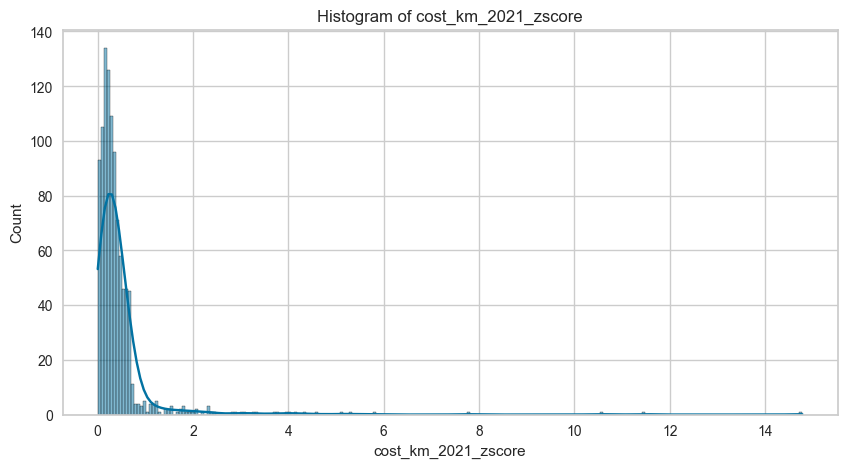

In [324]:
column_to_plot = "cost_km_2021_zscore"

# Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df_adj_zscores[column_to_plot], kde=True)
plt.title(f'Histogram of {column_to_plot}')
plt.show()

After addressing the outliers described in the last dataset, the data is better distributed around 0.

#### IQR

In [325]:
Q1 = df_adj[cont_feats].quantile(0.25)
Q3 = df_adj[cont_feats].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_iqr = ((df_adj[cont_feats] < lower_bound) | (df_adj[cont_feats] > upper_bound))

In [326]:
colors = np.where(outliers_iqr['cost_km_2021'], 'lightblue', 'pink')

##### Cost_km_2021 Outliers

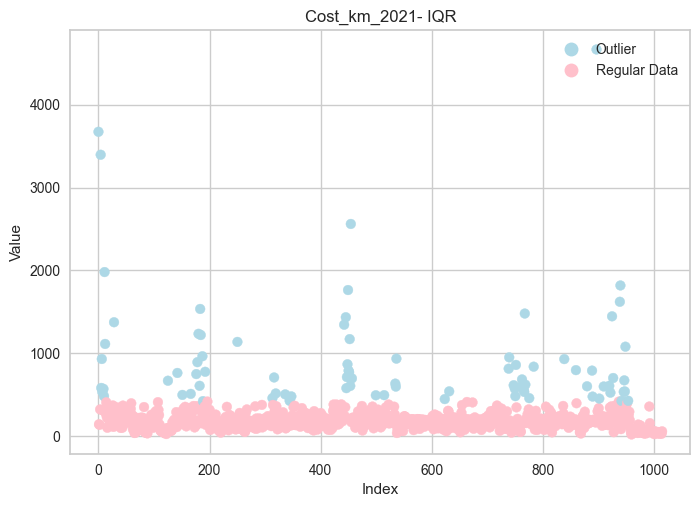

In [327]:
plt.scatter(df_adj[cont_feats].index, df_adj[cont_feats]['cost_km_2021'], c=colors)
plt.title("Cost_km_2021- IQR")
plt.xlabel("Index")
plt.ylabel("Value")


legend_elements = [Line2D([0], [0], marker='o', color='w', label='Outlier', markersize=10, markerfacecolor='lightblue'),
                   Line2D([0], [0], marker='o', color='w', label='Regular Data', markersize=10, markerfacecolor='pink')]
plt.legend(handles=legend_elements, loc='upper right')

plt.show()

There are also fewer outliers, partly because I removed many of them, but also because I adjusted the values to match the real-world conditions. This process also likely didn't remove all the outliers from the outlier list. 

I'd like to remove the remaining outliers that are greater than 650 in the above IQR outlier plot.

In [328]:
outliers_combined = outliers | outliers_iqr

In [329]:
outliers_combined['cost_km_2021'].sum()

83

In [330]:
df_adj[['city','start_year','cost_km_2021']].sort_values(by = 'cost_km_2021',ascending=False).head(5)

,city,start_year,cost_km_2021
896,Riyadh,2015,4667.427721
0,Hong Kong,2000,3673.100006
4,Hong Kong,2005,3395.851874
454,Taipei,1988,2559.853829
11,Hong Kong,2023,1978.906362


Within the above sorted df, there's a subset of the values that are both outliers and much higher than the next highest values. Specifically the top 4 values are significant outliers.

I'll remove these values because I've already gone through these values and corrected the data to match the most recent data reported for each project. These project have each endured unexpected and severe cost overruns that would not be possible to predict prior to breaking ground.

In [331]:
to_remove = outliers_combined[outliers_combined['cost_km_2021'] & (df_adj['cost_km_2021'] > 800)].index

In [332]:
len(to_remove)

30

In [333]:
df_adj = df_adj.drop(index=to_remove)

In [334]:
df_adj.shape

(985, 85)

### Low End Values Check

Looking at the dataset, there are several projects in the dataset that are abnormally cheap in relation to the other projects. Additionally, many of these projects are from China. I'd like to check the accuracy of these values.

In [335]:
low_vals = []

In [336]:
df_adj[['city','start_year','cost_km_2021']].sort_values(by = 'cost_km_2021',ascending=True).head(5)

,city,start_year,cost_km_2021
959,Croydon,1997,17.016555
1000,Sacramento,1999,21.000677
122,Paris,1993,22.233855
1013,Vitoria,2006,25.362603
1010,Tenerife,2008,26.489713


### Removing Values

In [337]:
low_vals = df_adj[['city','start_year','cost_km_2021']].sort_values(by = 'cost_km_2021',ascending=True).head(5).index

In [338]:
df_adj = df_adj.drop(index=low_vals)

### Final Check

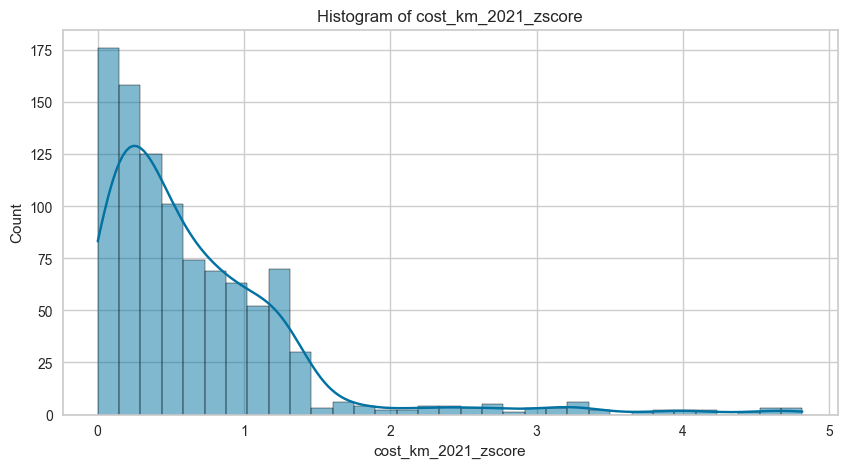

In [339]:
cont_feats = df_adj.drop(columns=['country','city','region', 'sub_region','wrb_class_value','cost_real_2021','wrb_class_name','currency']).columns.tolist()
continuous_data_array = df_adj[cont_feats].to_numpy()
df_adj['cost'] = pd.to_numeric(df_adj['cost'], errors='coerce')
df_adj['track_gauge'] = pd.to_numeric(df_adj['track_gauge'], errors='coerce')

z_scores = np.abs(zscore(continuous_data_array))
df_adj_zscores = df_adj.copy()
for i, column in enumerate(cont_feats):
    df_adj_zscores[column + '_zscore'] = z_scores[:, i]

threshold = 3
outliers = (z_scores > threshold)

column_to_plot = "cost_km_2021_zscore"

# Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df_adj_zscores[column_to_plot], kde=True)
plt.title(f'Histogram of {column_to_plot}')
plt.show()

In [340]:
threshold = 3
outliers_second = (z_scores > threshold)

In [341]:
df_adj_zscores.head(5)

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km,start_year_zscore,end_year_zscore,rr?_zscore,length_zscore,tunnel_per_zscore,tunnel_zscore,elevated_zscore,at_grade_zscore,stations_zscore,max_speed_zscore,track_gauge_zscore,overhead?_zscore,cost_zscore,year_zscore,ppp_rate_zscore,cost_real_zscore,cost_km_zscore,c_length_zscore,c_tunnel_zscore,anglo_zscore,inflation_index_zscore,cost_km_2021_zscore,duration_zscore,country_pop_den_zscore,area_km_zscore,lat_zscore,lng_zscore,population_zscore,time_diff_zscore,calculated_population_zscore,city_density_zscore,per_below_line_zscore,reporting_gdp_zscore,prob_Acrisols_zscore,prob_Albeluvisols_zscore,prob_Alisols_zscore,prob_Andosols_zscore,prob_Arenosols_zscore,prob_Calcisols_zscore,prob_Cambisols_zscore,prob_Chernozems_zscore,prob_Cryosols_zscore,prob_Durisols_zscore,prob_Ferralsols_zscore,prob_Fluvisols_zscore,prob_Gleysols_zscore,prob_Gypsisols_zscore,prob_Histosols_zscore,prob_Kastanozems_zscore,prob_Leptosols_zscore,prob_Lixisols_zscore,prob_Luvisols_zscore,prob_Nitisols_zscore,prob_Phaeozems_zscore,prob_Planosols_zscore,prob_Plinthosols_zscore,prob_Podzols_zscore,prob_Regosols_zscore,prob_Solonchaks_zscore,prob_Solonetz_zscore,prob_Stagnosols_zscore,prob_Umbrisols_zscore,prob_Vertisols_zscore,elevation_zscore,tavg_zscore,tmin_zscore,tmax_zscore,prcp_zscore,land_cost_year_zscore,price_income_ratio_zscore,mortgage_perc_income_zscore,affordability_index_zscore,urban?_zscore,rental_yield_zscore,price_rent_ratio_zscore,union_density_zscore,stations_per_km_zscore
1,HK,Hong Kong,2001,2005,0.0,3.5,0.25,0.875,0.0,2.625,2.0,80.0,1432.0,0,2000.0,HKD,2003,0.166983,333.965418,95.418691,0.0,0.0,0.0,1.47,490.929165,140.265476,4,6410.285714,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,17,6.798221e+06,23442.142396,91.142996,1653.430868,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.5,21.6,26.0,202.6,2003,6,40,0,1,4,8,21.699286,0.571429,1.374975,1.611712,0.262111,0.904662,0.140268,0.858352,0.452367,0.051277,0.986175,0.162839,0.093004,1.695244,0.092801,1.423557,0.573124,0.794453,0.197469,0.255943,0.238101,0.338974,0.705027,0.486926,0.558215,8.446738,0.79185,0.913738,0.661894,0.288371,1.423557,0.297131,3.283771,2.143907,0.917771,4.116062,0.403709,0.291516,1.566406,0.892225,0.643871,0.193523,0.601652,0.064018,0.082,3.424335,0.909526,0.464643,0.3765,0.398527,0.610984,0.349582,0.832323,0.93357,2.923087,0.541947,0.640437,0.33543,0.126704,1.03708,0.498388,0.87711,0.181076,0.18415,0.819329,0.494361,1.322206,1.678877,0.949687,2.792635,1.435011,1.256705,1.379265,0.461899,0.938615,0.172086,1.468607,0.488045,0.457252
2,HK,Hong Kong,1986,1989,0.0,4.6,1.00,4.600,0.0,0.000,1.0,80.0,1432.0,1,1254.0,HKD,1987,0.205044,257.125282,55.896800,0.0,0.0,0.0,2.39,614.529424,133.593353,3,5636.868687,Asia,Eastern Asia,290.0,22.3,114.2,7450000.0,33,6.236964e+06,21506.770731,99.471305,786.863492,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0

This is a better distribution of values. Having removed the highest value in the last iteration, the distriubtion has shifted more normally. I'll remove all the values above the threshold of 3. First, I want to look at the IQR plot.

In [342]:
df_adj.loc[735,'track_gauge'] = 1676

In [343]:
Q1 = df_adj[cont_feats].quantile(0.25)
Q3 = df_adj[cont_feats].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_iqr = ((df_adj[cont_feats] < lower_bound) | (df_adj[cont_feats] > upper_bound))

In [344]:
colors = np.where(outliers_iqr['cost_km_2021'], 'lightblue', 'pink')

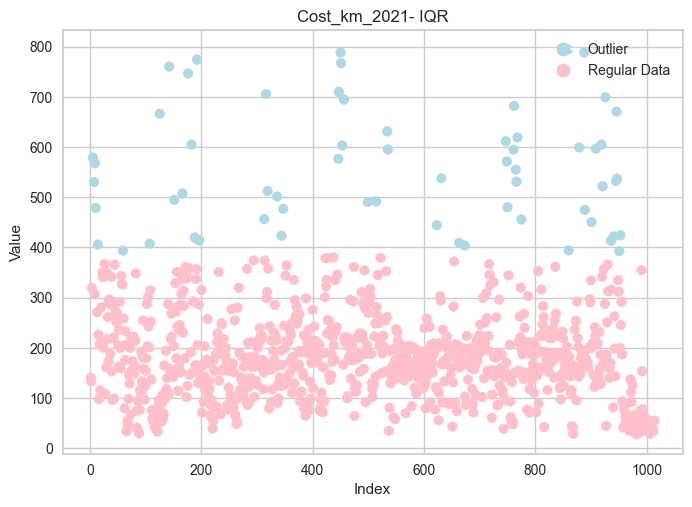

In [345]:
plt.scatter(df_adj[cont_feats].index, df_adj[cont_feats]['cost_km_2021'], c=colors)
plt.title("Cost_km_2021- IQR")
plt.xlabel("Index")
plt.ylabel("Value")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Outlier', markersize=10, markerfacecolor='lightblue'),
                   Line2D([0], [0], marker='o', color='w', label='Regular Data', markersize=10, markerfacecolor='pink')]
plt.legend(handles=legend_elements, loc='upper right')

plt.show()

Both plots look better than the previous iterations. On the final pass, I'll remove the remaining data that are above 3 standard deviations from the mean.

In [346]:
df_adj.shape

(980, 85)

In [347]:
indices_to_keep = df_adj_zscores[df_adj_zscores['cost_km_2021_zscore'] <3].index
df_adj = df_adj.loc[indices_to_keep]

In [348]:
df_adj.shape

(953, 85)

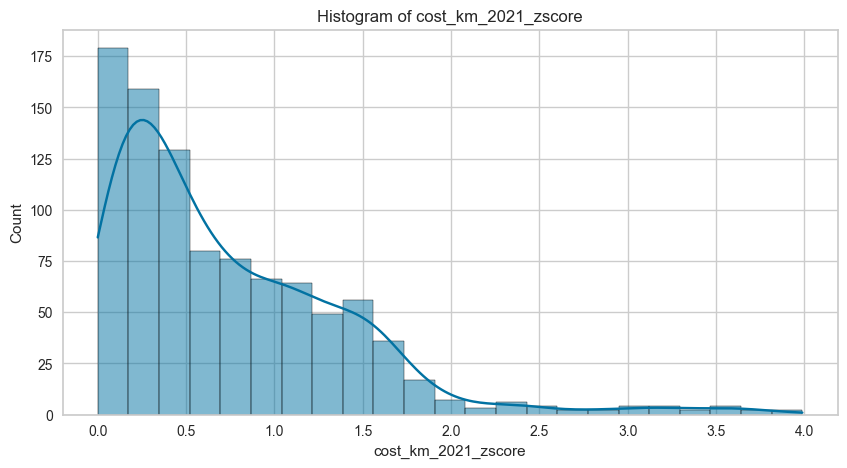

In [349]:
cont_feats = df_adj.drop(columns=['country','city','region', 'sub_region','wrb_class_value','cost_real_2021','wrb_class_name','currency']).columns.tolist()
continuous_data_array = df_adj[cont_feats].to_numpy()
df_adj['cost'] = pd.to_numeric(df_adj['cost'], errors='coerce')
df_adj['track_gauge'] = pd.to_numeric(df_adj['track_gauge'], errors='coerce')

z_scores = np.abs(zscore(continuous_data_array))
df_adj_zscores = df_adj.copy()
for i, column in enumerate(cont_feats):
    df_adj_zscores[column + '_zscore'] = z_scores[:, i]

threshold = 3
outliers = (z_scores > threshold)

column_to_plot = "cost_km_2021_zscore"  

# Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df_adj_zscores[column_to_plot], kde=True)
plt.title(f'Histogram of {column_to_plot}')
plt.show()

In [350]:
Q1 = df_adj[cont_feats].quantile(0.25)
Q3 = df_adj[cont_feats].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_iqr = ((df_adj[cont_feats] < lower_bound) | (df_adj[cont_feats] > upper_bound))

In [351]:
colors = np.where(outliers_iqr['cost_km_2021'], 'lightblue', 'pink')

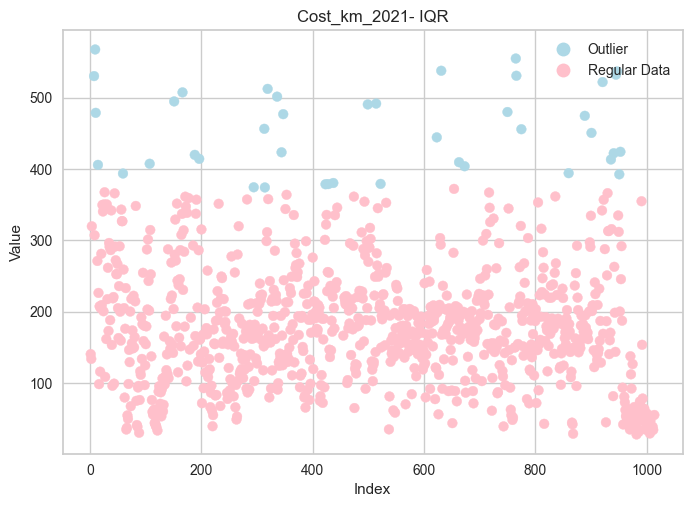

In [352]:
plt.scatter(df_adj[cont_feats].index, df_adj[cont_feats]['cost_km_2021'], c=colors)
plt.title("Cost_km_2021- IQR")
plt.xlabel("Index")
plt.ylabel("Value")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Outlier', markersize=10, markerfacecolor='lightblue'),
                   Line2D([0], [0], marker='o', color='w', label='Regular Data', markersize=10, markerfacecolor='pink')]
plt.legend(handles=legend_elements, loc='upper right')

plt.show()

### Target Variable Distribution (cost_real_2021)

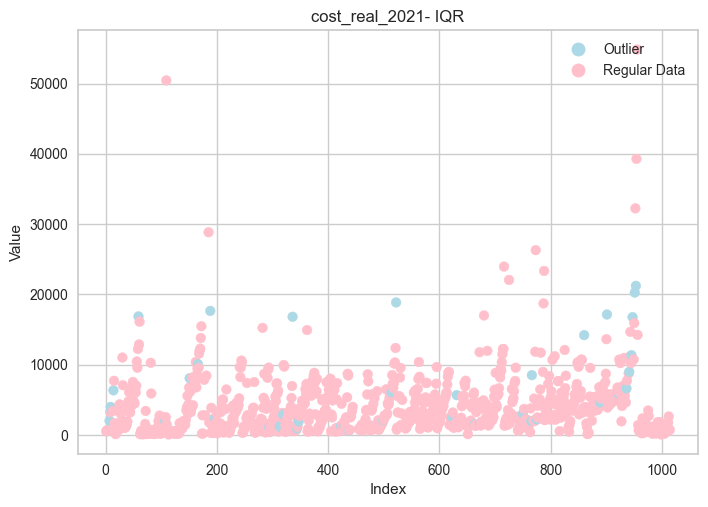

In [353]:
plt.scatter(df_adj[cont_feats].index, df_adj['cost_real_2021'], c=colors)
plt.title("cost_real_2021- IQR")
plt.xlabel("Index")
plt.ylabel("Value")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Outlier', markersize=10, markerfacecolor='lightblue'),
                   Line2D([0], [0], marker='o', color='w', label='Regular Data', markersize=10, markerfacecolor='pink')]
plt.legend(handles=legend_elements, loc='upper right')

plt.show()

Interestingly, within the target variable, the distribution of outliers is much more intermingled with the other datapoints.

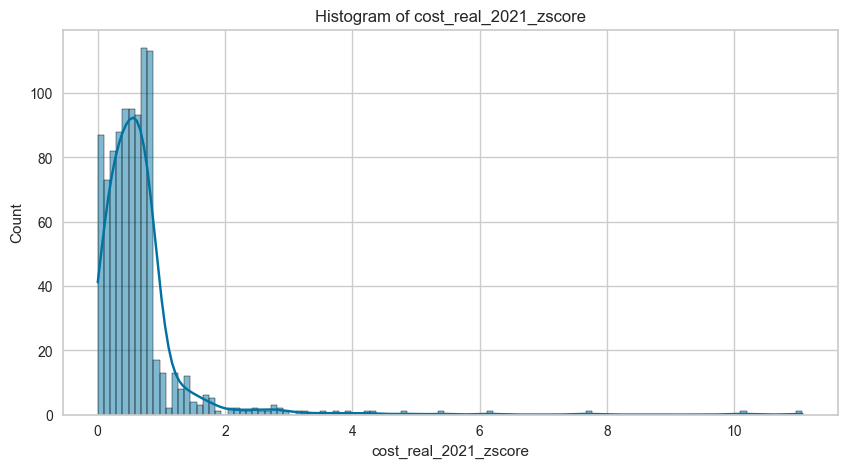

In [356]:
cont_feats = df_adj.drop(columns=['country','city','region', 'sub_region','wrb_class_value','wrb_class_name','currency']).columns.tolist()
continuous_data_array = df_adj[cont_feats].to_numpy()
df_adj['cost'] = pd.to_numeric(df_adj['cost'], errors='coerce')
df_adj['track_gauge'] = pd.to_numeric(df_adj['track_gauge'], errors='coerce')

z_scores = np.abs(zscore(continuous_data_array))
df_adj_zscores = df_adj.copy()
for i, column in enumerate(cont_feats):
    df_adj_zscores[column + '_zscore'] = z_scores[:, i]

threshold = 3
outliers = (z_scores > threshold)

column_to_plot = "cost_real_2021_zscore"

# Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df_adj_zscores[column_to_plot], kde=True)
plt.title(f'Histogram of {column_to_plot}')
plt.show()

Within the Z-score plot we can see that, in comparison to the other plots, there are few remaining outliers by count.

### Removing Target Variable Outliers

In [357]:
Q1 = df_adj['cost_real_2021'].quantile(0.25)
Q3 = df_adj['cost_real_2021'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_iqr_target = ((df_adj['cost_real_2021'] < lower_bound) | (df_adj['cost_real_2021'] > upper_bound))

In [358]:
df_adj_zscores

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km,start_year_zscore,end_year_zscore,rr?_zscore,length_zscore,tunnel_per_zscore,tunnel_zscore,elevated_zscore,at_grade_zscore,stations_zscore,max_speed_zscore,track_gauge_zscore,overhead?_zscore,cost_zscore,year_zscore,ppp_rate_zscore,cost_real_zscore,cost_km_zscore,c_length_zscore,c_tunnel_zscore,anglo_zscore,inflation_index_zscore,cost_real_2021_zscore,cost_km_2021_zscore,duration_zscore,country_pop_den_zscore,area_km_zscore,lat_zscore,lng_zscore,population_zscore,time_diff_zscore,calculated_population_zscore,city_density_zscore,per_below_line_zscore,reporting_gdp_zscore,prob_Acrisols_zscore,prob_Albeluvisols_zscore,prob_Alisols_zscore,prob_Andosols_zscore,prob_Arenosols_zscore,prob_Calcisols_zscore,prob_Cambisols_zscore,prob_Chernozems_zscore,prob_Cryosols_zscore,prob_Durisols_zscore,prob_Ferralsols_zscore,prob_Fluvisols_zscore,prob_Gleysols_zscore,prob_Gypsisols_zscore,prob_Histosols_zscore,prob_Kastanozems_zscore,prob_Leptosols_zscore,prob_Lixisols_zscore,prob_Luvisols_zscore,prob_Nitisols_zscore,prob_Phaeozems_zscore,prob_Planosols_zscore,prob_Plinthosols_zscore,prob_Podzols_zscore,prob_Regosols_zscore,prob_Solonchaks_zscore,prob_Solonetz_zscore,prob_Stagnosols_zscore,prob_Umbrisols_zscore,prob_Vertisols_zscore,elevation_zscore,tavg_zscore,tmin_zscore,tmax_zscore,prcp_zscore,land_cost_year_zscore,price_income_ratio_zscore,mortgage_perc_income_zscore,affordability_index_zscore,urban?_zscore,rental_yield_zscore,price_rent_ratio_zscore,union_density_zscore,stations_per_km_zscore
1,HK,Hong Kong,2001,2005,0.0,3.5000,0.25000,0.875000,0.000000,2.6250,2.0,80.0,1432.0,0,2.000000e+03,HKD,2003,0.166983,333.965418,95.418691,0.00,0.00,0.0,1.470000,490.929165,140.265476,4,6410.285714,Asia,Eastern Asia,290.000,22.300000,114.200000,7450000.0,17,6.798221e+06,23442.142396,91.142996,1653.430868,Acrisols,0.0,37.0,0.0,3.0,4.0,0.0,0.0,15.0,0.0,0.0,0.0,13.0,4.0,3.0,0.0,1.0,0.0,3.0,4.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.500000,21.600000,26.000000,202.600000,2003,6,40,0,1,4,8,21.699286,0.571429,1.390899,1.617147,0.261507,0.908103,0.140186,0.864441,0.449613,0.050372,0.988641,0.159803,0.091140,1.743133,0.088114,1.431497,0.617831,0.793934,0.175243,0.258316,0.241051,0.326883,0.703979,0.780544,0.490328,0.538641,8.818543,0.798137,0.938864,0.657026,0.284066,1.431497,0.292215,3.455780,2.138893,0.911800,4.136386,0.404369,0.281989,1.632375,0.910146,0.647566,0.194173,0.605270,0.064923,0.083161,3.610657,0.921155,0.464739,0.382733,0.470511,0.616641,0.346461,0.818710,0.957112,3.128362,0.543285,0.653567,0.335213,0.134814,1.045634,0.496634,0.881013,0.183709,0.186830,0.821520,0.496066,1.334262,1.714274,0.966457,2.896415,1.441906,1.266102,1.473715,0.455925,0.955853,0.185406,1.484918,0.514010,0.451904
2,HK,Hong Kong,1986,1989,0.0,4.6000,1.00000,4.600000,0.000000,0.0000,1.0,80.0,1432.0,1,1.254000e+03,HKD,1987,0.205044,257.125282,55.896800,0.00,0.00,0.0,2.390000,614.529424,133.593353,3,5636.868687,Asia,Eastern Asia,290.000,22.300000,114.20

In [359]:
df_adj.shape

(953, 85)

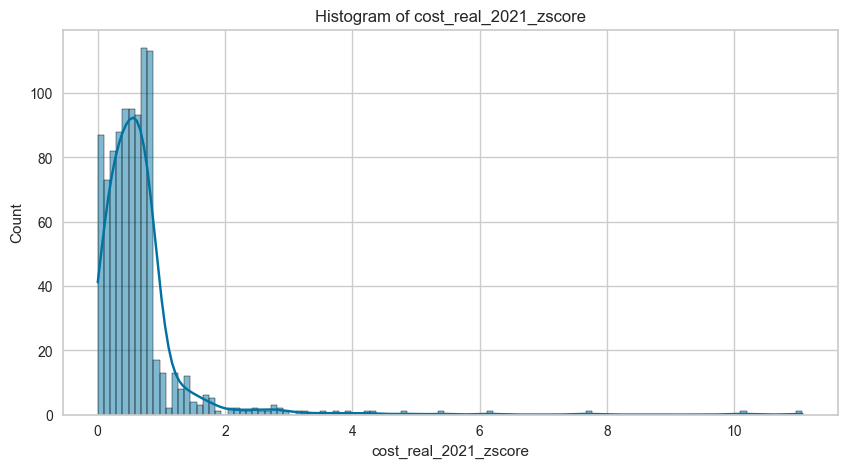

In [360]:
cont_feats = df_adj.drop(columns=['country','city','region', 'sub_region','wrb_class_value','wrb_class_name','currency']).columns.tolist()
continuous_data_array = df_adj[cont_feats].to_numpy()
df_adj['cost'] = pd.to_numeric(df_adj['cost'], errors='coerce')
df_adj['track_gauge'] = pd.to_numeric(df_adj['track_gauge'], errors='coerce')

z_scores = np.abs(zscore(continuous_data_array))
df_adj_zscores = df_adj.copy()
for i, column in enumerate(cont_feats):
    df_adj_zscores[column + '_zscore'] = z_scores[:, i]

threshold = 3
outliers = (z_scores > threshold)

column_to_plot = "cost_real_2021_zscore"

# Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df_adj_zscores[column_to_plot], kde=True)
plt.title(f'Histogram of {column_to_plot}')
plt.show()

In [361]:
df_adj_zscores[df_adj_zscores['cost_real_2021_zscore']>3]

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km,start_year_zscore,end_year_zscore,rr?_zscore,length_zscore,tunnel_per_zscore,tunnel_zscore,elevated_zscore,at_grade_zscore,stations_zscore,max_speed_zscore,track_gauge_zscore,overhead?_zscore,cost_zscore,year_zscore,ppp_rate_zscore,cost_real_zscore,cost_km_zscore,c_length_zscore,c_tunnel_zscore,anglo_zscore,inflation_index_zscore,cost_real_2021_zscore,cost_km_2021_zscore,duration_zscore,country_pop_den_zscore,area_km_zscore,lat_zscore,lng_zscore,population_zscore,time_diff_zscore,calculated_population_zscore,city_density_zscore,per_below_line_zscore,reporting_gdp_zscore,prob_Acrisols_zscore,prob_Albeluvisols_zscore,prob_Alisols_zscore,prob_Andosols_zscore,prob_Arenosols_zscore,prob_Calcisols_zscore,prob_Cambisols_zscore,prob_Chernozems_zscore,prob_Cryosols_zscore,prob_Durisols_zscore,prob_Ferralsols_zscore,prob_Fluvisols_zscore,prob_Gleysols_zscore,prob_Gypsisols_zscore,prob_Histosols_zscore,prob_Kastanozems_zscore,prob_Leptosols_zscore,prob_Lixisols_zscore,prob_Luvisols_zscore,prob_Nitisols_zscore,prob_Phaeozems_zscore,prob_Planosols_zscore,prob_Plinthosols_zscore,prob_Podzols_zscore,prob_Regosols_zscore,prob_Solonchaks_zscore,prob_Solonetz_zscore,prob_Stagnosols_zscore,prob_Umbrisols_zscore,prob_Vertisols_zscore,elevation_zscore,tavg_zscore,tmin_zscore,tmax_zscore,prcp_zscore,land_cost_year_zscore,price_income_ratio_zscore,mortgage_perc_income_zscore,affordability_index_zscore,urban?_zscore,rental_yield_zscore,price_rent_ratio_zscore,union_density_zscore,stations_per_km_zscore
109,FR,Paris,2017,2030,0.0,200.0,0.80000,160.000,40.000,0.000,68.0,70.0,1435.0,0,36100.00000,EUR,2012,1.184412,42757.263110,213.786316,0.0,0.0,0.0,1.18,50453.570470,252.267852,13,119.918547,Europe,Western Europe,2853.00,48.8567,2.3522,11060000.0,8,1.055156e+07,3698.408598,0.207014,35811.343790,Luvisols,18.0,2.0,0.0,3.0,0.0,2.0,12.0,11.0,4.0,0.0,0.0,0.0,9.0,6.0,2.0,1.0,2.0,5.0,0.0,14.0,0.0,2.0,2.0,0.0,1.0,3.0,2.0,1.0,0.0,0.0,11.0,40.0,11.675000,8.266667,15.091667,53.458333,2012,10,78,1,1,2,34,10.648056,0.340000,0.522528,1.448946,0.261507,8.717971,0.039177,9.039331,3.090540,0.245634,4.423800,0.604710,0.111224,1.743133,0.080851,0.279395,1.189862,9.434006,0.023907,0.258316,0.241051,0.326883,0.039028,10.108790,0.683002,2.578718,0.176932,0.127620,1.283800,0.925073,0.142801,0.279395,0.189242,0.178895,1.212445,1.222179,0.492519,0.404369,0.281989,0.553299,0.006166,2.261139,0.801383,0.509901,0.064923,0.083161,0.417114,0.456334,0.202273,1.672166,0.470511,0.213445,0.137315,0.930686,0.189738,0.555323,0.228639,0.135349,0.335213,0.134814,0.452014,0.041982,0.185975,0.183709,0.18683,1.028891,0.376883,0.854282,0.659144,1.058050,0.784292,0.254234,0.858984,0.990938,0.202403,0.955853,0.495487,0.029396,0.740930,1.074925
185,EG,Cairo,2019,2023,0.0,98.5,0.00000,0.000,98.500,0.000,35.0,80.0,1435.0,0,135000.00000,EGP,2022,0.213574,28832.430380,292.715029,0.0,0.0,0.0,1.00,28832.430380,292.715029,4,107.956335,Africa,Northern Africa,2010.00,30.0444,31.2358,20296000.0,-2,

In [362]:
drop_indices_target = df_adj_zscores[df_adj_zscores['cost_real_2021_zscore']>3].index
len(drop_indices_target)

13

In [363]:
df_adj = df_adj.drop(drop_indices_target)
df_adj.shape

(940, 85)

### Final Check

In [364]:
Q1 = df_adj[cont_feats].quantile(0.25)
Q3 = df_adj[cont_feats].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_iqr = ((df_adj[cont_feats] < lower_bound) | (df_adj[cont_feats] > upper_bound))

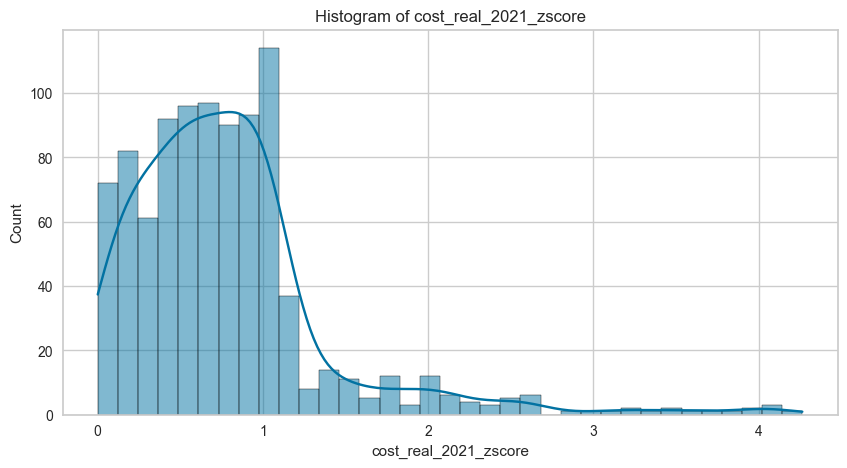

In [365]:
cont_feats = df_adj.drop(columns=['country','city','region', 'sub_region','wrb_class_value','wrb_class_name','currency']).columns.tolist()
continuous_data_array = df_adj[cont_feats].to_numpy()
df_adj['cost'] = pd.to_numeric(df_adj['cost'], errors='coerce')
df_adj['track_gauge'] = pd.to_numeric(df_adj['track_gauge'], errors='coerce')

z_scores = np.abs(zscore(continuous_data_array))
df_adj_zscores = df_adj.copy()
for i, column in enumerate(cont_feats):
    df_adj_zscores[column + '_zscore'] = z_scores[:, i]

column_to_plot = "cost_real_2021_zscore"

# Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df_adj_zscores[column_to_plot], kde=True)
plt.title(f'Histogram of {column_to_plot}')
plt.show()

In [366]:
colors = np.where(outliers_iqr['cost_real_2021'], 'lightblue', 'pink')

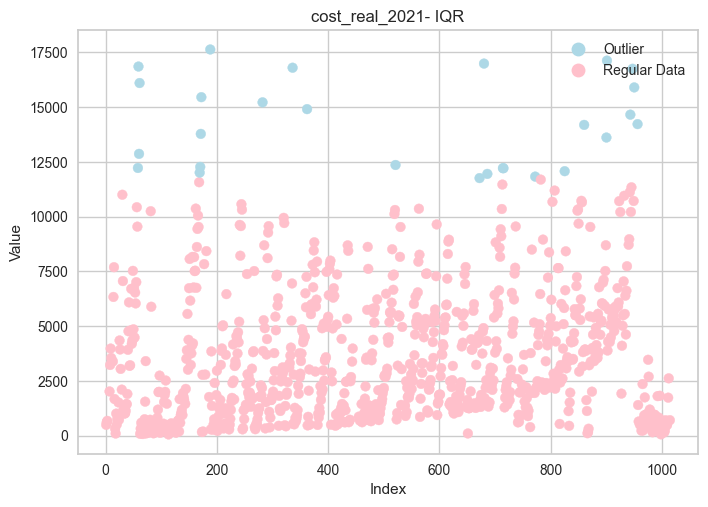

In [367]:
plt.scatter(df_adj[cont_feats].index, df_adj['cost_real_2021'], c=colors)
plt.title("cost_real_2021- IQR")
plt.xlabel("Index")
plt.ylabel("Value")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Outlier', markersize=10, markerfacecolor='lightblue'),
                   Line2D([0], [0], marker='o', color='w', label='Regular Data', markersize=10, markerfacecolor='pink')]
plt.legend(handles=legend_elements, loc='upper right')

plt.show()

In [368]:
df_adj.sort_values(by='cost_real_2021',ascending=False)

,country,city,start_year,end_year,rr?,length,tunnel_per,tunnel,elevated,at_grade,stations,max_speed,track_gauge,overhead?,cost,currency,year,ppp_rate,cost_real,cost_km,c_length,c_tunnel,anglo,inflation_index,cost_real_2021,cost_km_2021,duration,country_pop_den,region,sub_region,area_km,lat,lng,population,time_diff,calculated_population,city_density,per_below_line,reporting_gdp,wrb_class_name,wrb_class_value,prob_Acrisols,prob_Albeluvisols,prob_Alisols,prob_Andosols,prob_Arenosols,prob_Calcisols,prob_Cambisols,prob_Chernozems,prob_Cryosols,prob_Durisols,prob_Ferralsols,prob_Fluvisols,prob_Gleysols,prob_Gypsisols,prob_Histosols,prob_Kastanozems,prob_Leptosols,prob_Lixisols,prob_Luvisols,prob_Nitisols,prob_Phaeozems,prob_Planosols,prob_Plinthosols,prob_Podzols,prob_Regosols,prob_Solonchaks,prob_Solonetz,prob_Stagnosols,prob_Umbrisols,prob_Vertisols,elevation,tavg,tmin,tmax,prcp,land_cost_year,price_income_ratio,mortgage_perc_income,affordability_index,urban?,rental_yield,price_rent_ratio,union_density,stations_per_km
188,EG,Cairo,2020,2026,0.0,42.0000,1.00,42.000000,0.000000,0.0000,38.0,80.0,1435.0,0,4.000000e+04,EGY,2016,0.390155,15606.213160,371.576504,0.00,0.00,0.0,1.130000,17635.020870,419.881449,6,100.240123,Africa,Northern Africa,2010.000,30.044400,31.235800,20296000.0,4,1.875772e+07,9332.199828,64.458012,3600.913793,Leptosols,16.0,0.0,0.0,0.0,0.0,14.0,7.0,5.0,0.0,0.0,0.0,0.0,7.0,2.0,6.0,0.0,1.0,23.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,14.0,11.0,1.0,0.0,0.0,2.0,22.0,23.140000,16.000000,28.000000,19.680000,2016,10,131,0,1,7,14,23.800000,0.904762
901,SA,Riyadh,2015,2016,0.0,39.0000,0.43,16.340000,21.660000,0.0000,22.0,90.0,1435.0,0,2.460375e+04,SAR,2013,0.600072,14764.027590,388.527042,0.00,0.00,0.0,1.160000,17126.272000,450.691369,1,14.645134,Asia,Western Asia,1673.000,24.633300,46.716700,7237000.0,7,6.339295e+06,3789.178117,50.161435,23543.000000,Regosols,24.0,0.0,0.0,0.0,0.0,2.0,9.0,3.0,0.0,0.0,0.0,0.0,22.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,29.0,1.0,0.0,0.0,1.0,586.0,25.850000,18.300000,33.600000,9.166667,2013,3,22,4,1,6,16,0.000000,0.578947
680,CN,Ningbo,2013,2020,0.0,100.1000,0.90,90.090000,5.100000,5.0000,55.0,80.0,1435.0,1,6.404000e+04,CNY,2017,0.239017,15306.618770,152.913274,0.00,0.00,0.0,1.110000,16990.346840,169.733735,7,148.144225,Asia,Eastern Asia,345.000,29.875000,121.549200,4087523.0,3,3.739573e+06,10839.342838,37.855836,8016.431435,Fluvisols,11.0,10.0,1.0,3.0,1.0,0.0,0.0,17.0,0.0,0.0,0.0,1.0,22.0,8.0,0.0,1.0,0.0,3.0,2.0,13.0,0.0,0.0,1.0,0.0,1.0,5.0,1.0,2.0,0.0,0.0,4.0,8.0,16.750000,13.575000,19.925000,110.241667,2017,23,189,0,1,2,44,16.312870,0.549451
59,CN,Beijing,2013,2021,0.0,49.8000,1.00,49.800000,0.000000,0.0000,29.0,100.0,1435.0,1,6.175200e+04,CNY,2013,0.272952,16855.331904,1240.000000,0.00,0.00,0.0,1.160000,16855.331904,393.689107,8,144.645433,Asia,Eastern Asia,12796.500,39.904000,116.407500,22366547.0,7,1.943138e+07,1518.492091,69.489729,4711.635127,Luvisols,18.0,1.0,0.0,0.0,0.0,2.0,4.0,22.0,3.0,0.0,0.0,0.0,15.0,5.0,0.0,0.0,4.0,5.0,0.0,25.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,3.0,0.0,0.0,2.0,50.0,12.083333,6.491667,17.666667,48.166667,2013,25,214,0,0,3,29,16.312870,0.582329
336,IN,Mumbai,2016,2022,0.0,33.5000,1.00,33.500000,0.000000,0.0000,27.0,80.0,1435.0,1,3.340500e+05,INR,2019,0.047454,15852.008700,473.194290,0.00,0.00,0.0,1.060000,16801.496465,501.537208,6,465.194639,Asia,Southern Asia,976.000,19.076100,72.877500,24973000.0,1,2.457972e+07,25184.143862,88.900103,1580.059460,Vertisols,29.0,3.0,0.0,1.0,1.0,5.0,1.0,7.0,0.0,0.0,0.0,0.0,9.0,7.0,0.0,0.0,0.0,12.0,6.0,4.0,1.0,5.0,0.0,1.0,0.0,2.0,8.0,0.0,0.0,0.0,22.0,6.0,27.500000,22.700000,32.400000,182.083333,2019,11,125,0,1,2,34,12.133509,0.805970
947,BD,Dhaka,2020,2026,0.0,31.2000,0.64,19.968000,11.232000,0.0000,19.0,100.0,1435.0,1,5.256100e+05,BDT,2023,0.031874,16753.223890,536.962304,0.00,0.00,0.0,1.000000,16753.223890,536.962304,6,1286.171553,Asia,Southern Asia,619.000,23.763900,90.388900,18627000.0,-3,2.050280e+07,33122.449493,86.902966,1363.27825

### Last Index Removal

In the above process I idenfitied indexes that were outliers and then did my best to address, rather than remove, those outliers. In some instances, in the process of adjusting some outliers to match the available information more accurately, the resulting index may still be an outlier.

In this case, I will drop those remaining indexes here.

In [369]:
last_drop = df_adj.sort_values(by='cost_real_2021',ascending=False).head(31).index

In [370]:
df_adj = df_adj.drop(last_drop)
df_adj.shape

(909, 85)

In [371]:
colors = np.where(outliers_iqr['cost_real_2021'], 'lightblue', 'pink')

In [372]:
Q1 = df_adj[cont_feats].quantile(0.25)
Q3 = df_adj[cont_feats].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_iqr = ((df_adj[cont_feats] < lower_bound) | (df_adj[cont_feats] > upper_bound))

In [373]:
colors = np.where(outliers_iqr['cost_real_2021'], 'lightblue', 'pink')

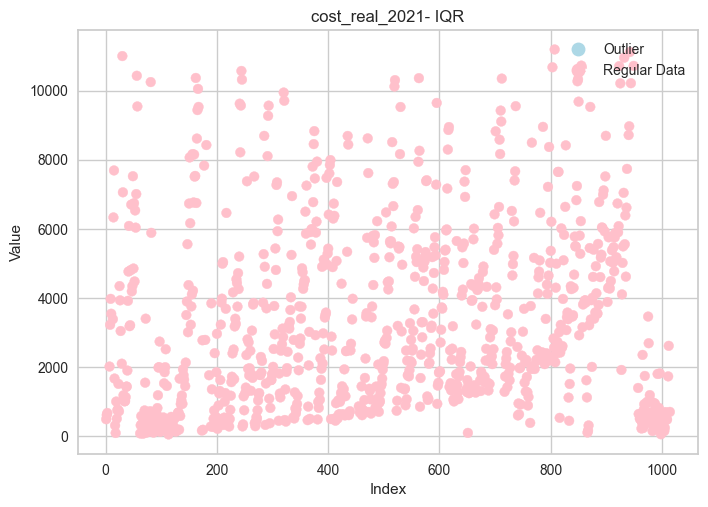

In [374]:
plt.scatter(df_adj[cont_feats].index, df_adj['cost_real_2021'], c=colors)
plt.title("cost_real_2021- IQR")
plt.xlabel("Index")
plt.ylabel("Value")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Outlier', markersize=10, markerfacecolor='lightblue'),
                   Line2D([0], [0], marker='o', color='w', label='Regular Data', markersize=10, markerfacecolor='pink')]
plt.legend(handles=legend_elements, loc='upper right')

plt.show()

### Standardized Residuals Check

In [375]:
drop_cols = ['country','city','start_year','end_year','cost','currency','cost_km','cost_real','cost_km_2021','time_diff','lat','lng','wrb_class_name']
df_model = df_adj.drop(columns =drop_cols)

In [376]:
cont_feats = df_model.drop(columns=['region', 'sub_region','wrb_class_value','cost_real_2021']).columns.tolist()
cat_feats = ['region', 'sub_region']
ordinal_feats = ['wrb_class_value']

In [377]:
data = df_model.sample(frac=0.85, random_state=786)
data_unseen = df_adj.drop(data.index)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (773, 72)
Unseen Data For Predictions: (136, 85)


In [378]:
s = setup(data,
          target = 'cost_real_2021',
          ordinal_features ={'wrb_class_value': list(range(0, 30))},
          categorical_features= cat_feats,
          numeric_features= cont_feats,
          normalize = True,
          normalize_method = 'zscore',
          verbose = False
         )

In [379]:
best = compare_models(include = ['catboost','lightgbm','rf'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,833.0168,1666972.3337,1265.6993,0.7682,0.4652,0.4092,0.8380
lightgbm,Light Gradient Boosting Machine,858.7432,1817199.1860,1321.3697,0.7451,0.4868,0.3912,0.4550
rf,Random Forest Regressor,890.7815,1955677.7240,1365.7091,0.7298,0.4500,0.4151,0.2590


Processing:   0%|          | 0/17 [00:00<?, ?it/s]

In [380]:
finalized_best = finalize_model(best)
predictions_unseen = predict_model(finalized_best, data=data_unseen)
predictions_seen = predict_model(finalized_best, data=data)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,776.0913,1474086.9596,1214.1198,0.7971,0.4575,0.3635


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,201.3672,79227.5354,281.4739,0.9890,0.2157,0.1234


In [381]:
predictions_unseen['Residuals'] = predictions_unseen['cost_real_2021'] - predictions_unseen['prediction_label']
mean_res = np.mean(predictions_unseen['Residuals'])
std_res = np.std(predictions_unseen['Residuals'])
predictions_unseen['standardized_residuals'] = (predictions_unseen['Residuals'] - mean_res) / std_res

In [382]:
predictions_seen['Residuals'] = predictions_seen['cost_real_2021'] - predictions_seen['prediction_label']
mean_res = np.mean(predictions_seen['Residuals'])
std_res = np.std(predictions_seen['Residuals'])
predictions_seen['standardized_residuals'] = (predictions_seen['Residuals'] - mean_res) / std_res

In [383]:
outliers_unseen = predictions_unseen.sort_values(by='standardized_residuals', key=abs, ascending=False)
res_list_unseen = outliers_unseen[abs(outliers_unseen['standardized_residuals'])>2].index.tolist()

In [384]:
outliers_seen = predictions_seen.sort_values(by='standardized_residuals', key=abs, ascending=False)
res_list_seen = outliers_seen[abs(outliers_seen['standardized_residuals'])>2].index.tolist()

In [385]:
len(res_list_seen)

41

In [386]:
len(res_list_unseen)

8

In [387]:
res_list = []
res_list.extend(res_list_seen)
res_list.extend(res_list_unseen)

In [388]:
len(res_list)

49

In [389]:
df_adj.drop(index=res_list,inplace=True)

## Sheet Summary

The purpose of this sheet was to re-evaluate the data after the first pass of modelling. This allowed me to verify the important components of specific lines that were determined to be outliers.

There's no clear distinction between outliers one should keep and outliers that one should discard. Throughout this sheet I've tried my best to toe the line between discarding outliers because they negatively affect the model and keeping outliers because they are a natural occurence in the process of large construction projects.

Due to the nature of construction, especially public works, cost overruns are somewhat expected. With this in mind, I did the best I could to discard erroneous datapoints while keeping accurate outliers that I could verify.

I could remove all of the points that show up as outliers in the provided IQR plot and achieve a better R-squared and lower error, however I don't believe that the model created from that data would be representative of the real-world conditions the model is likely to be used to predict.

With this adjusted dataset, I'll re-model the data and evaluate if removing/adjusting those datapoints improved the model.

## Saving Adjusted Dataframe

In [390]:
with open('pickles/df_adj.pkl', 'wb') as f:
    pickle.dump(df_adj, f)
with open('pickles/data_subset.pkl', 'wb') as f:
    pickle.dump(data_subset, f)

In [391]:
df_adj.shape

(860, 85)